# Goal of the project:  Recommend 5 best zip codes to invest in based on the time series of the average housing prices for each zip code.  

Acting as a consultant for a fictional real-estate investment firm, I interpreted the "best" places for real estate investments as places with less potential investing risks. I used the list of risks in real estate investments from [the article in Mashvisor](https://www.mashvisor.com/blog/major-risks-real-estate-investing/). From the list, I focused on the risks for making profit margins and did not consider the revenue making by renting houses. 

* Unpredictability of the Real Estate Market: As in all form of investments, there is no guarantee for making profit in real estate investments. So we will use the time series analysis to build a model to forecast the changes in house prices in future. 


* Bad Locations: Location is one of the most important factor. It determines the supply and demand thus the appreciation. 


* Lack of Liquidity (Ability to access the money within an investment): Investment properties are illiquid which means that it cannot be easily converted into cash. Therefore, we have to consider places where housing prices is somewhat stable in the long run. 


* Depreciation: This risk can be considered together with unpredictability of the market.

Based on these risks, I first considered the zip codes whose average house price in 2018 is the 99th percentile or above as it reflects the highest demand and reduce the risk of the bad locations. Then I filter the candidates with % increase in the average house price from 2017 to 2018 that zip codes that had more than 10 % increase for the latest data were picked for constructing the time series models.

# Importing libraries

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np

from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf

from statsmodels.tsa.arima_model import ARMA
import statsmodels.api as sm

import warnings
warnings.filterwarnings('ignore')
import itertools

from matplotlib.pylab import rcParams
plt.style.use('seaborn')




# Load the Data/Filtering for Chosen Zip Codes

In [133]:
df = pd.read_csv('zillow_data.csv')

In [134]:
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


## Filter 99th percentile or above house prices in 2018 with over 10% increase since 2017

In [5]:
info_cols = df.columns[:7] 
infos = df[info_cols]
#for 2017 and 2018 housing prices
values_recent = df[df.columns[-16:]]

recent = pd.concat([infos, values_recent],axis=1)
recent.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,2017-01,2017-02,2017-03,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,997000,993700,991300,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,300800,301800,302800,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,323700,322300,320700,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,1272600,1276600,1280300,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,116900,117300,117600,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


Create two new columns with average price in 2017 and 2018.

In [6]:
recent['AvgPrice_2018']= recent[recent.columns[-4:]].mean(axis=1)
recent['AvgPrice_2017'] = recent[recent.columns[-16:-4]].mean(axis=1)

Filter locations with 99% or higher average housing prices in 2018

In [7]:
q99_2018 = recent.AvgPrice_2018.quantile(q=0.99)
Highest_2018 =recent[recent.AvgPrice_2018>q99_2018]

In [8]:
Highest_2018.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 148 entries, 9 to 14711
Data columns (total 25 columns):
RegionID         148 non-null int64
RegionName       148 non-null int64
City             148 non-null object
State            148 non-null object
Metro            147 non-null object
CountyName       148 non-null object
SizeRank         148 non-null int64
2017-01          148 non-null int64
2017-02          148 non-null int64
2017-03          148 non-null int64
2017-04          148 non-null int64
2017-05          148 non-null int64
2017-06          148 non-null int64
2017-07          148 non-null int64
2017-08          148 non-null int64
2017-09          148 non-null int64
2017-10          148 non-null int64
2017-11          148 non-null int64
2017-12          148 non-null int64
2018-01          148 non-null int64
2018-02          148 non-null int64
2018-03          148 non-null int64
2018-04          148 non-null int64
AvgPrice_2018    148 non-null float64
AvgPrice_2017    148 no

Taking care of missing value in `Metro` column

In [9]:
Highest_2018[Highest_2018.Metro.isna()]

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,2017-01,2017-02,2017-03,...,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,AvgPrice_2018,AvgPrice_2017
5780,58804,2554,Nantucket,MA,NaN,Nantucket,5781,1490600,1502700,1513900,...,1590000,1592000,1588900,1587800,1585100,1594100,1626600,1656000,1615450.0,1.561017e+06


In [10]:
Highest_2018.at[5780,'Metro']= 'Not Available'

In [11]:
Highest_2018[Highest_2018.Metro.isna()]

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,2017-01,2017-02,2017-03,...,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,AvgPrice_2018,AvgPrice_2017


checking relative change in housing prices from 2018 to 2017
$$\frac{{Average Price}_{2018}- {Average Price}_{2017}}{{Average Price}_{2017}}\times 100$$

In [12]:
rel_rate =(Highest_2018.AvgPrice_2018- Highest_2018.AvgPrice_2017)/Highest_2018.AvgPrice_2017*100
rel_rate = round(rel_rate)
(rel_rate>10).sum()

23

Extract index of those with over 10 % increase.

In [13]:
top_increasing = list(rel_rate[rel_rate>10].index)

In [14]:
candidates = df.loc[top_increasing]
candidates.describe()

,RegionID,RegionName,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
count,23.000000,23.000000,23.000000,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,...,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01,2.300000e+01
mean,92854.652174,82950.869565,4445.869565,4.423609e+05,4.440348e+05,4.459043e+05,4.479652e+05,4.502783e+05,4.528826e+05,4.559043e+05,...,2.059983e+06,2.092348e+06,2.128813e+06,2.170265e+06,2.219578e+06,2.268978e+06,2.308557e+06,2.346257e+06,2.393104e+06,2.426487e+06
std,12302.182761,28746.325037,3360.447066,2.554129e+05,2.574478e+05,2.594882e+05,2.615760e+05,2.636764e+05,2.657622e+05,2.679186e+05,...,7.516684e+05,7.622912e+05,7.732317e+05,7.841276e+05,7.963703e+05,8.077247e+05,8.155290e+05,8.304678e+05,8.570721e+05,8.782560e+05
min,61000.000000,8202.000000,462.000000,2.303000e+05,2.308000e+05,2.315000e+05,2.322000e+05,2.331000e+05,2.341000e+05,2.351000e+05,...,1.300300e+06,1.333000e+06,1.372200e+06,1.419000e+06,1.466700e+06,1.498500e+06,1.520800e+06,1.547000e+06,1.582600e+06,1.607500e+06
25%,97515.500000,94024.500000,1809.000000,3.183000e+05,3.180500e+05,3.184000e+05,3.193500e+05,3.206000e+05,3.221000e+05,3.239500e+05,...,1.520750e+06,1.548950e+06,1.571400e+06,1.586450e+06,1.613350e+06,1.657600e+06,1.701200e+06,1.720800e+06,1.719400e+06,1.716750e+06
50%,97536.000000,94062.000000,3340.000000,3.613000e+05,3.633000e+05,3.653000e+05,3.674000e+05,3.696000e+05,3.720000e+05,3.747000e+05,...,1.843400e+06,1.887200e+06,1.919900e+06,1.946900e+06,1.990000e+06,2.047000e+06,2.094100e+06,2.123200e+06,2.151000e+06,2.170600e+06
75%,97815.000000,94709.000000,6677.000000,4.402000e+05,4.402000e+05,4.406000e+05,4.420000e+05,4.444000e+05,4.471000e+05,4.502500e+05,...,2.312000e+06,2.346600e+06,2.378800e+06,2.414000e+06,2.468400e+06,2.530900e+06,2.582850e+06,2.629750e+06,2.676650e+06,2.715800e+06
max,98003.000000,95135.000000,12615.000000,1.443100e+06,1.453700e+06,1.464300e+06,1.475000e+06,1.485800e+06,1.496500e+06,1.507400e+06,...,4.063900e+06,4.119000e+06,4.161200e+06,4.193900e+06,4.244400e+06,4.321700e+06,4.381800e+06,4.469700e+06,4.626100e+06,4.766600e+06


# Data Preprocessing

## Reshape from Wide to Long Format

### Helper functions

In [15]:
def get_datetimes(df):
    return pd.to_datetime(df.columns.values[7:], format='%Y-%m')

In [16]:
def melt_data(df):
    melted = pd.melt(df, id_vars=['RegionID','RegionName', 'City', 'State', 'Metro', 'CountyName','SizeRank'], var_name='time')
#     melted = pd.melt(df, id_vars=['RegionName', 'City', 'State', 'Metro', 'CountyName'], var_name='time')
    melted['time'] = pd.to_datetime(melted['time'], infer_datetime_format=True)
    melted = melted.dropna(subset=['value'])
#     return melted
    return melted.groupby('time').aggregate({'value':'mean'})

### Reshape the data format

In [141]:
#Extract time
time = get_datetimes(candidates)

In [142]:
len(time)

265

In [18]:
#Extract zip codes
zipcodes = candidates.RegionID.unique()

`timeseries` contains data from 2014 to 2018. I built models with time series including entire data from 1996 but the model with the recent 5 years worked better.   
Therefore we will use the model `timeseries` for forecasting the housing prices. 

In [19]:
timeseries =[]#time series from 2014
timeseries_full =[]#time series with full history
for i, zipcode in enumerate(zipcodes):
    timeseries.append((infos[infos.RegionID == zipcode],
                           melt_data(candidates[candidates.RegionID == zipcode])['2014':])) 
    timeseries_full.append((infos[infos.RegionID == zipcode],
                           melt_data(candidates[candidates.RegionID == zipcode]))) 

# EDA and Visualization

In [248]:
#setting up the graph formats
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 13}

plt.rc('font', **font)
# matplotlib.rc('font', **font)

# NOTE: if you visualizations are too cluttered to read, try calling 'plt.gcf().autofmt_xdate()'!

## Creating titles for plots that includes city names and zip codes

In [21]:
titles=[]
for i in range(len(zipcodes)):
    title = f'City:{timeseries[i][0].City.values[0]},{timeseries[i][0].State.values[0]}' +'   '+ f'Zipcode:{str(timeseries[i][0].RegionName.values[0])}'
    titles.append(title)

## Function used for checking stationarity

In [22]:
# Create a function to check for the stationarity of a given timeseries using rolling stats and DF test
# Collect and package the code from previous lab
def stationarity_check(ts, wd = 8):
    """
        ts = time series in pd.Series,Not pd.DataFrame 
        wd = # points in a window
        
        return:plot with rolling mean and std, Dickey-Fuller Test result
    """
    import pandas as pd
    import matplotlib.pyplot as plt
    from statsmodels.tsa.stattools import adfuller
    rolmean = ts.rolling(window =wd, center = False).mean()
    rolstd = ts.rolling(window = wd, center = False).std()
    fig = plt.figure(figsize = (12, 6))
    orig = plt.plot(ts, color ='blue', label = 'Original')
    mean = plt.plot(rolmean, color ='red', label ='Rolling Mean')
    std = plt.plot(rolstd, color ='black', label ='Rolling Std')
    plt.legend(loc ='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    
    dftest = adfuller(ts)
    dfoutput = pd.Series(dftest[0:4], index =['Test Statistic',
                                             'p-value',
                                             '#Lags Used',
                                             'Number of observation'])
    
    for key, value in dftest[4].items():
        dfoutput['Critical Value(%s)'%key] = value
    return(dfoutput)

`extend_tail` fills the rest of 2018 after April with the price value in April to avoid the error for not having consistent 
lengths when the annual change is plotted later.  

In [23]:
def extend_tail(ts):
    '''Filling the rest of months of 2018 
    with the housing price in 2018 April
    This is a neccessary step before plotting 
    as the length of values in each year should be same.
    input:timeseries
    '''
    add = pd.date_range('2018-04-01','2018-12-01', freq='M')
    index = pd.DatetimeIndex(add)
    values = list(ts['2018-04'].values[0])*8
    add_data = pd.Series(values, index = index) 
    add_data=pd.DataFrame(add_data,columns=['value'])
    extended_ts = pd.concat([ts, add_data], axis=0)
    return extended_ts 

We check the stationarity of the time series with and without the log transformation.

Stationarity check for City:Cupertino,CA   Zipcode:95014 



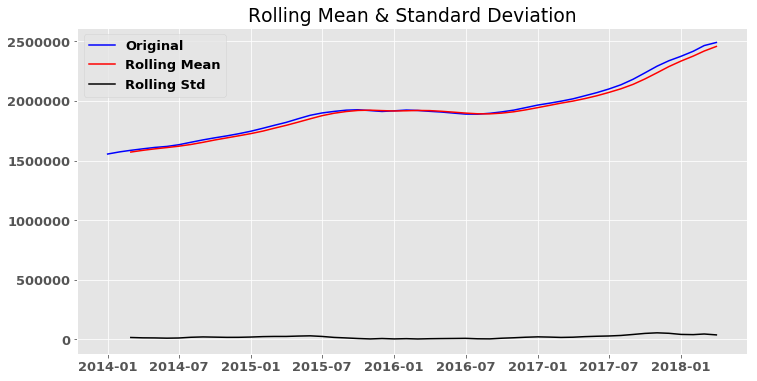

Test Statistic           -0.139126
p-value                   0.945399
#Lags Used               11.000000
Number of observation    40.000000
Critical Value(1%)       -3.605565
Critical Value(5%)       -2.937069
Critical Value(10%)      -2.606986
dtype: float64




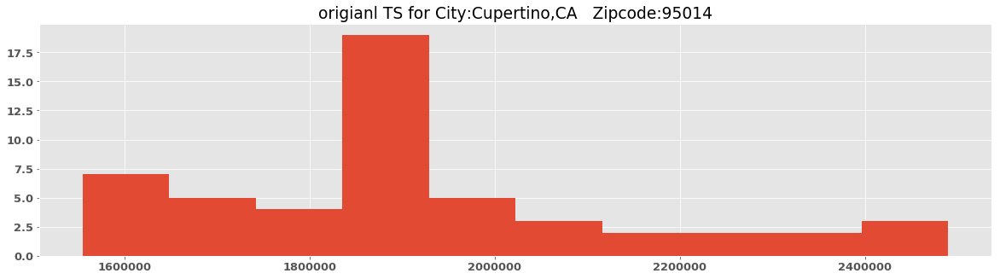

_______________________________________

Stationarity check for City:Sunnyvale,CA   Zipcode:94087 



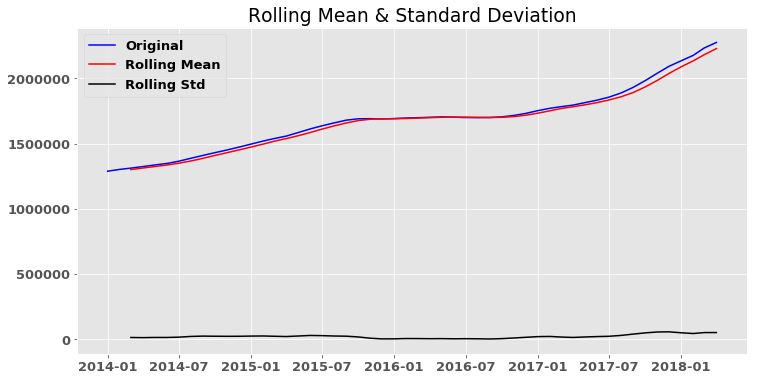

Test Statistic            0.424431
p-value                   0.982386
#Lags Used               11.000000
Number of observation    40.000000
Critical Value(1%)       -3.605565
Critical Value(5%)       -2.937069
Critical Value(10%)      -2.606986
dtype: float64




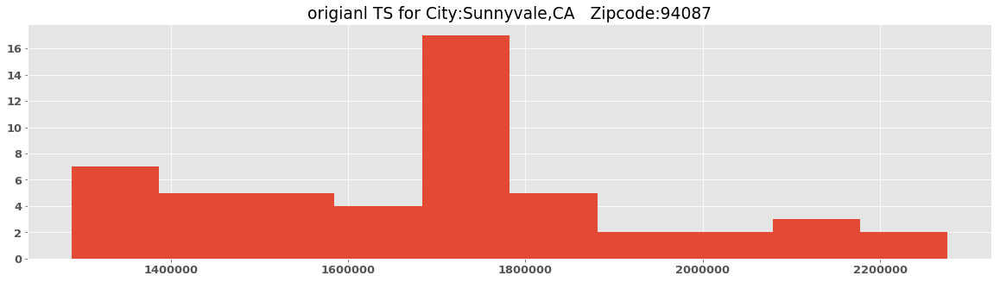

_______________________________________

Stationarity check for City:Sunnyvale,CA   Zipcode:94086 



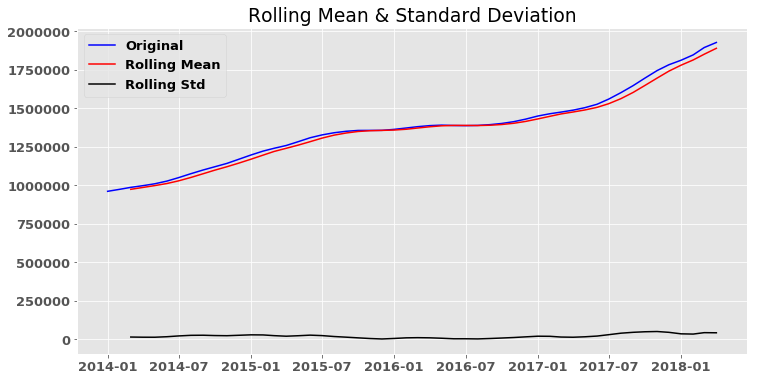

Test Statistic            0.212359
p-value                   0.972946
#Lags Used               11.000000
Number of observation    40.000000
Critical Value(1%)       -3.605565
Critical Value(5%)       -2.937069
Critical Value(10%)      -2.606986
dtype: float64




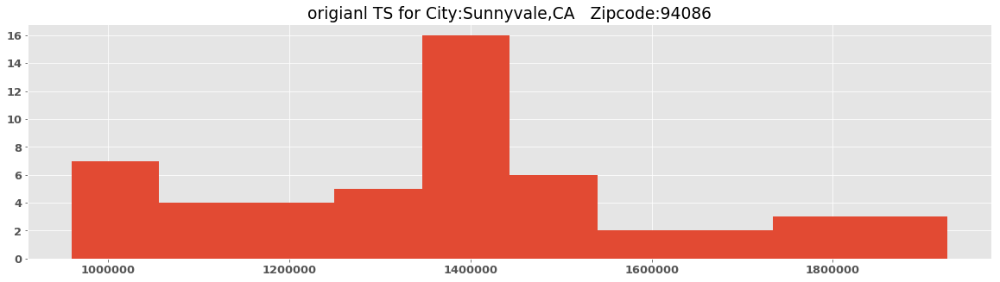

_______________________________________

Stationarity check for City:San Mateo,CA   Zipcode:94403 



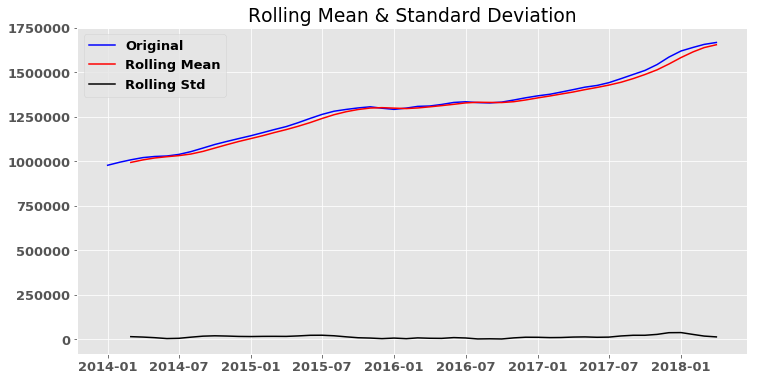

Test Statistic           -0.426393
p-value                   0.905598
#Lags Used                9.000000
Number of observation    42.000000
Critical Value(1%)       -3.596636
Critical Value(5%)       -2.933297
Critical Value(10%)      -2.604991
dtype: float64




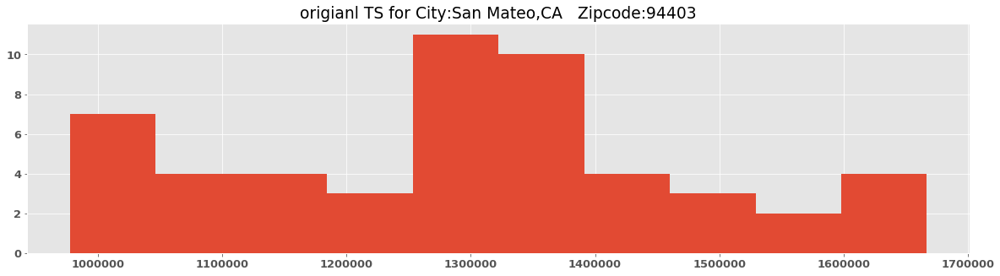

_______________________________________

Stationarity check for City:Menlo Park,CA   Zipcode:94025 



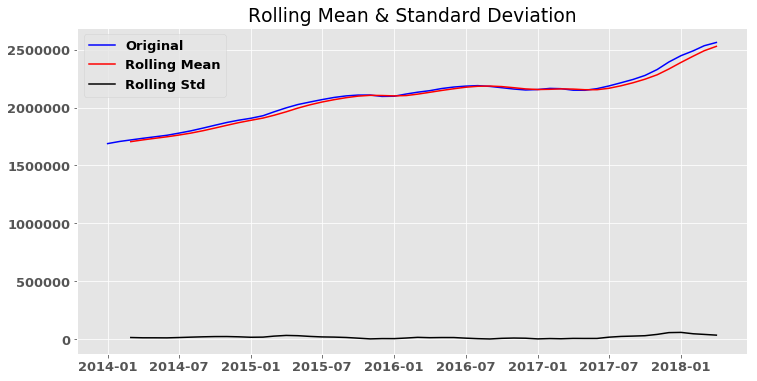

Test Statistic           -1.021206
p-value                   0.745451
#Lags Used                6.000000
Number of observation    45.000000
Critical Value(1%)       -3.584829
Critical Value(5%)       -2.928299
Critical Value(10%)      -2.602344
dtype: float64




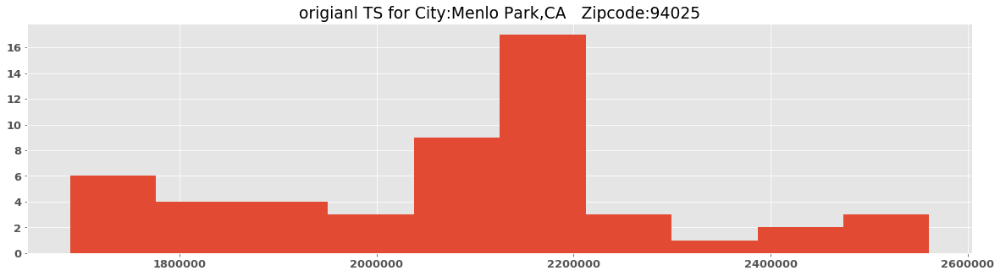

_______________________________________

Stationarity check for City:Mountain View,CA   Zipcode:94040 



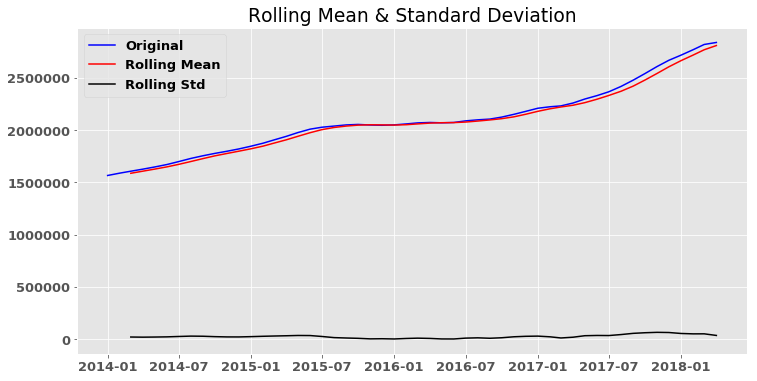

Test Statistic           -0.476865
p-value                   0.896453
#Lags Used               11.000000
Number of observation    40.000000
Critical Value(1%)       -3.605565
Critical Value(5%)       -2.937069
Critical Value(10%)      -2.606986
dtype: float64




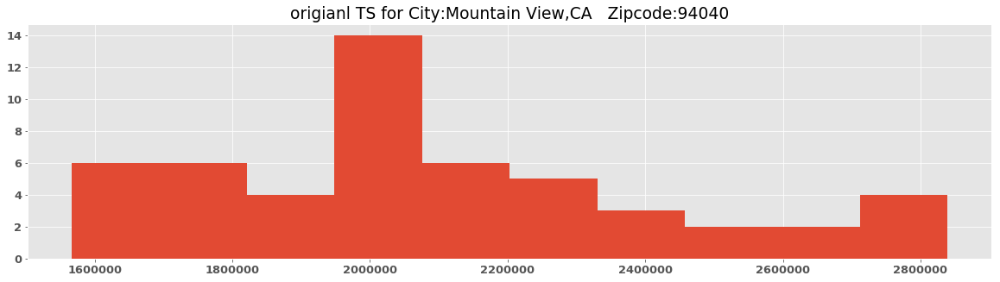

_______________________________________

Stationarity check for City:Foster City,CA   Zipcode:94404 



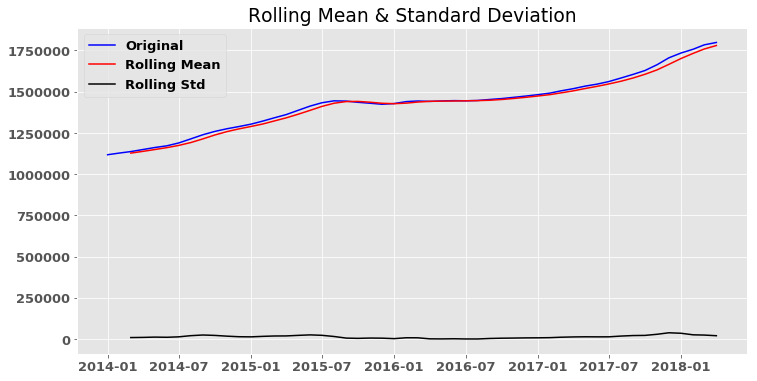

Test Statistic           -0.323239
p-value                   0.922148
#Lags Used                5.000000
Number of observation    46.000000
Critical Value(1%)       -3.581258
Critical Value(5%)       -2.926785
Critical Value(10%)      -2.601541
dtype: float64




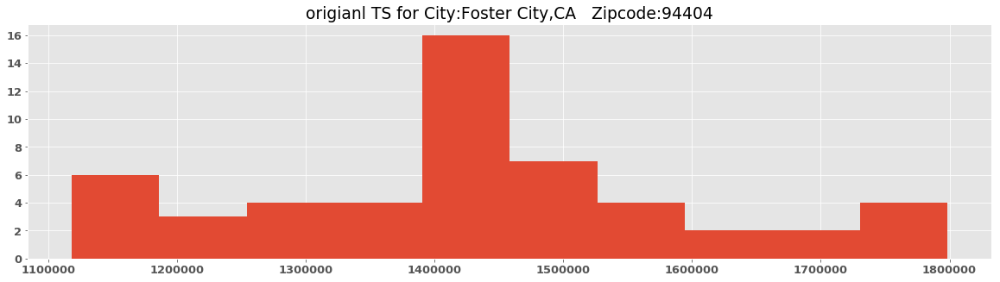

_______________________________________

Stationarity check for City:San Jose,CA   Zipcode:95129 



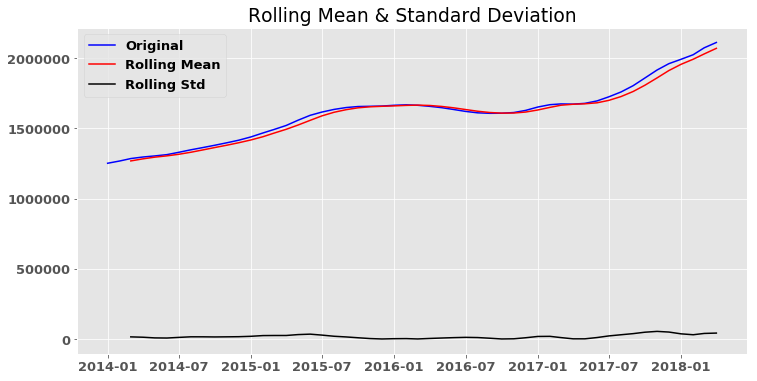

Test Statistic           -0.503959
p-value                   0.891242
#Lags Used                9.000000
Number of observation    42.000000
Critical Value(1%)       -3.596636
Critical Value(5%)       -2.933297
Critical Value(10%)      -2.604991
dtype: float64




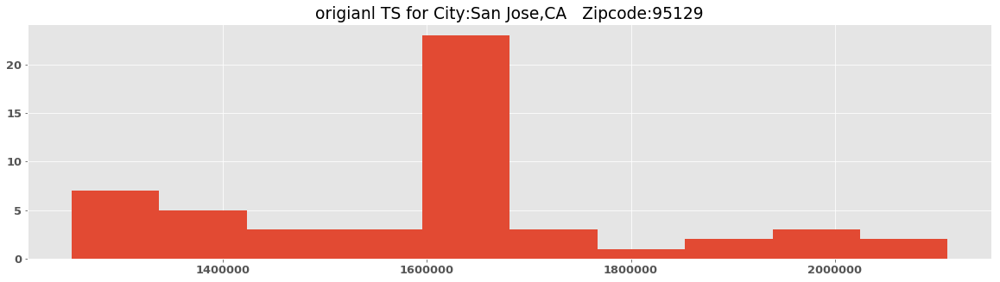

_______________________________________

Stationarity check for City:Redwood City,CA   Zipcode:94061 



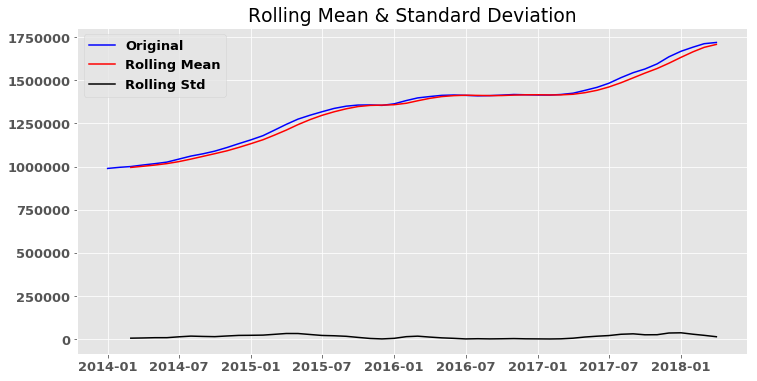

Test Statistic           -1.521718
p-value                   0.522742
#Lags Used                9.000000
Number of observation    42.000000
Critical Value(1%)       -3.596636
Critical Value(5%)       -2.933297
Critical Value(10%)      -2.604991
dtype: float64




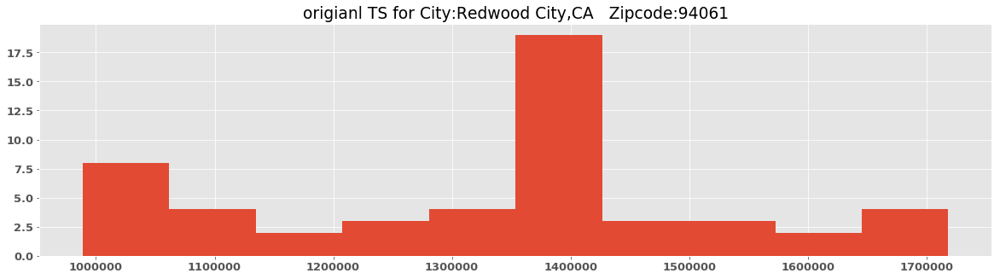

_______________________________________

Stationarity check for City:Mountain View,CA   Zipcode:94043 



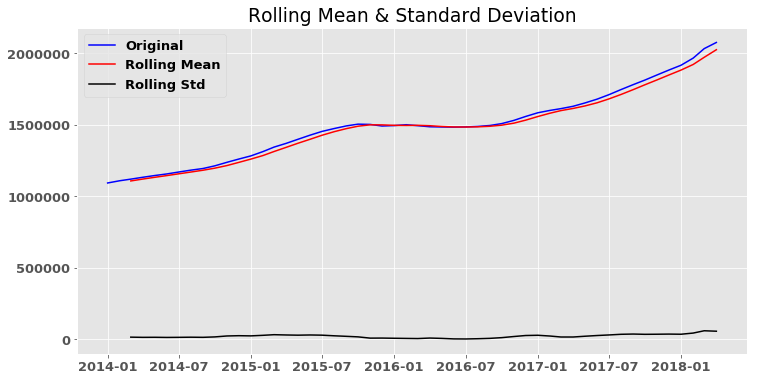

Test Statistic            0.459911
p-value                   0.983602
#Lags Used                4.000000
Number of observation    47.000000
Critical Value(1%)       -3.577848
Critical Value(5%)       -2.925338
Critical Value(10%)      -2.600774
dtype: float64




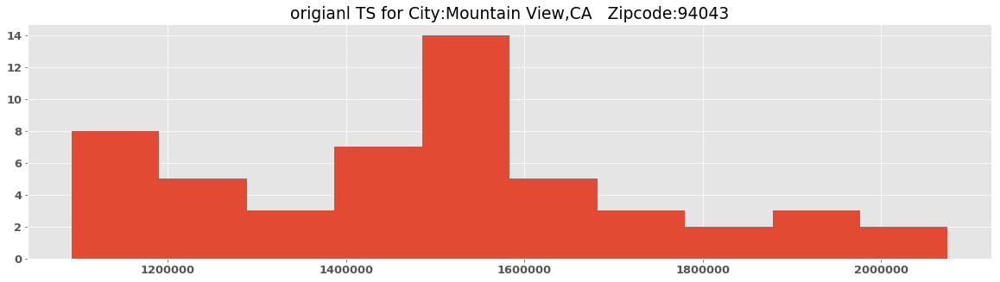

_______________________________________

Stationarity check for City:San Jose,CA   Zipcode:95120 



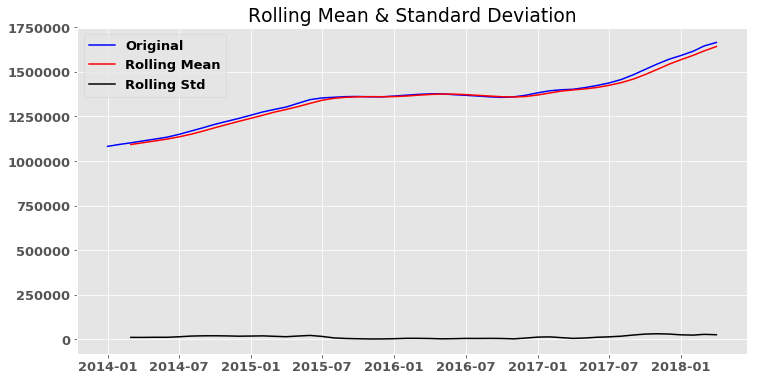

Test Statistic           -0.318832
p-value                   0.922794
#Lags Used               11.000000
Number of observation    40.000000
Critical Value(1%)       -3.605565
Critical Value(5%)       -2.937069
Critical Value(10%)      -2.606986
dtype: float64




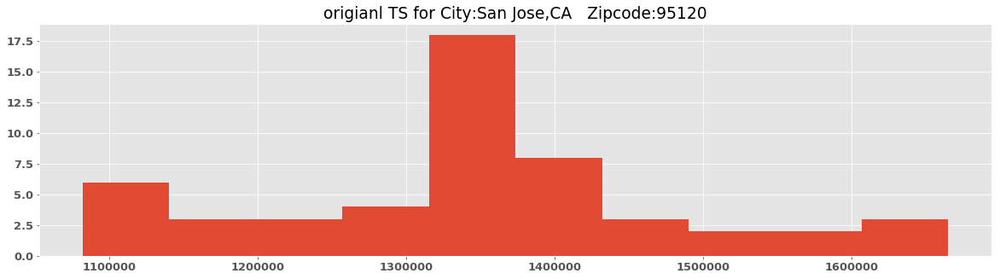

_______________________________________

Stationarity check for City:Palo Alto,CA   Zipcode:94306 



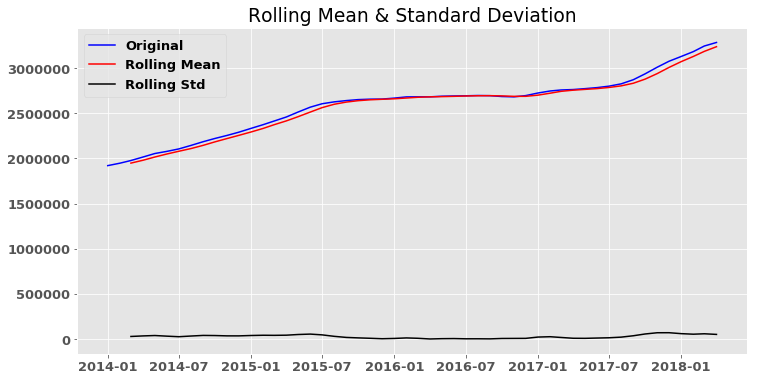

Test Statistic           -1.017960
p-value                   0.746657
#Lags Used                4.000000
Number of observation    47.000000
Critical Value(1%)       -3.577848
Critical Value(5%)       -2.925338
Critical Value(10%)      -2.600774
dtype: float64




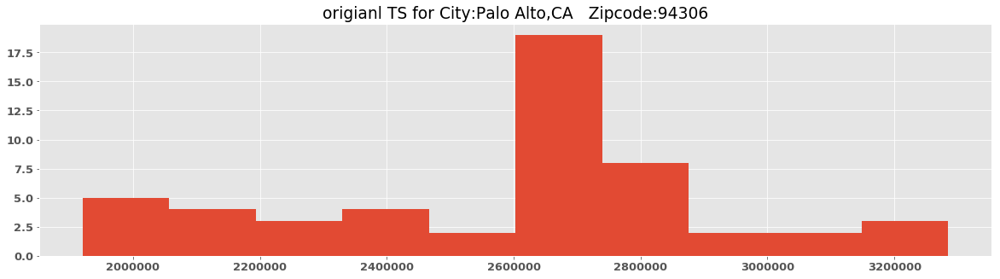

_______________________________________

Stationarity check for City:Redwood City,CA   Zipcode:94062 



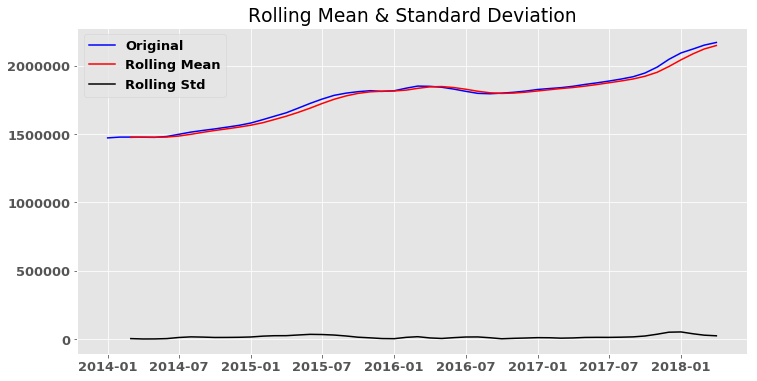

Test Statistic           -0.680121
p-value                   0.851832
#Lags Used                4.000000
Number of observation    47.000000
Critical Value(1%)       -3.577848
Critical Value(5%)       -2.925338
Critical Value(10%)      -2.600774
dtype: float64




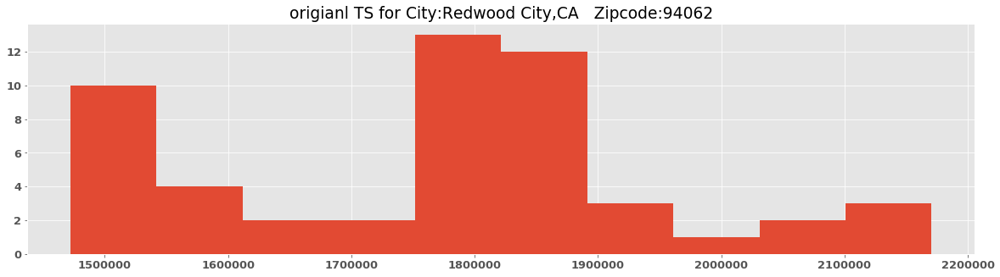

_______________________________________

Stationarity check for City:Los Altos,CA   Zipcode:94024 



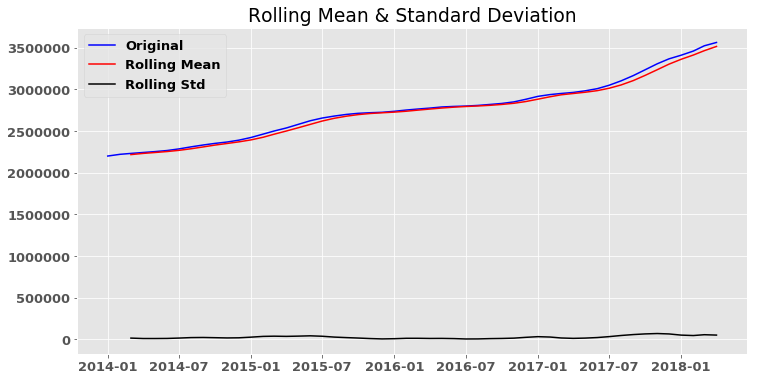

Test Statistic            0.300873
p-value                   0.977385
#Lags Used               11.000000
Number of observation    40.000000
Critical Value(1%)       -3.605565
Critical Value(5%)       -2.937069
Critical Value(10%)      -2.606986
dtype: float64




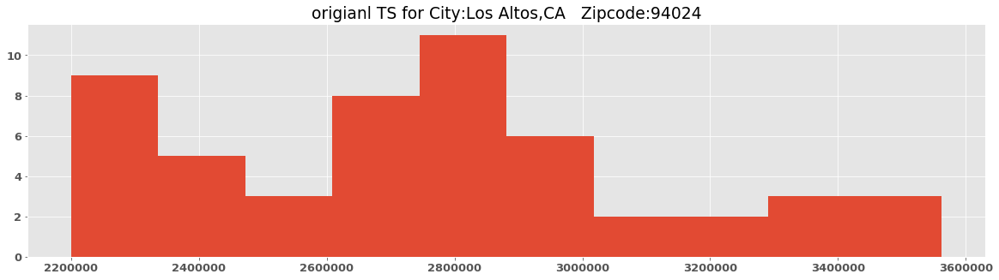

_______________________________________

Stationarity check for City:Los Altos,CA   Zipcode:94022 



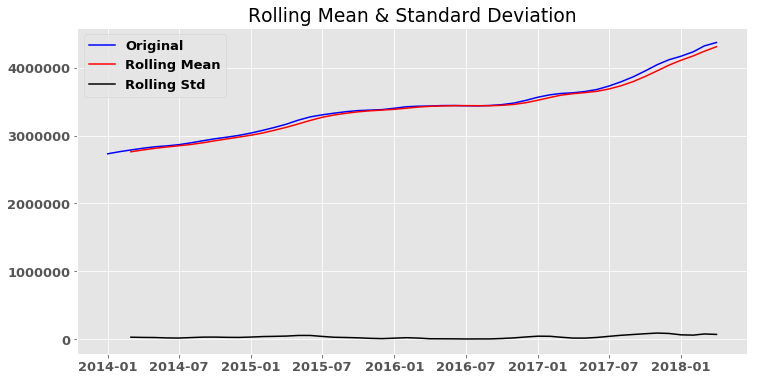

Test Statistic            0.081930
p-value                   0.964806
#Lags Used                9.000000
Number of observation    42.000000
Critical Value(1%)       -3.596636
Critical Value(5%)       -2.933297
Critical Value(10%)      -2.604991
dtype: float64




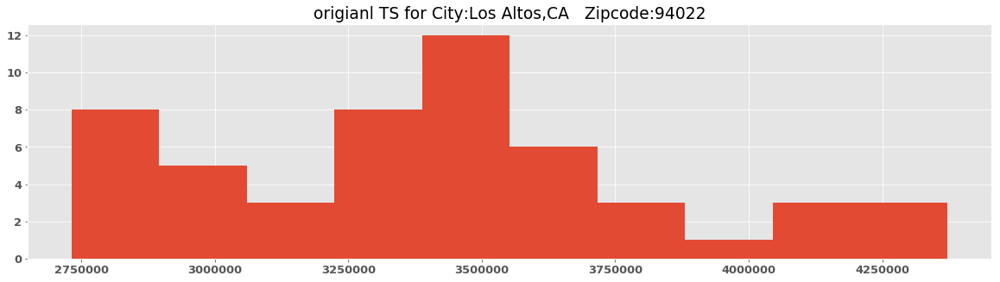

_______________________________________

Stationarity check for City:San Jose,CA   Zipcode:95135 



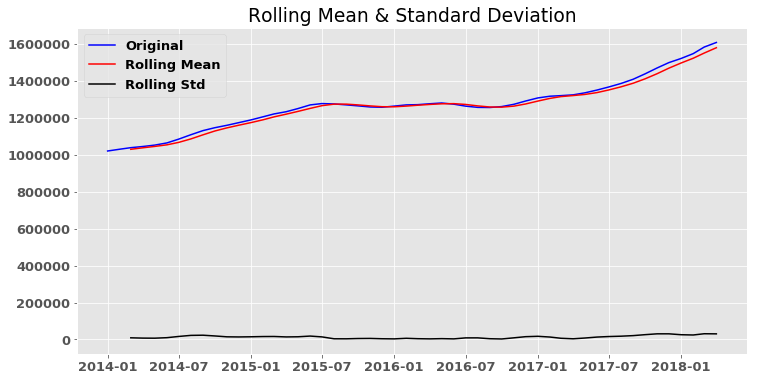

Test Statistic            0.023620
p-value                   0.960442
#Lags Used                5.000000
Number of observation    46.000000
Critical Value(1%)       -3.581258
Critical Value(5%)       -2.926785
Critical Value(10%)      -2.601541
dtype: float64




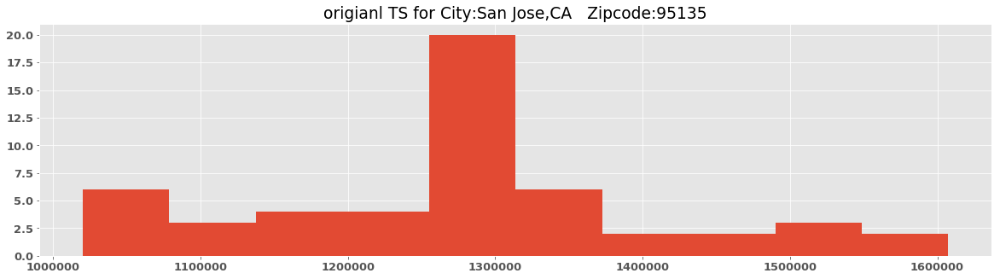

_______________________________________

Stationarity check for City:Mountain View,CA   Zipcode:94041 



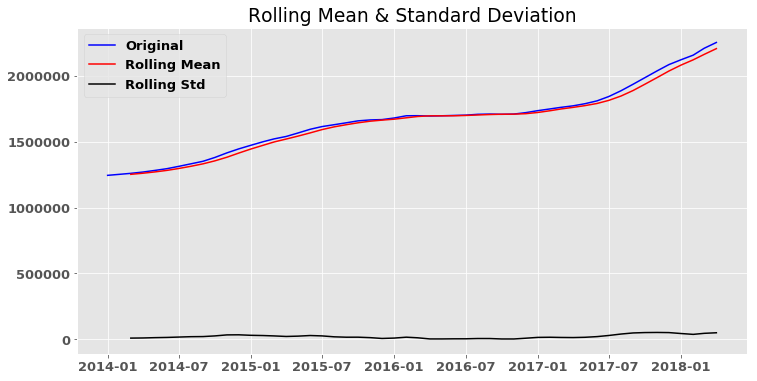

Test Statistic            0.434568
p-value                   0.982743
#Lags Used                9.000000
Number of observation    42.000000
Critical Value(1%)       -3.596636
Critical Value(5%)       -2.933297
Critical Value(10%)      -2.604991
dtype: float64




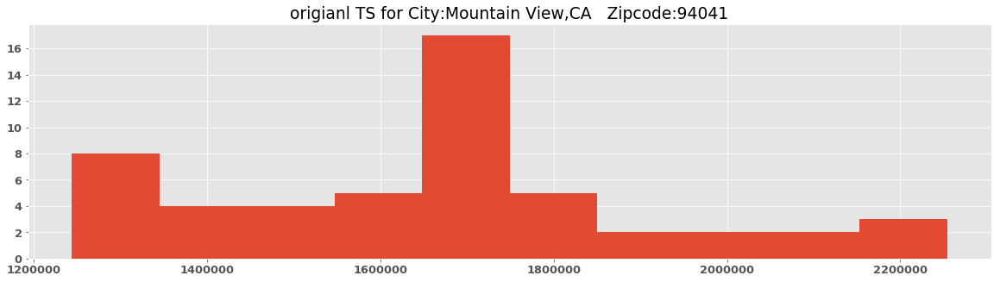

_______________________________________

Stationarity check for City:Noyack,NY   Zipcode:11963 



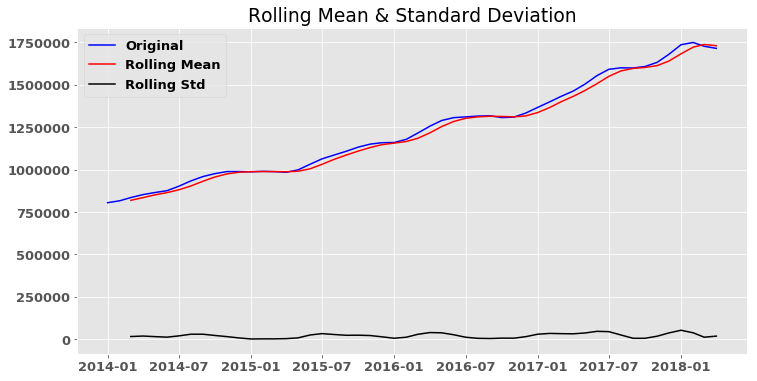

Test Statistic            1.311675
p-value                   0.996674
#Lags Used                6.000000
Number of observation    45.000000
Critical Value(1%)       -3.584829
Critical Value(5%)       -2.928299
Critical Value(10%)      -2.602344
dtype: float64




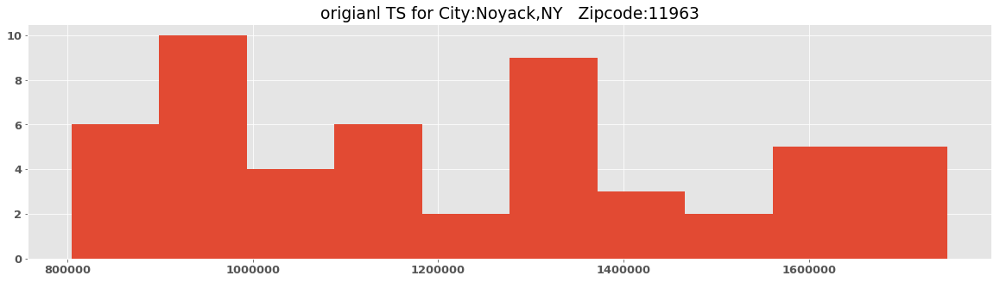

_______________________________________

Stationarity check for City:Los Gatos,CA   Zipcode:95030 



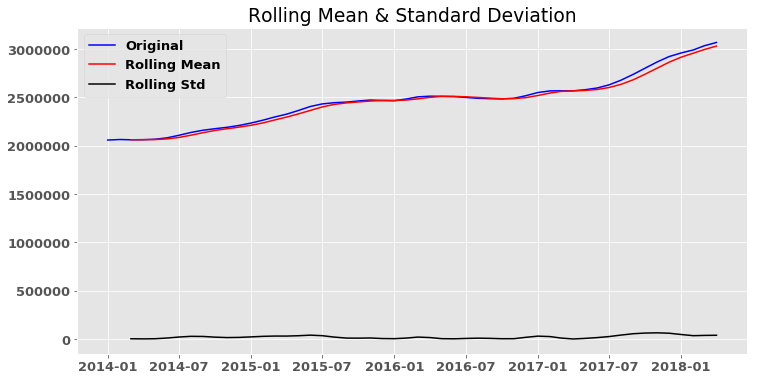

Test Statistic           -0.131133
p-value                   0.946248
#Lags Used               11.000000
Number of observation    40.000000
Critical Value(1%)       -3.605565
Critical Value(5%)       -2.937069
Critical Value(10%)      -2.606986
dtype: float64




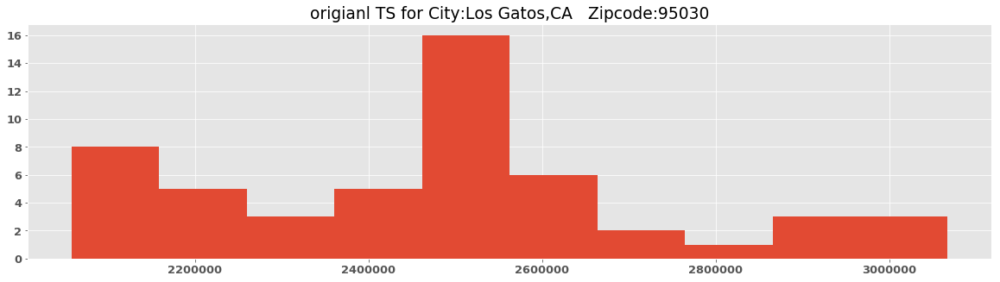

_______________________________________

Stationarity check for City:Aspen,CO   Zipcode:81611 



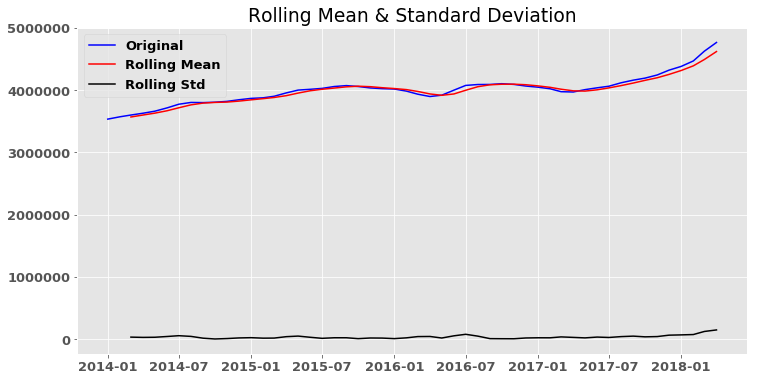

Test Statistic            0.886210
p-value                   0.992908
#Lags Used                8.000000
Number of observation    43.000000
Critical Value(1%)       -3.592504
Critical Value(5%)       -2.931550
Critical Value(10%)      -2.604066
dtype: float64




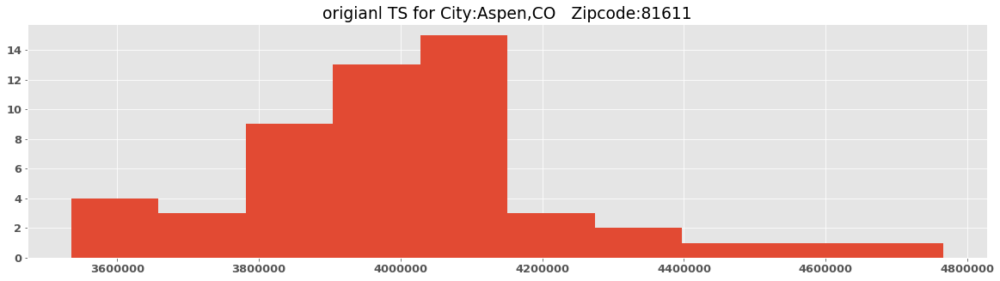

_______________________________________

Stationarity check for City:San Jose,CA   Zipcode:95130 



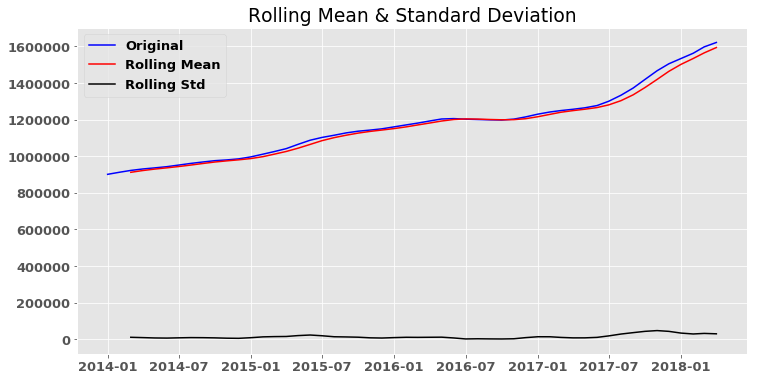

Test Statistic            0.424781
p-value                   0.982398
#Lags Used               11.000000
Number of observation    40.000000
Critical Value(1%)       -3.605565
Critical Value(5%)       -2.937069
Critical Value(10%)      -2.606986
dtype: float64




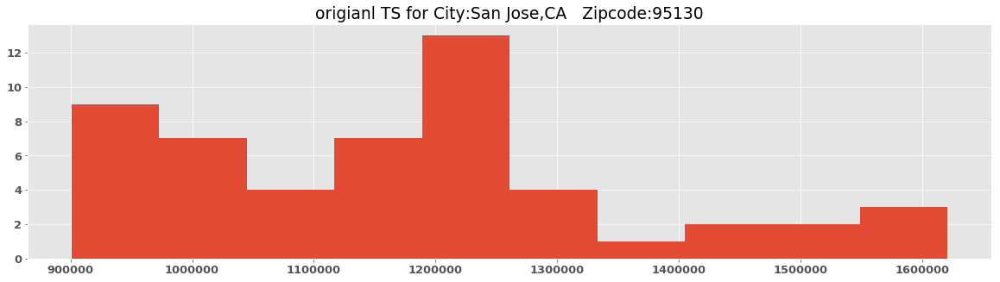

_______________________________________

Stationarity check for City:Avalon,NJ   Zipcode:8202 



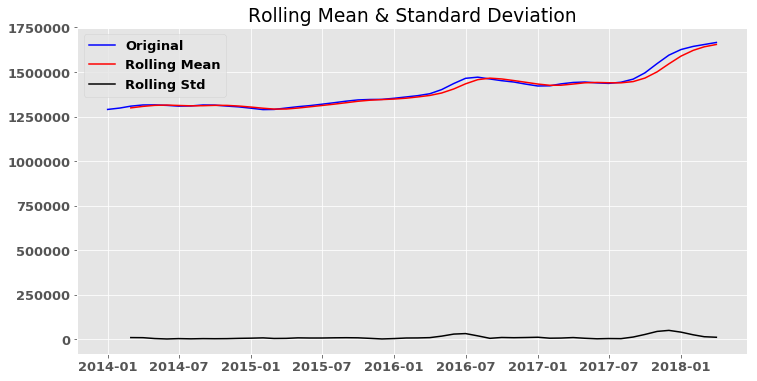

Test Statistic            1.501423
p-value                   0.997530
#Lags Used                9.000000
Number of observation    42.000000
Critical Value(1%)       -3.596636
Critical Value(5%)       -2.933297
Critical Value(10%)      -2.604991
dtype: float64




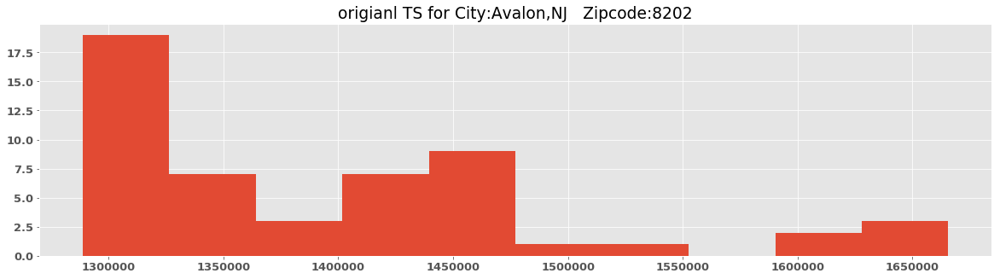

_______________________________________

Stationarity check for City:Bridgehampton,NY   Zipcode:11932 



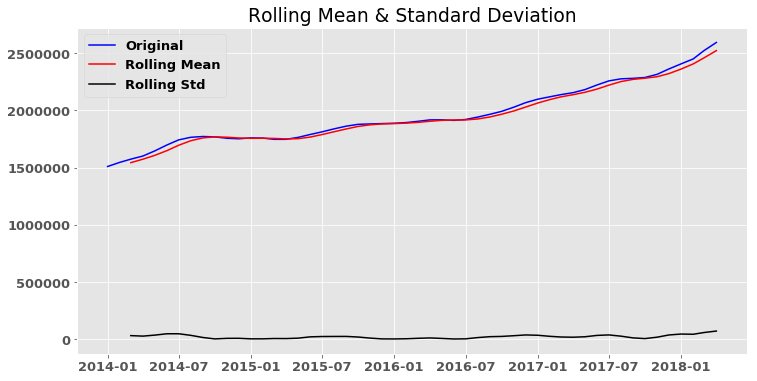

Test Statistic            3.191449
p-value                   1.000000
#Lags Used                9.000000
Number of observation    42.000000
Critical Value(1%)       -3.596636
Critical Value(5%)       -2.933297
Critical Value(10%)      -2.604991
dtype: float64




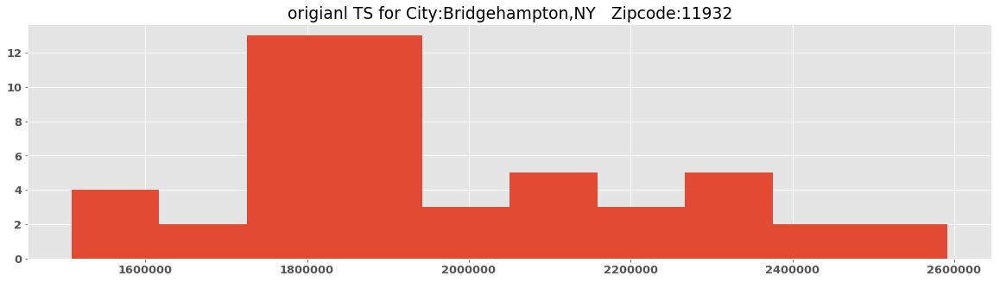

_______________________________________



In [130]:
for i in range(len(zipcodes)):
    ts = timeseries[i][1].squeeze()
    print('Stationarity check for',titles[i],'\n')

    out1 = stationarity_check(ts, wd = 3)
    print(out1)
    print('\n')

    fig,ax = plt.subplots(figsize = (20,5))
    
    ts.hist(ax=ax)
    ax.set_title('origianl TS for '+titles[i])
    
    plt.show()
    print('_______________________________________\n')

### Observations from the EDA (part 1):
* There are increasing trend for all time series.
* They don't seem to have seasonality in each plot. 
* The rolling standard deviation for each time series stays steady through out the entire time range (2014 - 2018). 
* Dicky-Fuller test shows that all 23 time series are non-stationary.
* log transformation helps the time series to be more symmetric in the histograms. 


## Demonstration of annual changes in house prices

**Note: The values after 2018 May are filled with the value in 2018 April to avoid an error so it does not represent what actually happened.** 

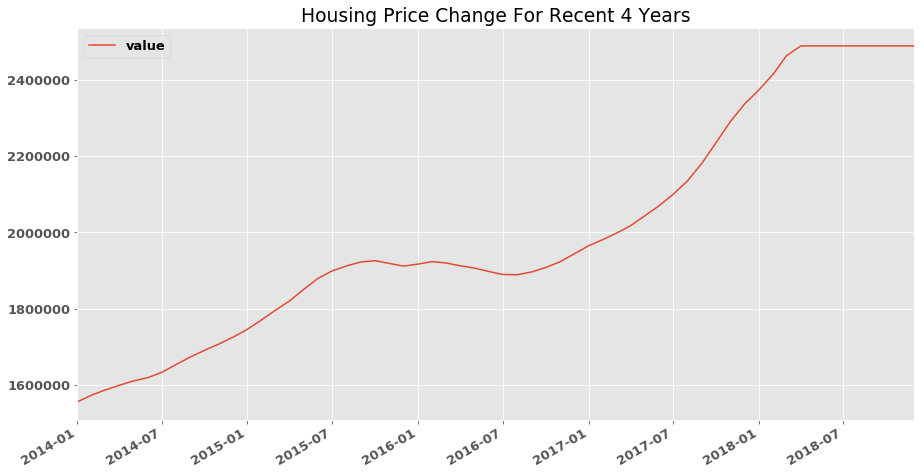

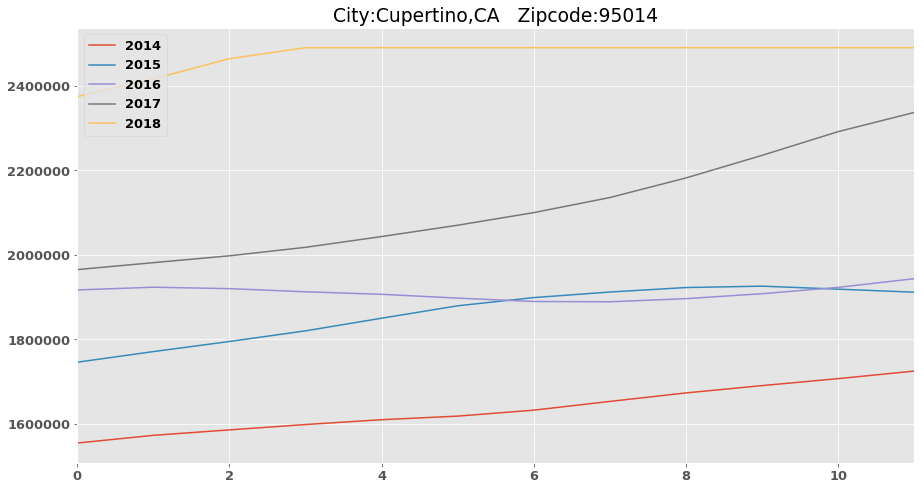

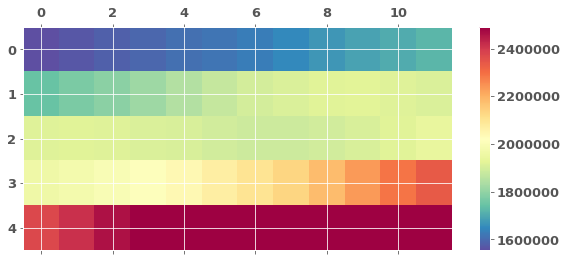

---------------------------



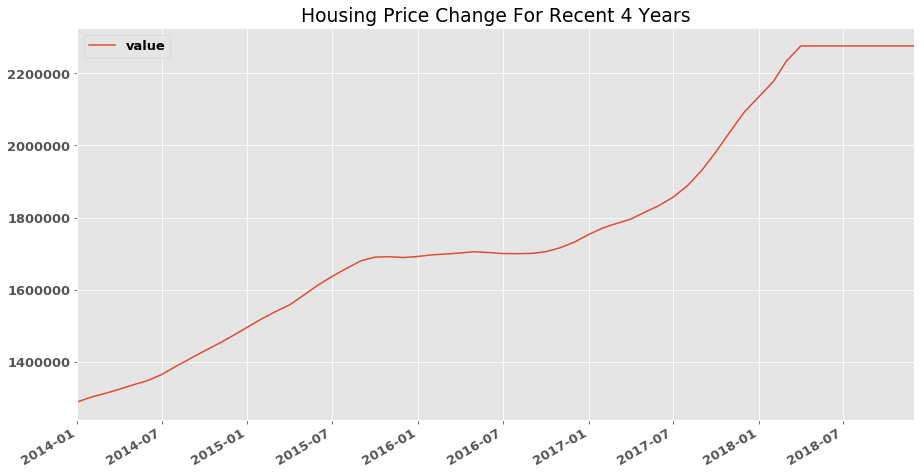

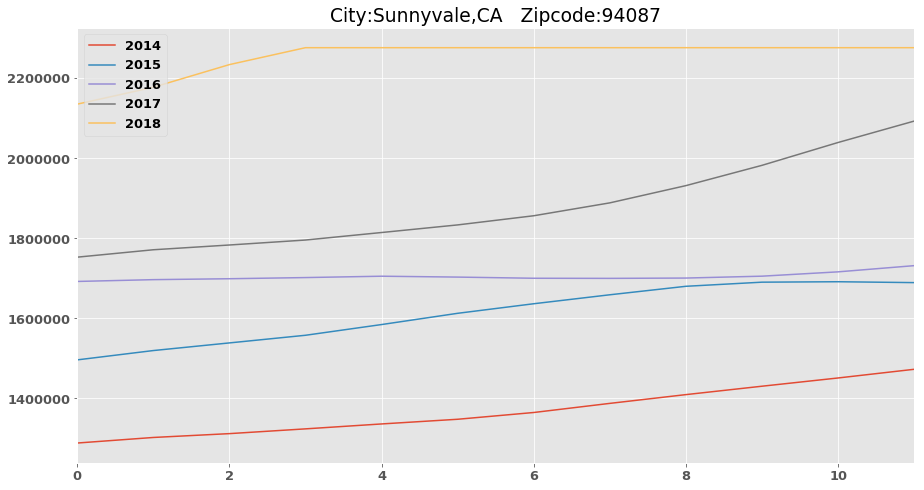

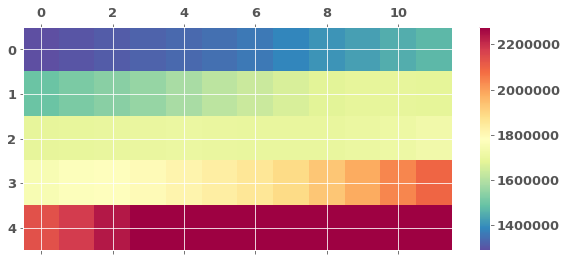

---------------------------



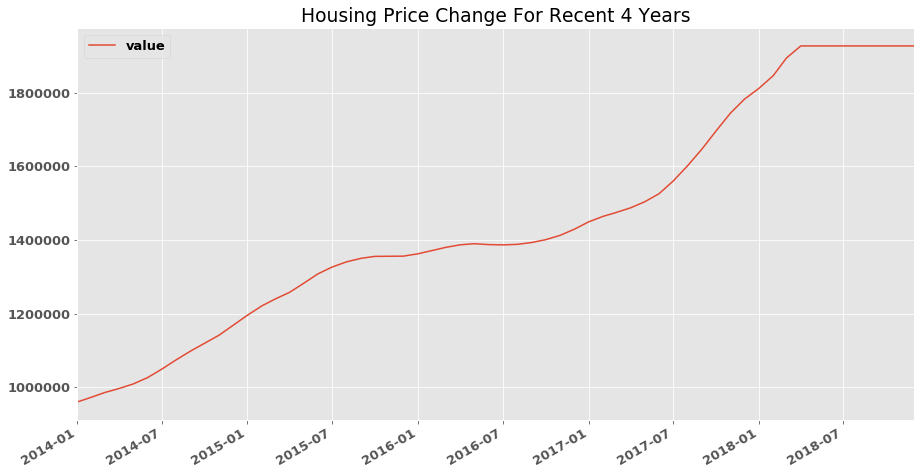

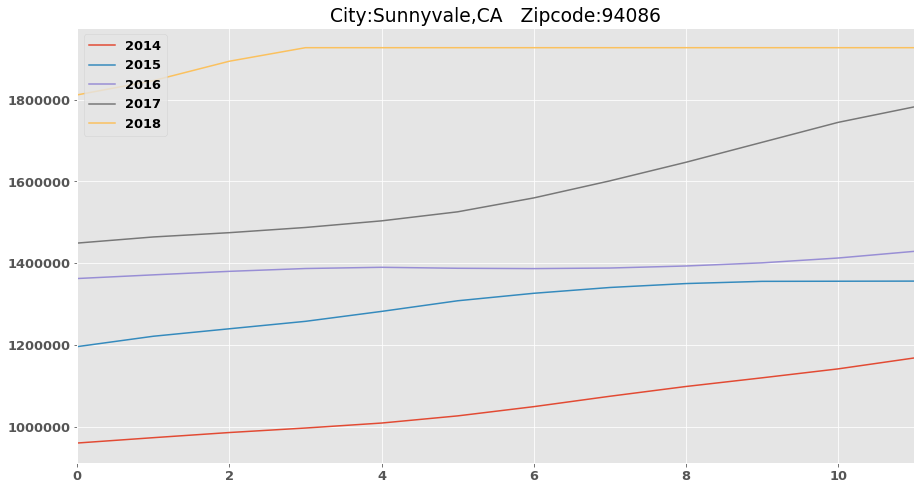

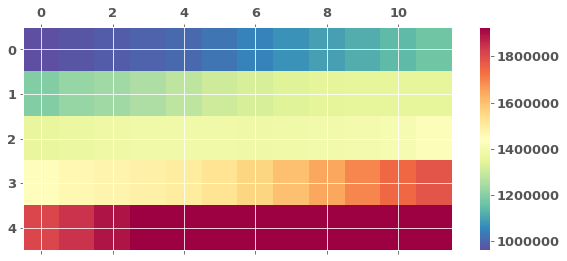

---------------------------



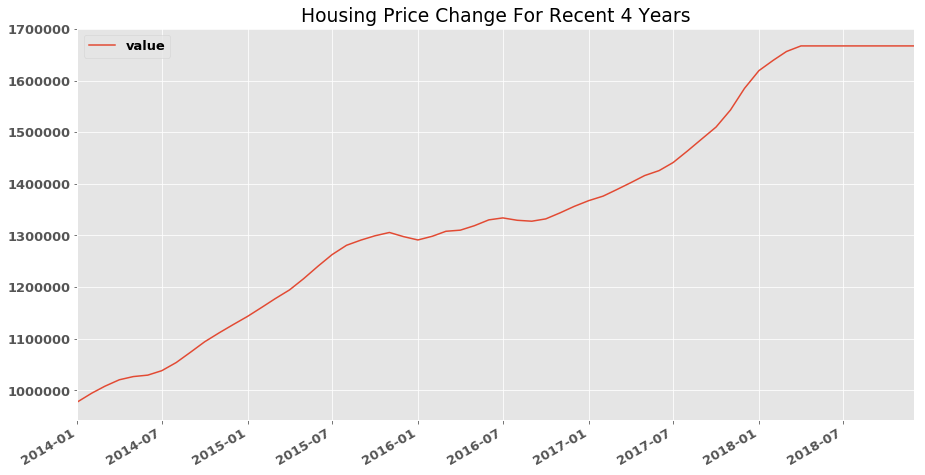

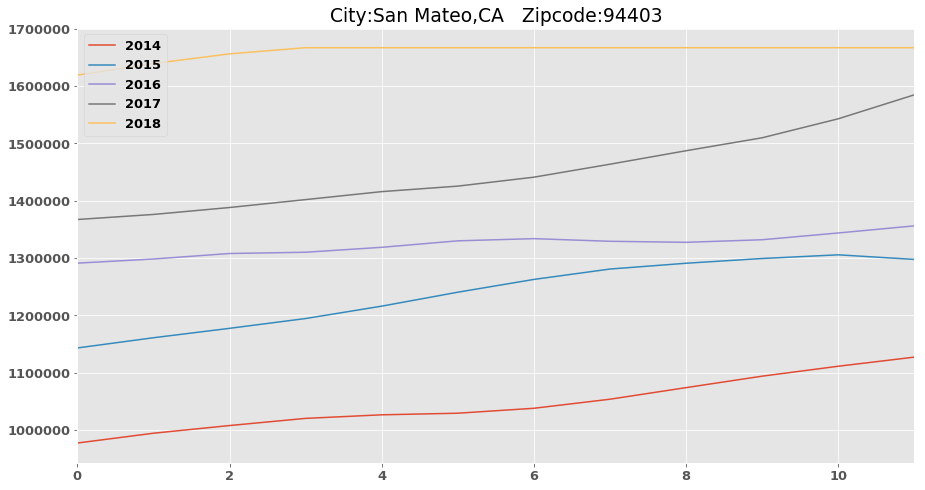

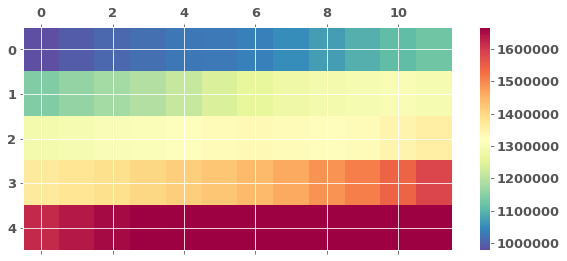

---------------------------



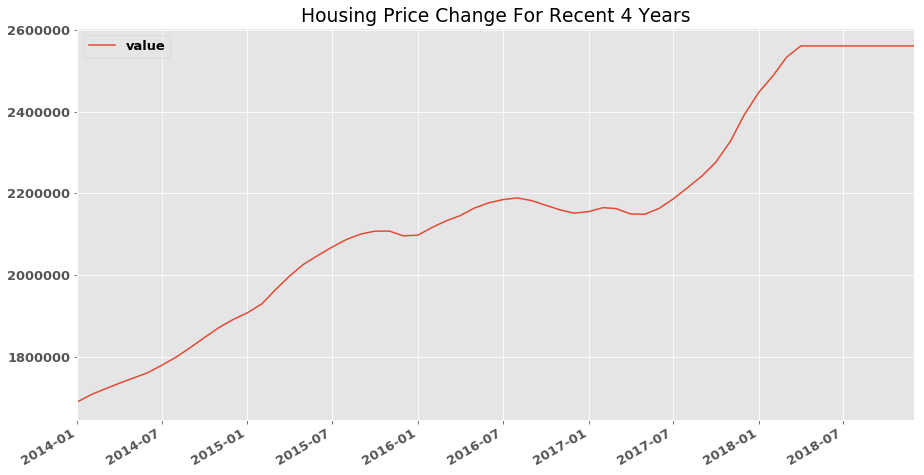

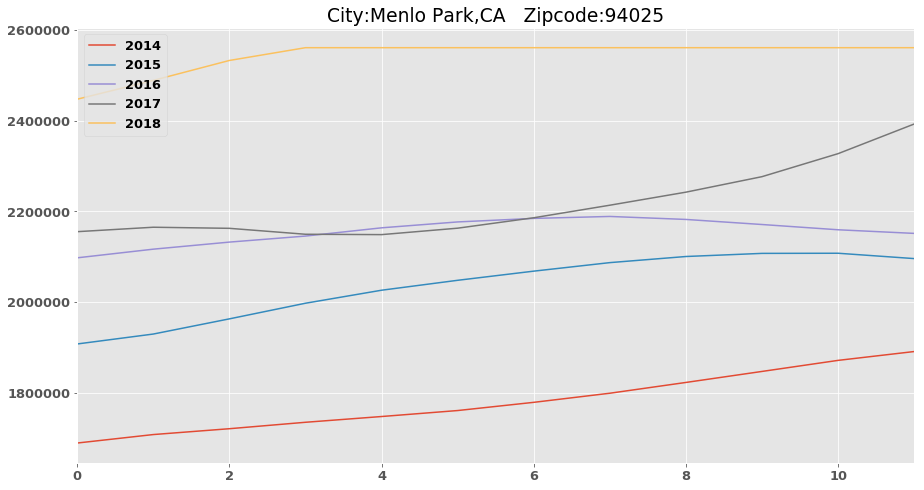

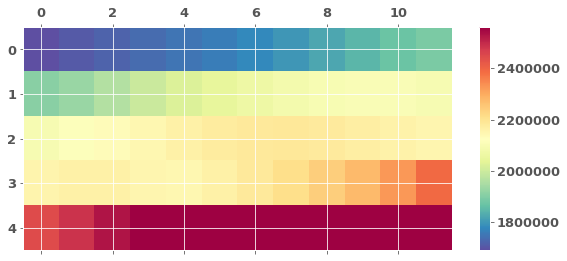

---------------------------



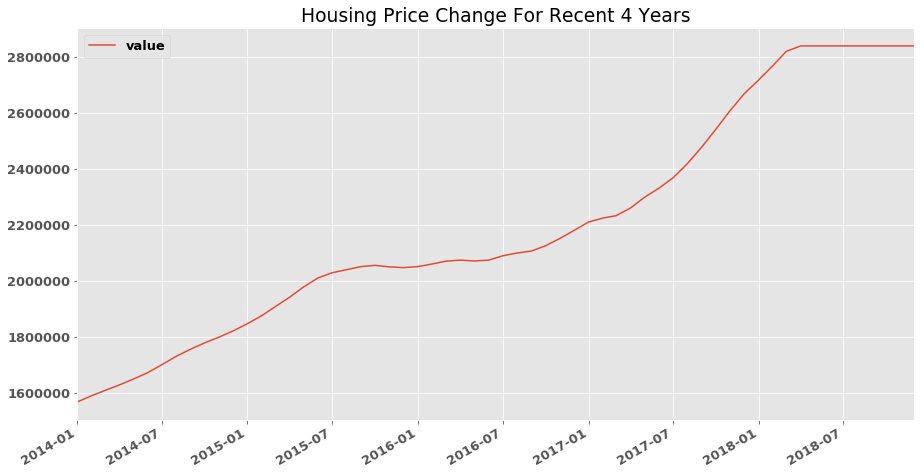

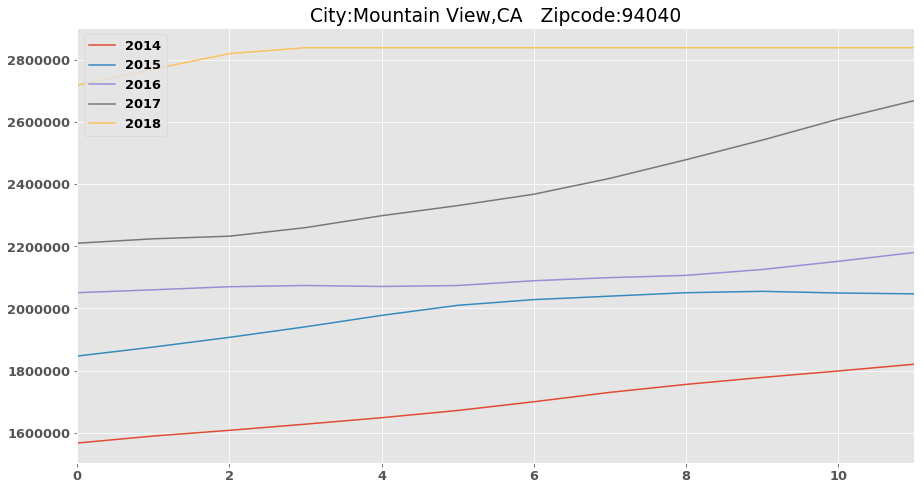

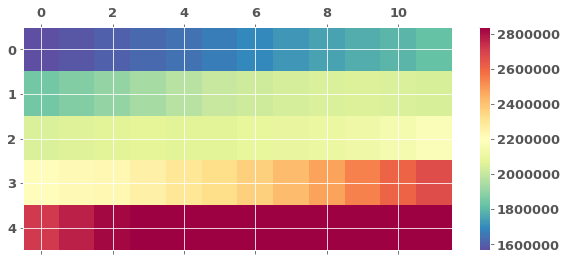

---------------------------



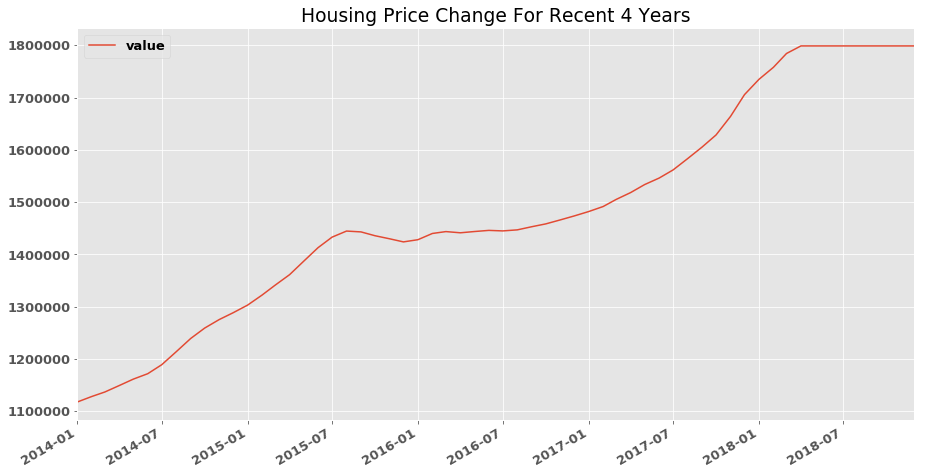

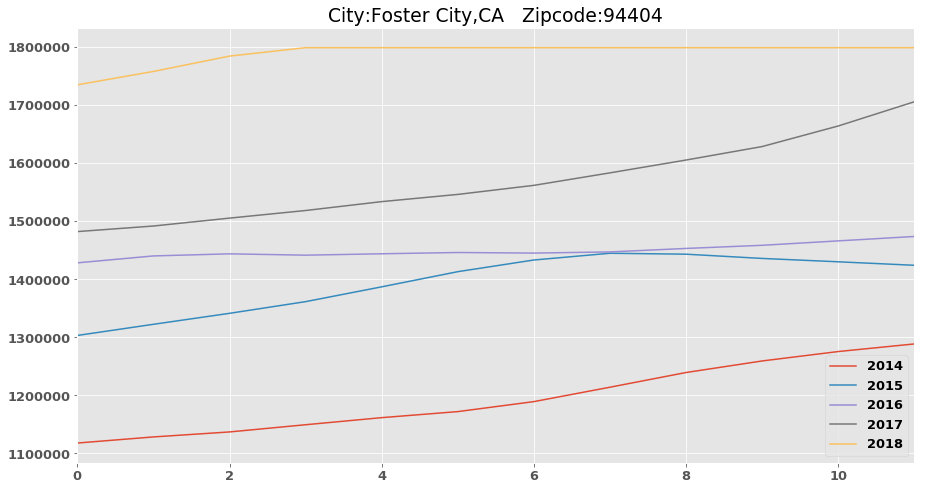

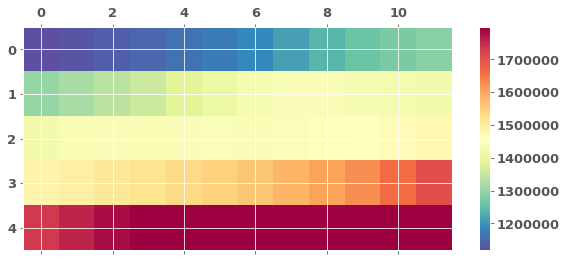

---------------------------



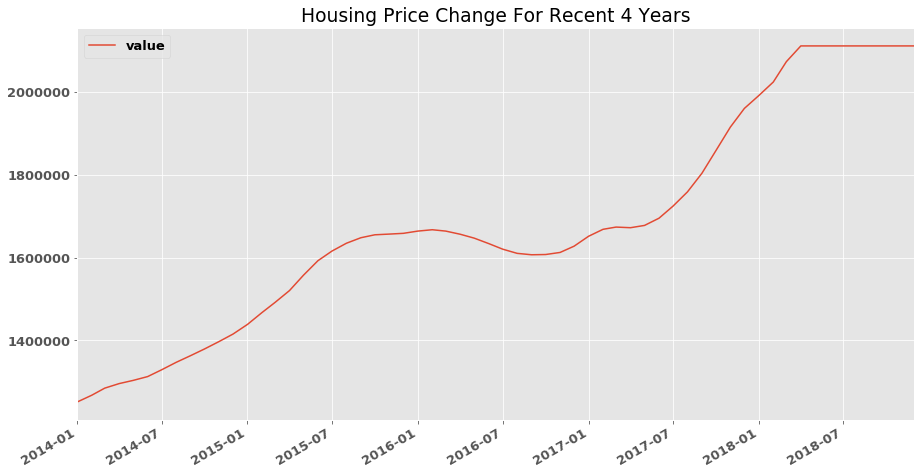

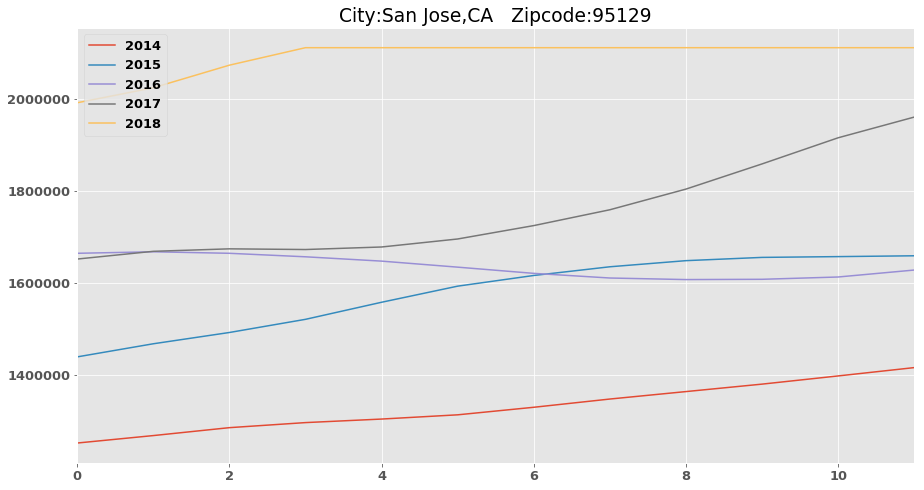

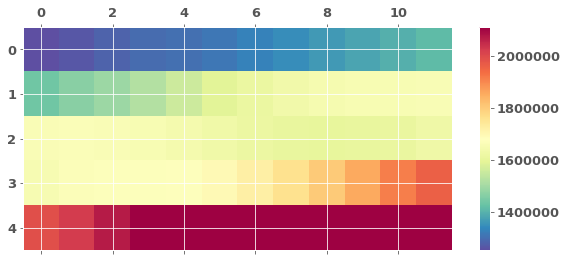

---------------------------



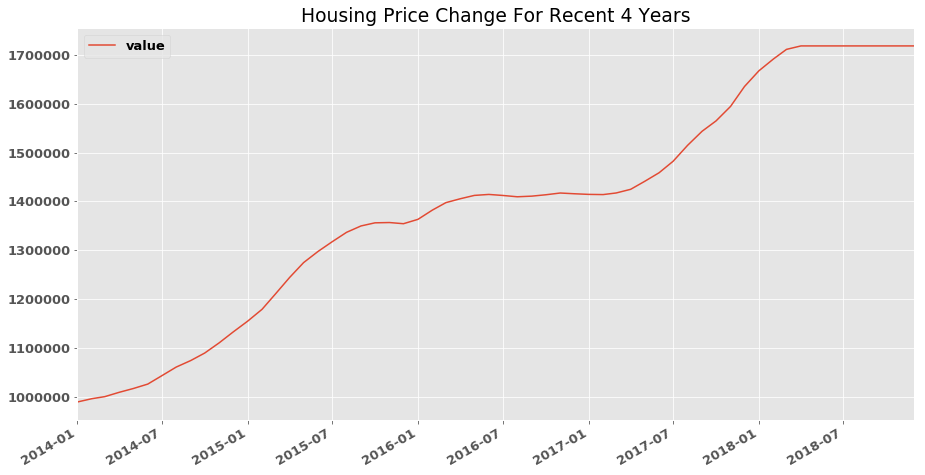

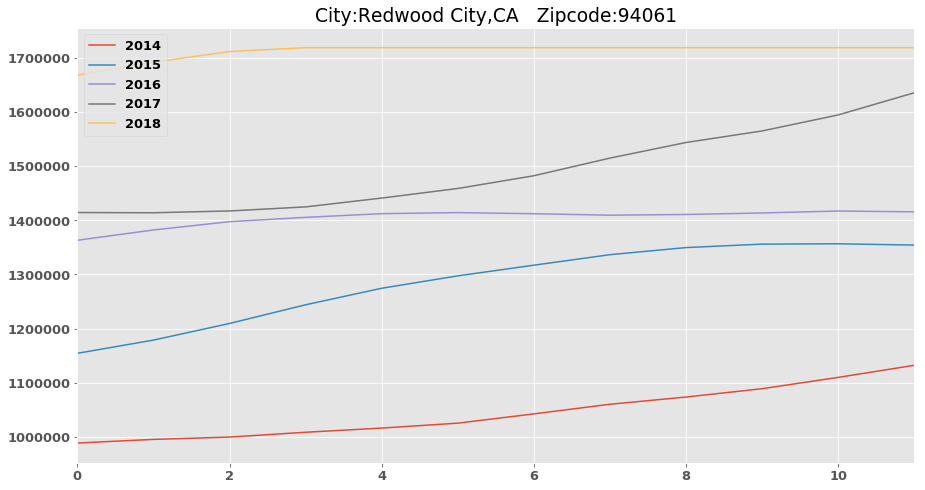

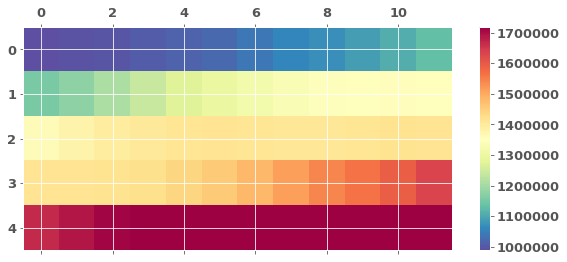

---------------------------



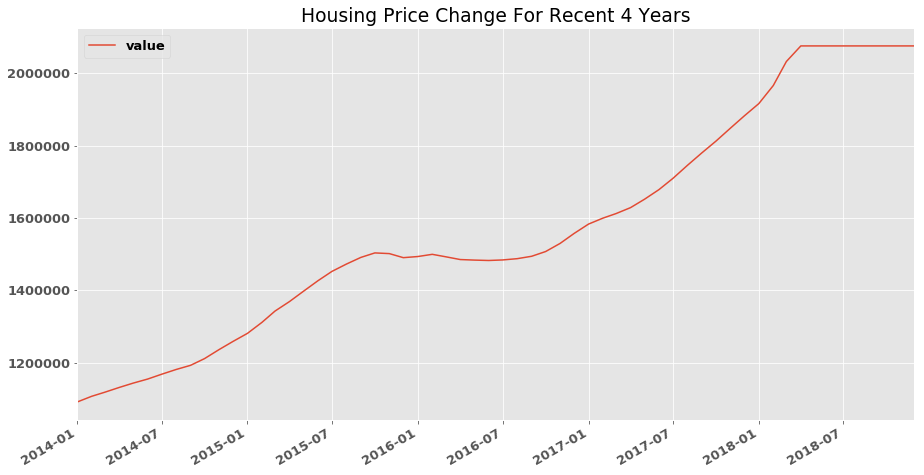

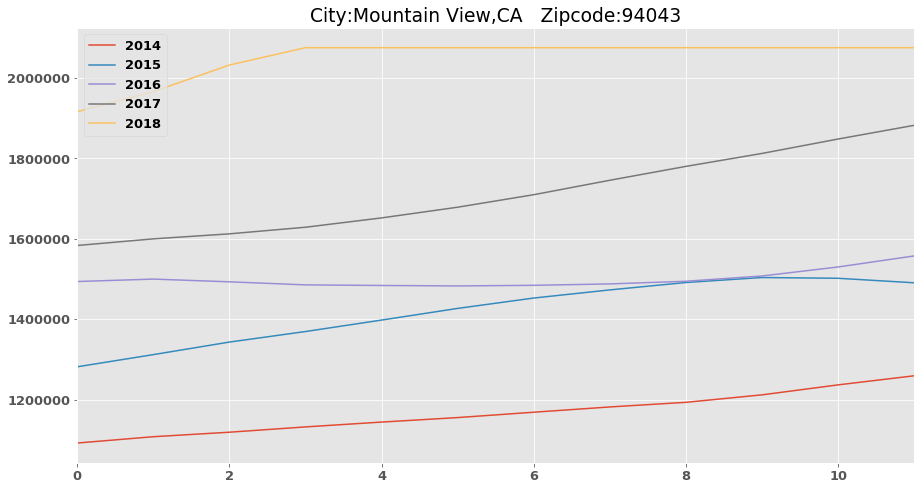

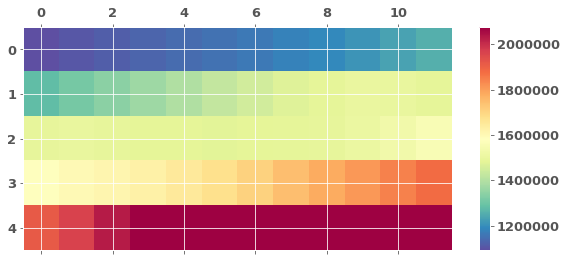

---------------------------



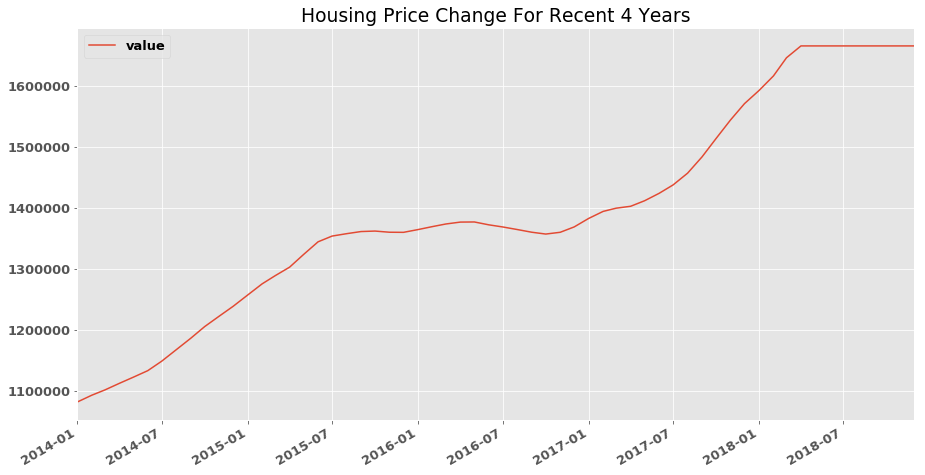

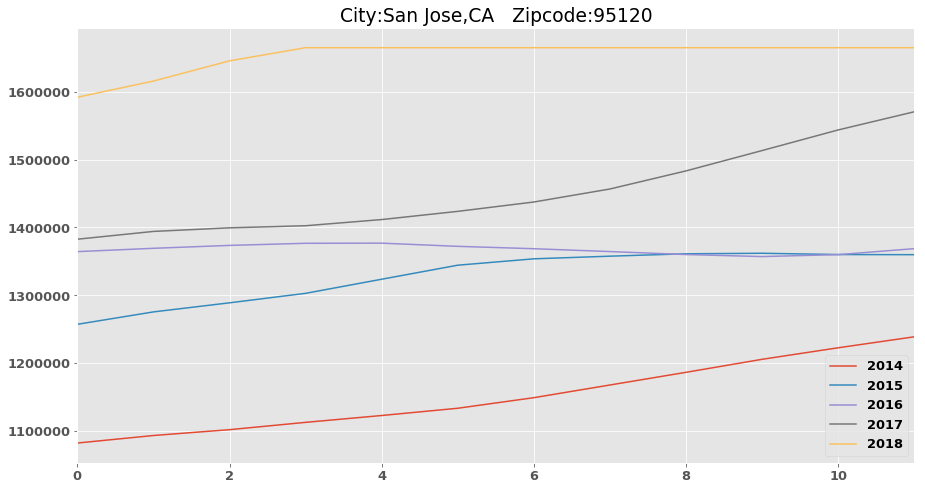

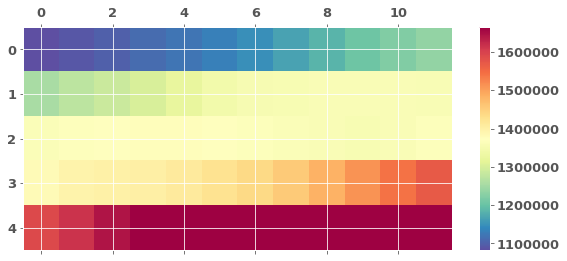

---------------------------



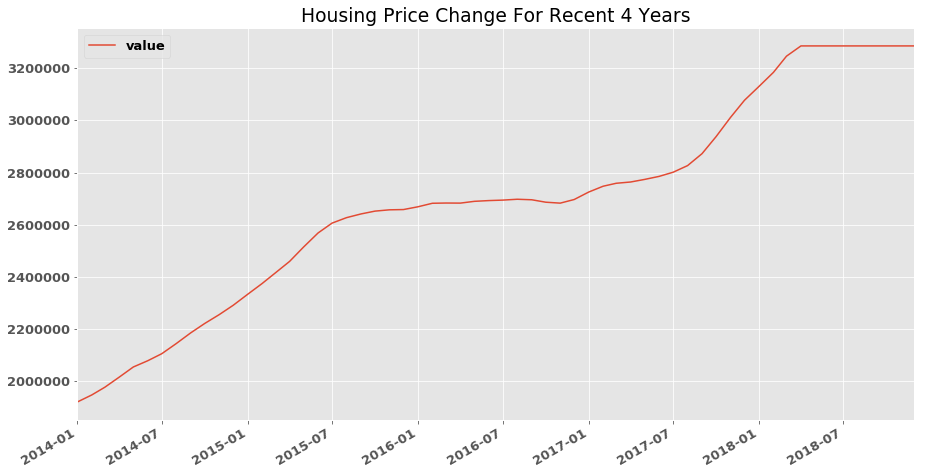

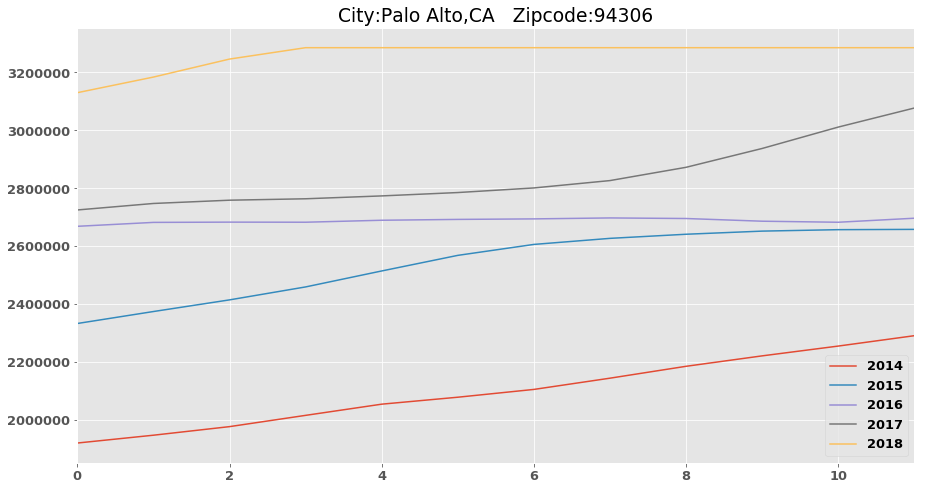

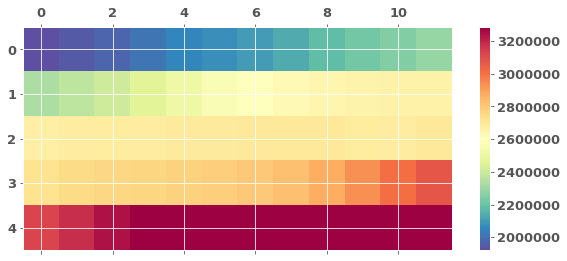

---------------------------



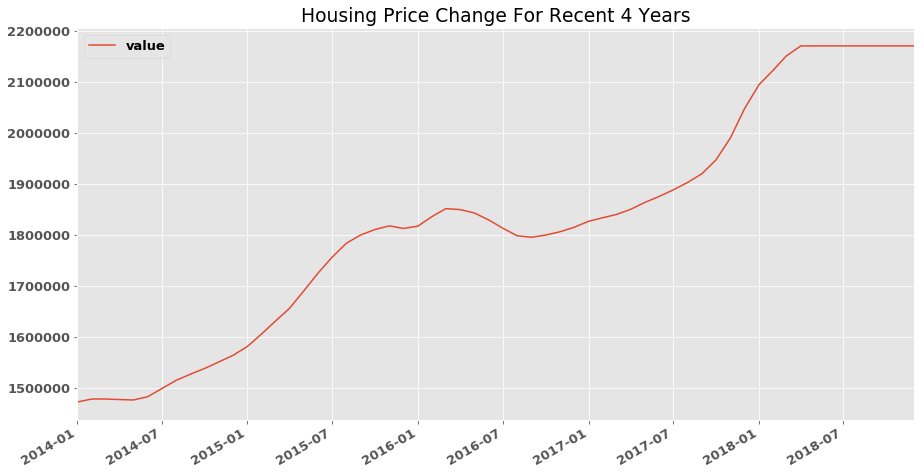

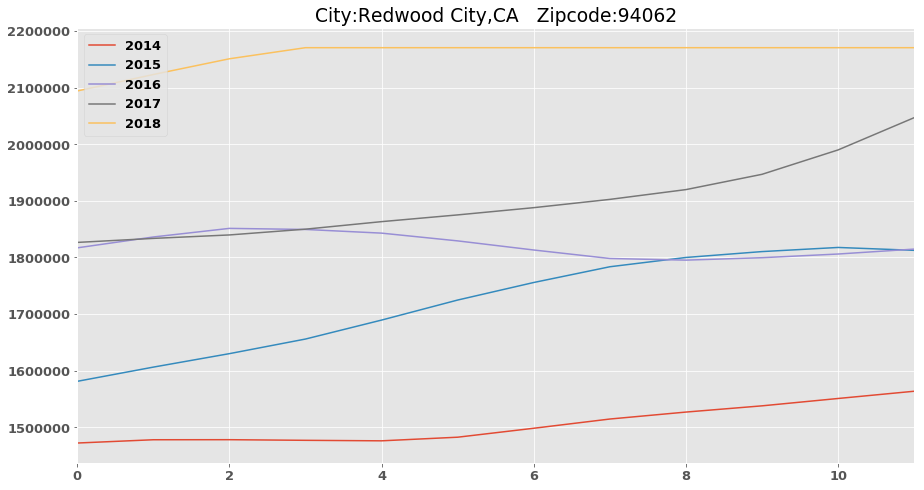

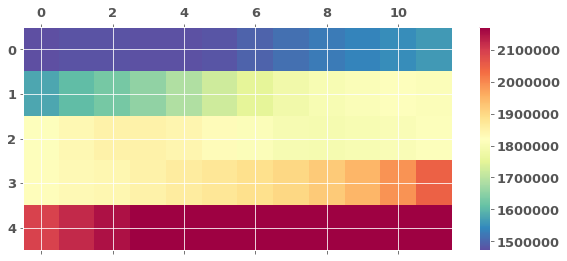

---------------------------



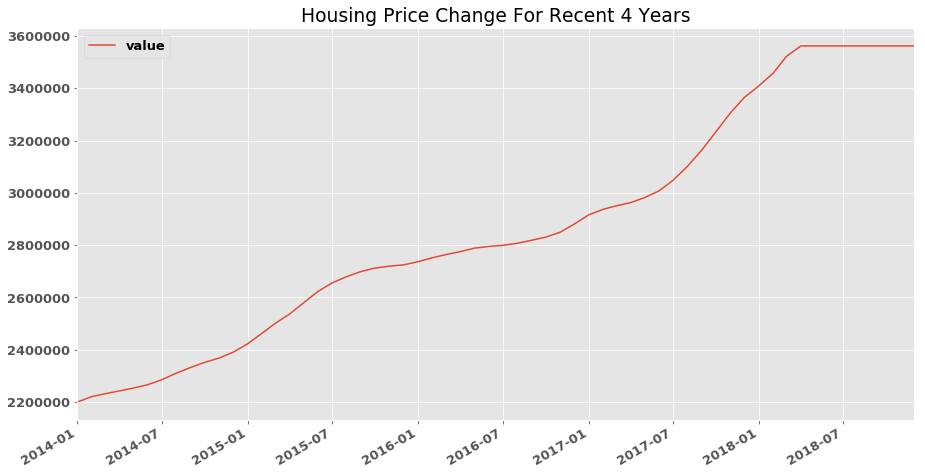

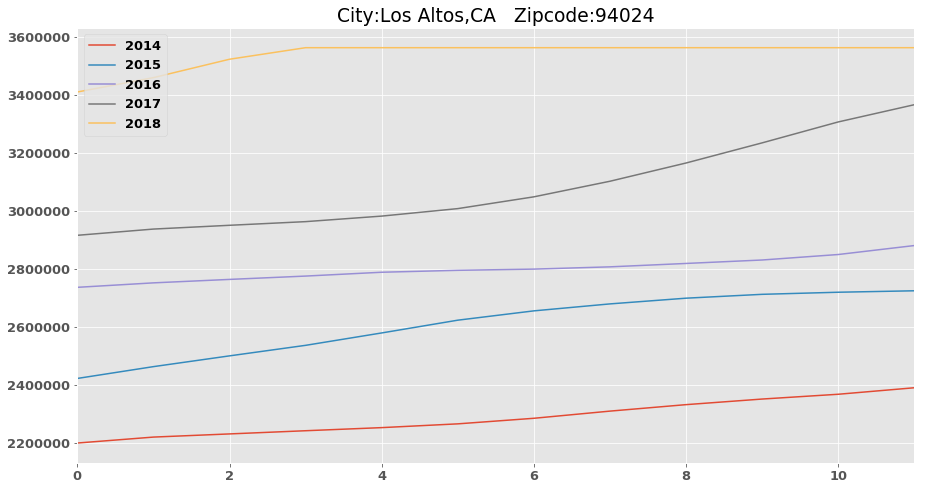

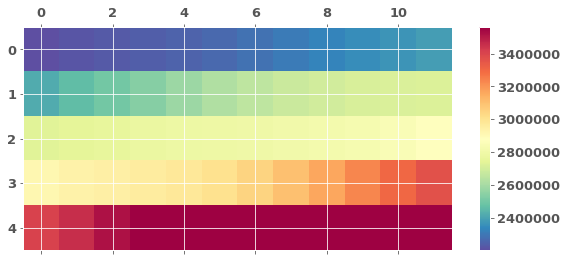

---------------------------



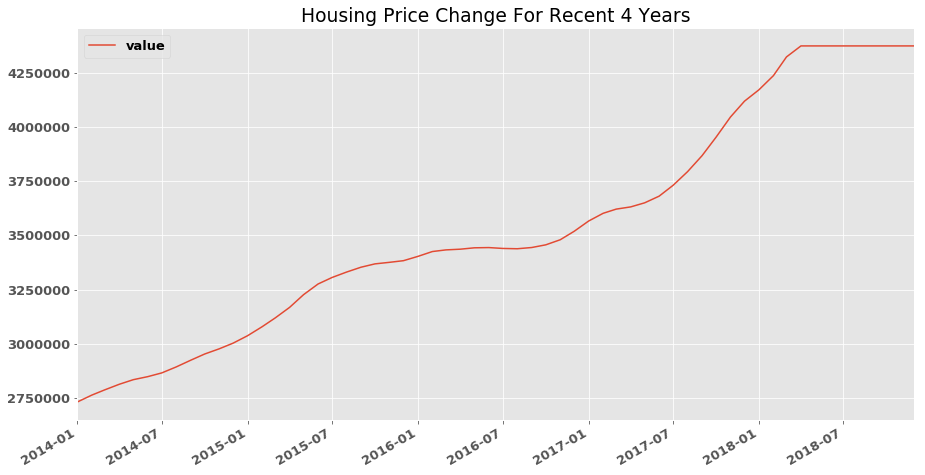

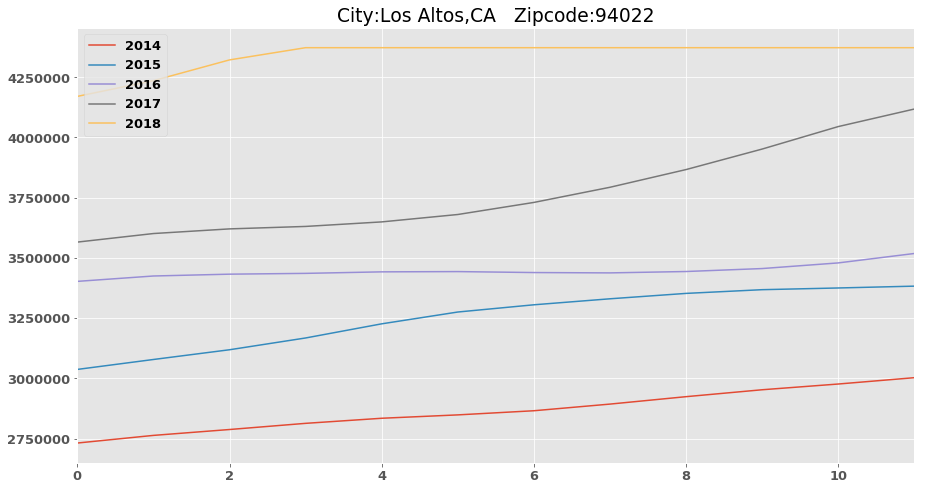

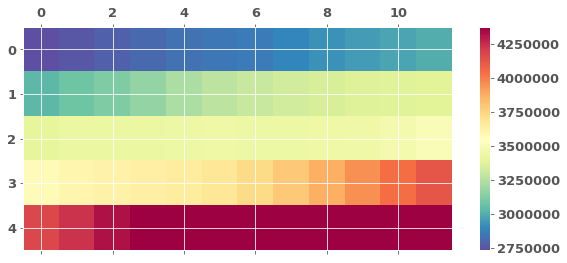

---------------------------



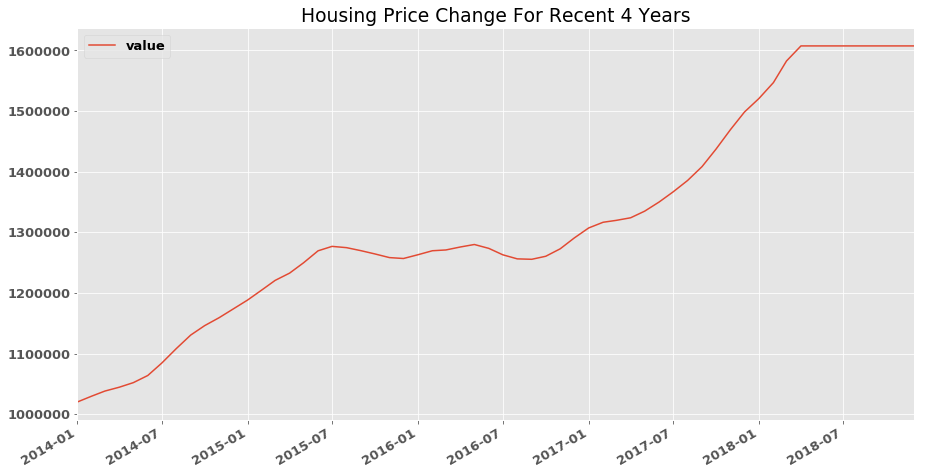

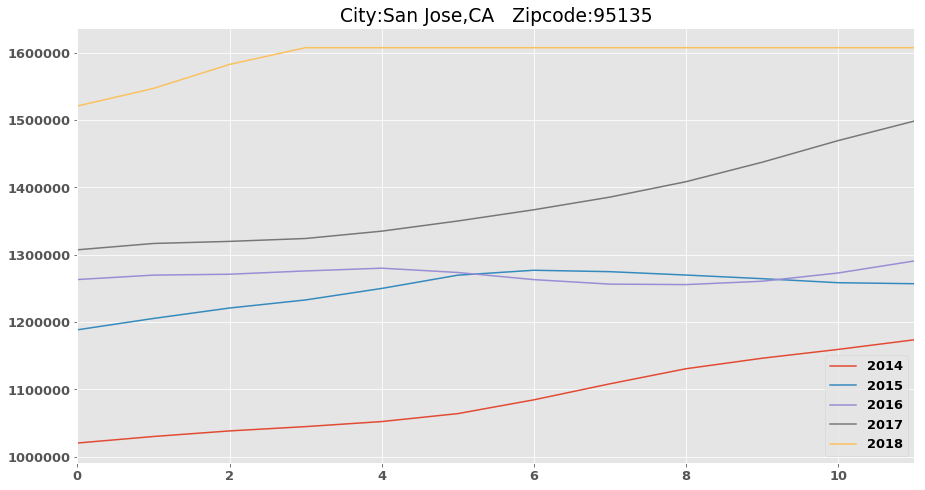

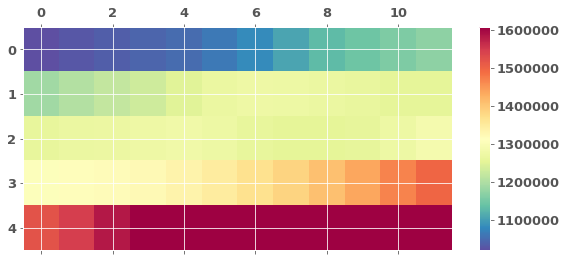

---------------------------



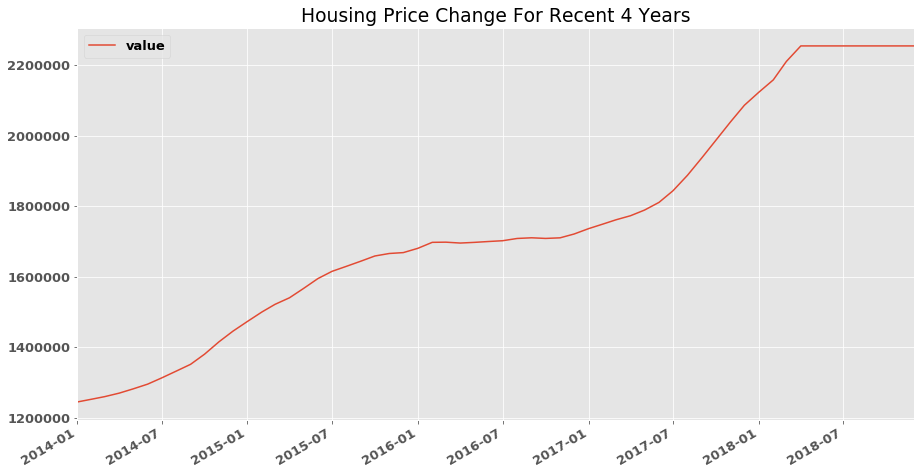

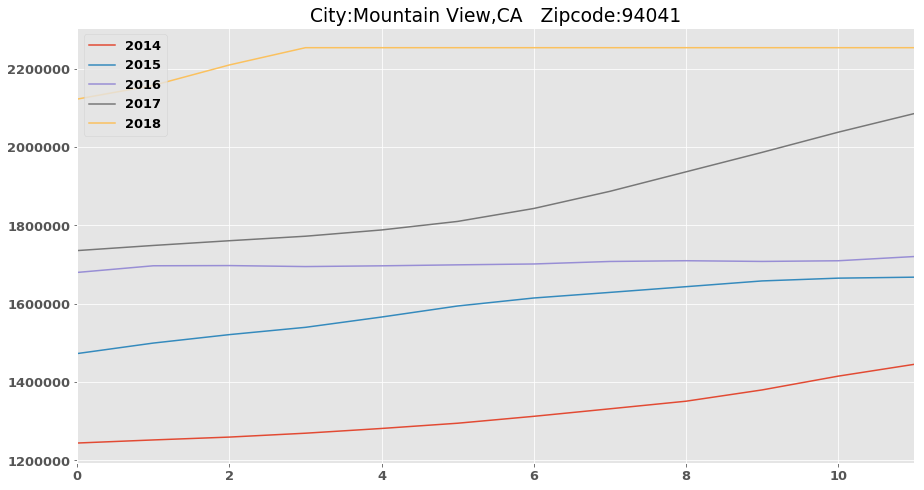

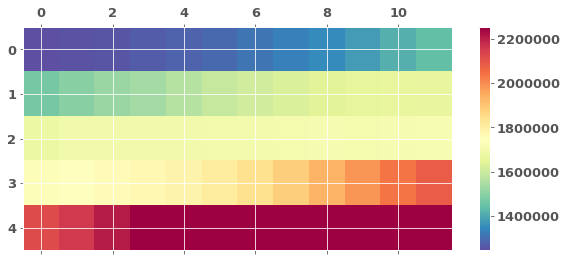

---------------------------



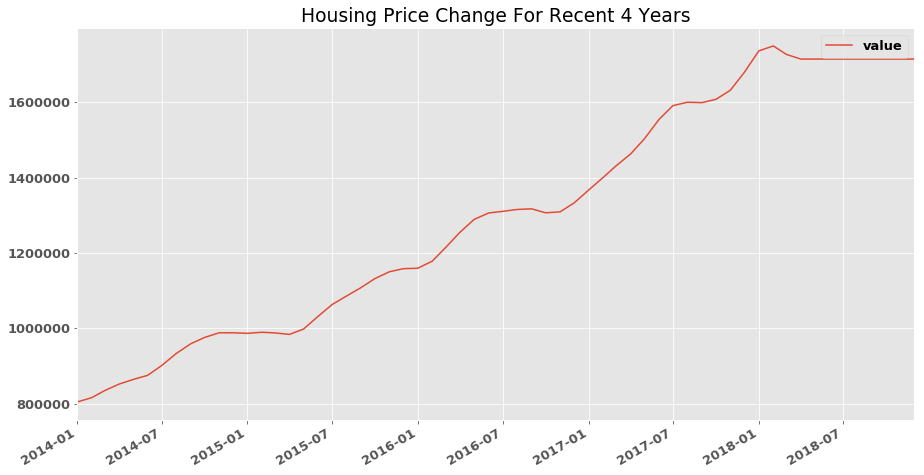

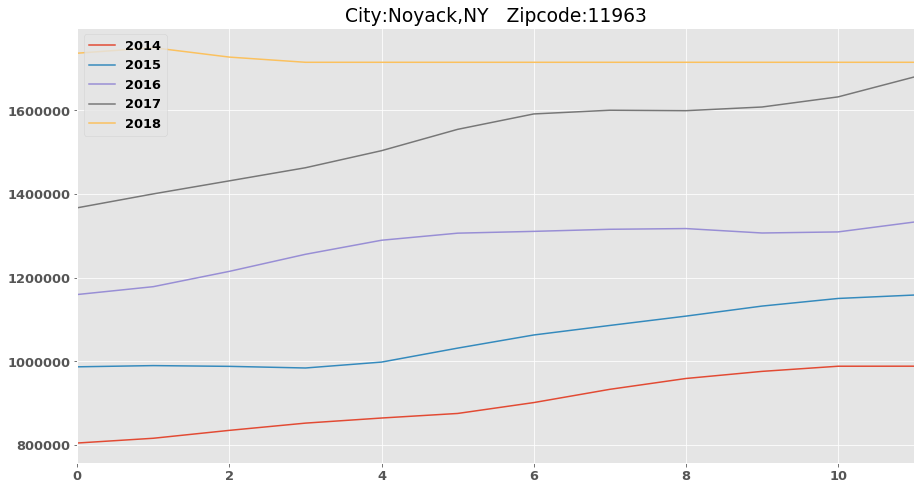

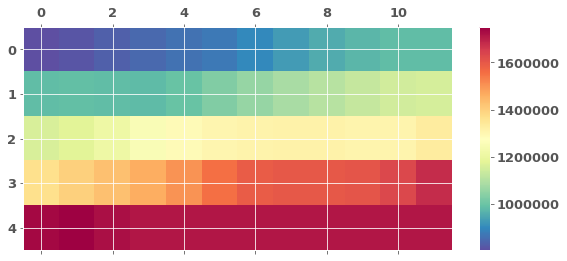

---------------------------



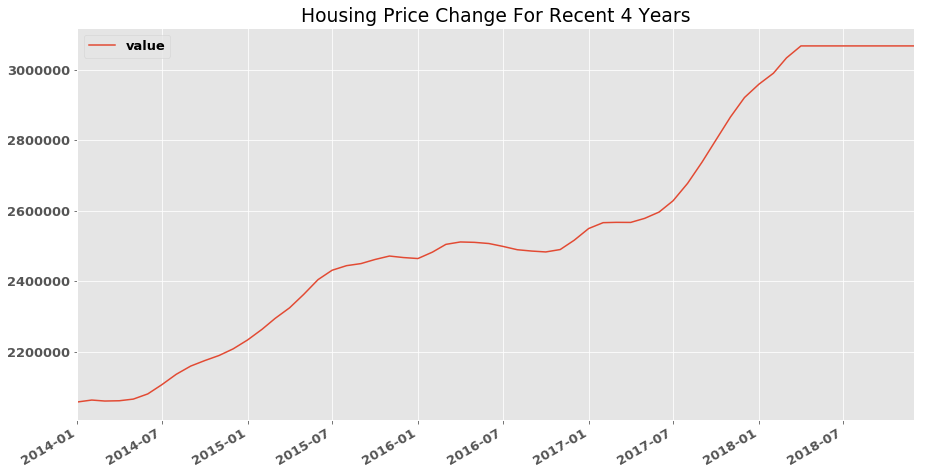

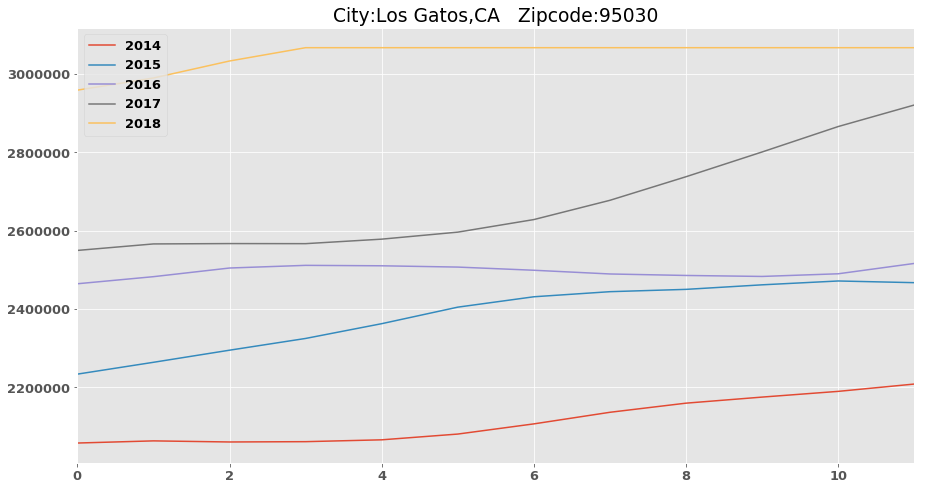

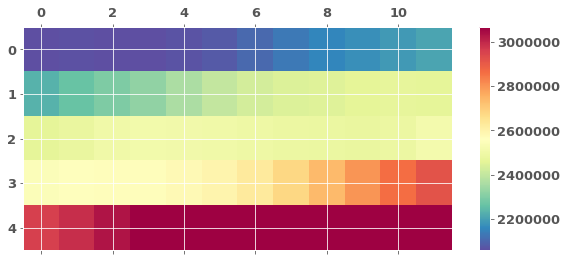

---------------------------



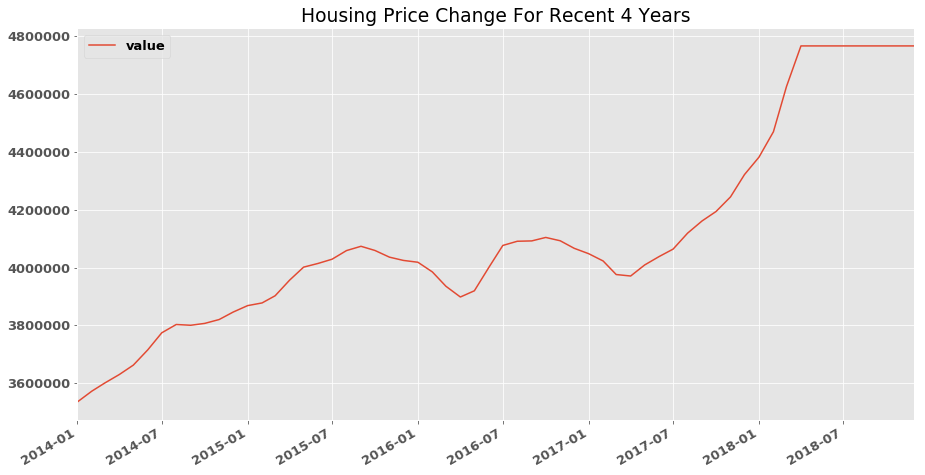

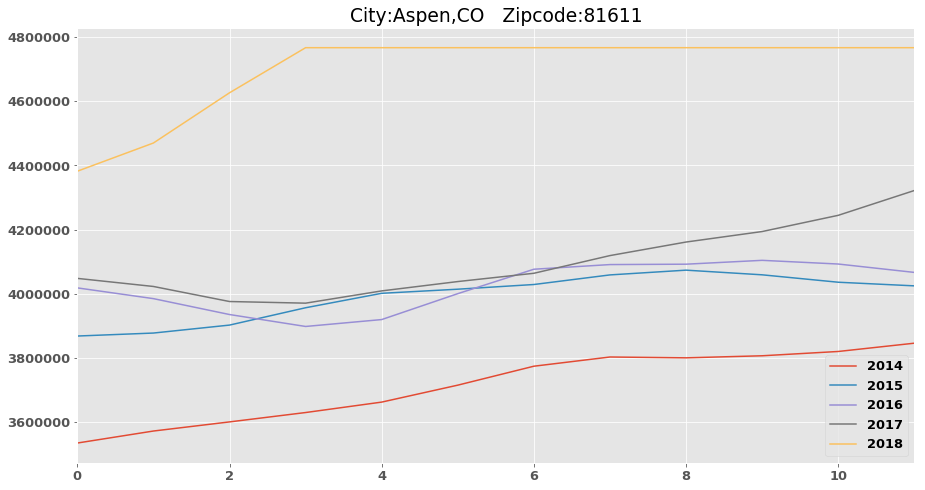

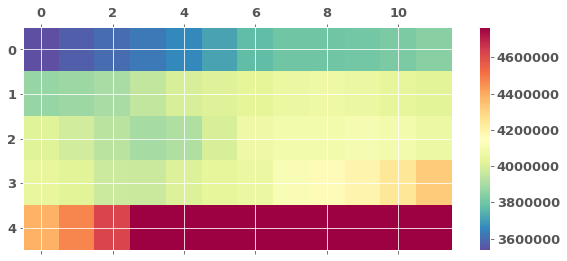

---------------------------



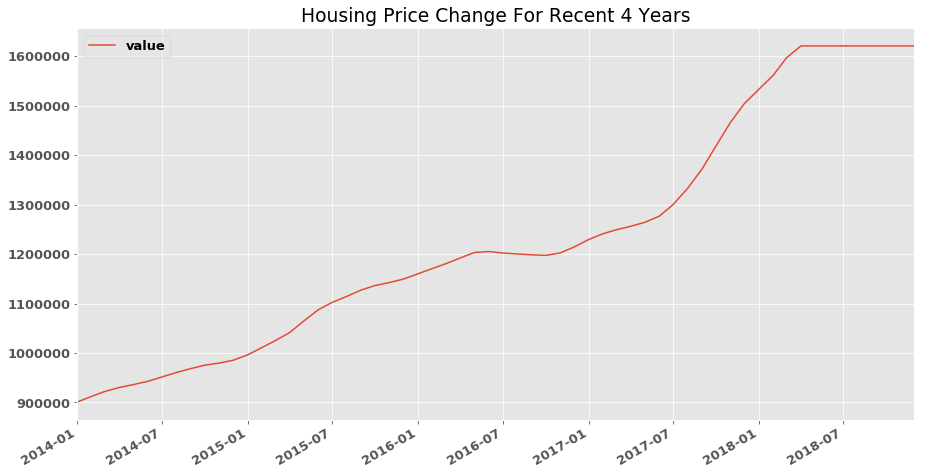

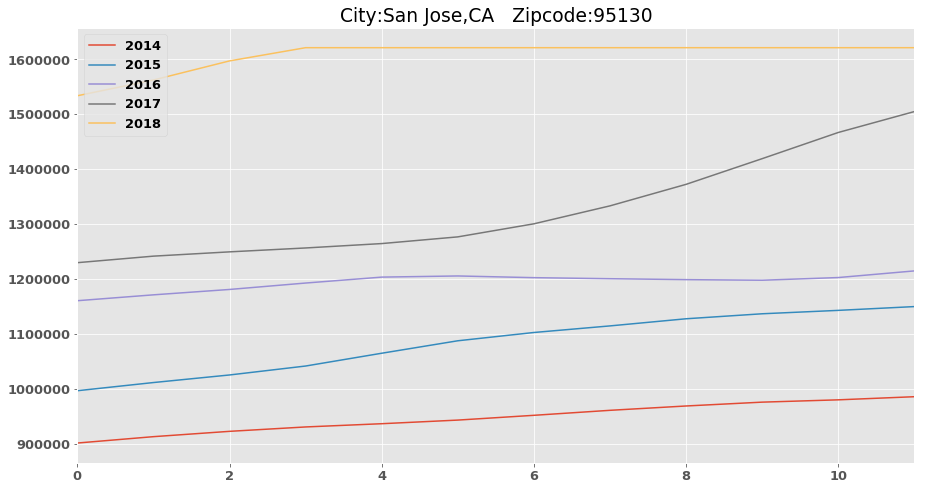

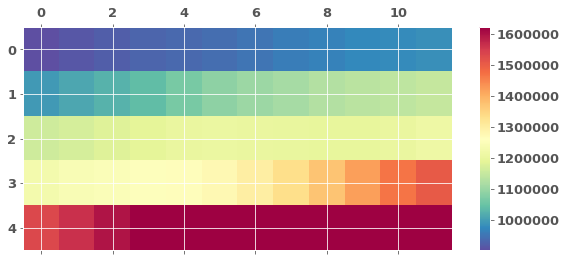

---------------------------



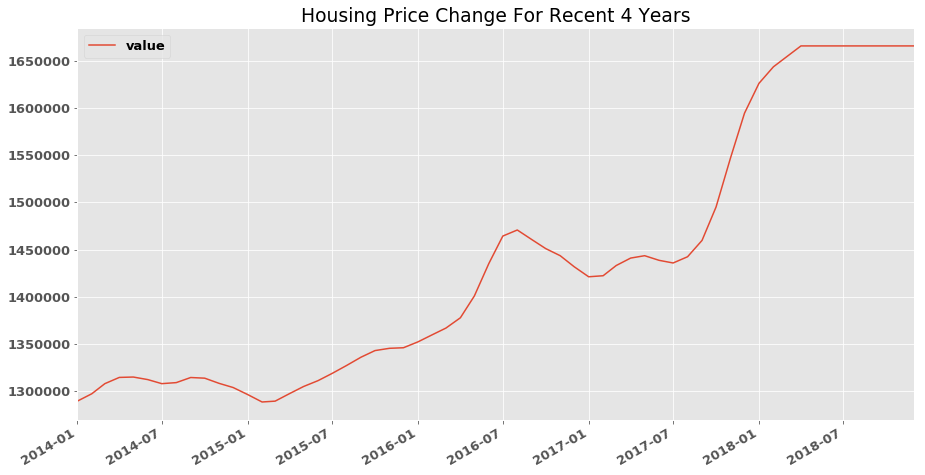

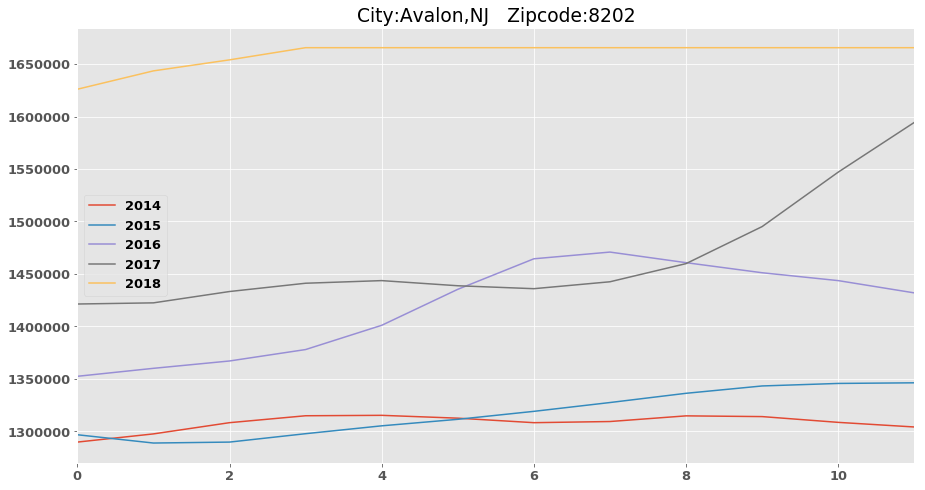

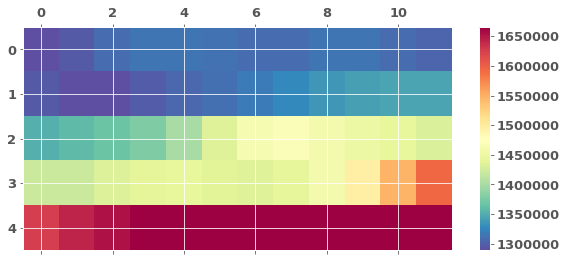

---------------------------



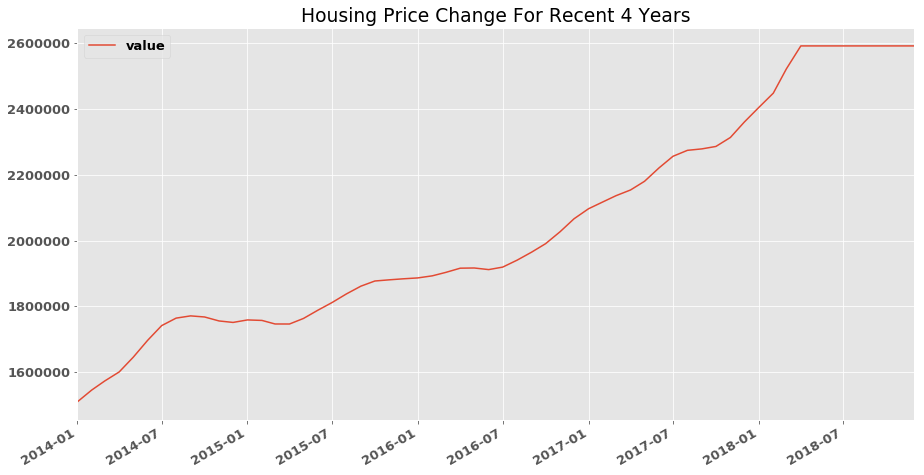

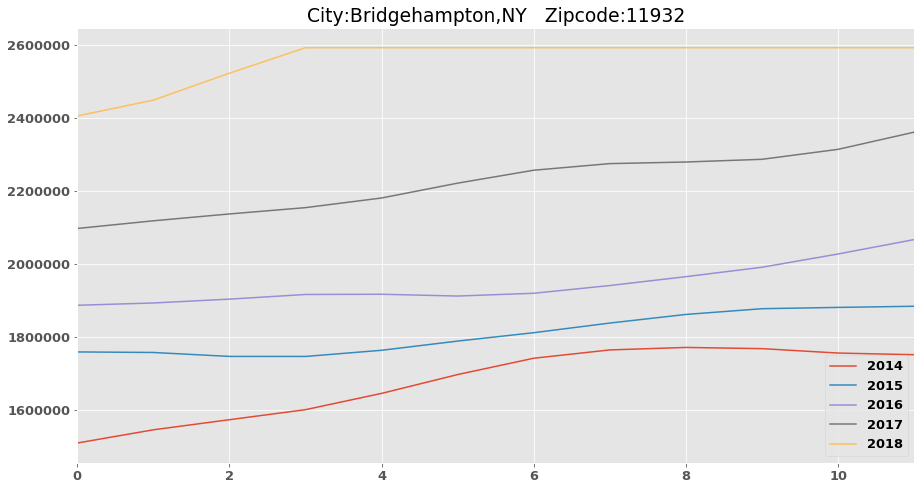

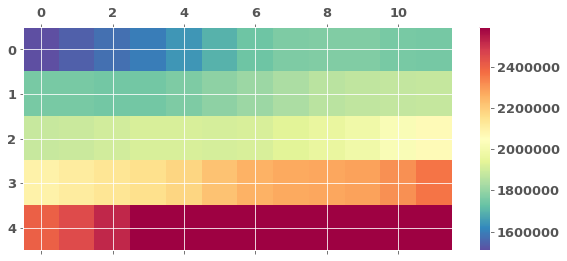

---------------------------



In [25]:
for i in range(len(zipcodes)):
    df = extend_tail(timeseries[i][1])

#     Use pandas grouper to group values using annual frequency
    annual_group = df.groupby(pd.Grouper(freq='A'))

    #Create a new DataFrame and store yearly values in columns 
    annual_price = pd.DataFrame()
    
    for yr, group in annual_group:

        annual_price[yr.year]= group.values.ravel()
    fig, ax = plt.subplots(figsize=(15,8))
    df.plot( subplots =False, legend =True, ax = ax)
    ax.set_title('housing price change for recent 4 years'.title())
    
    
    fig, ax = plt.subplots(figsize=(15,8))
    annual_price.plot( subplots =False, legend =True, ax = ax)
    plt.title(titles[i])
    plt.show()
    ##### Transpose the yearly group DataFrame and draw a heatmap with matshow()
    mat_heatmap = annual_price.T
    plt.matshow(mat_heatmap, interpolation=None, aspect ='auto', cmap = plt.cm.Spectral_r)
    plt.colorbar()
    plt.show()
    
    print('---------------------------\n')

### Observations from the EDA (part 2):
* The graphs with 4 years of price changes indicate that, from mid 2015 to 2016, the housing market has a stagnation.
* Besides the stagnation, the housing prices in all 23 places have been increasing for 4 years.  

# ARIMA Modeling

## ACP and PACF Graphs

City:Cupertino,CA   Zipcode:95014


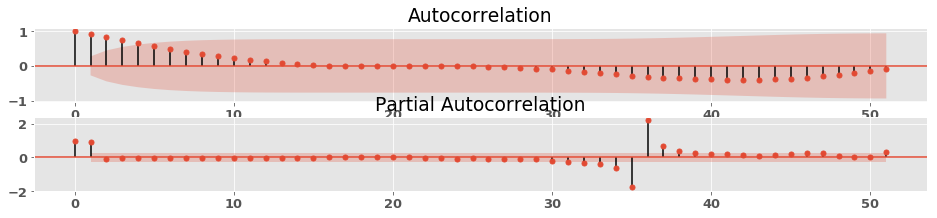

____________________________________________
City:Sunnyvale,CA   Zipcode:94087


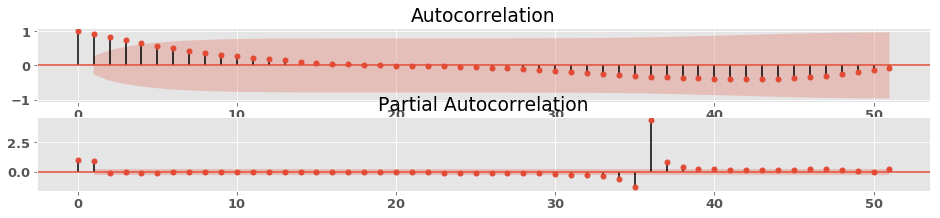

____________________________________________
City:Sunnyvale,CA   Zipcode:94086


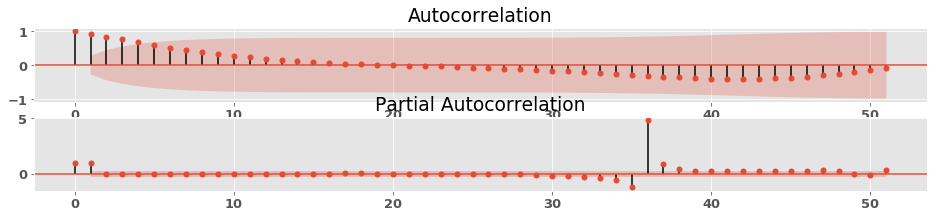

____________________________________________
City:San Mateo,CA   Zipcode:94403


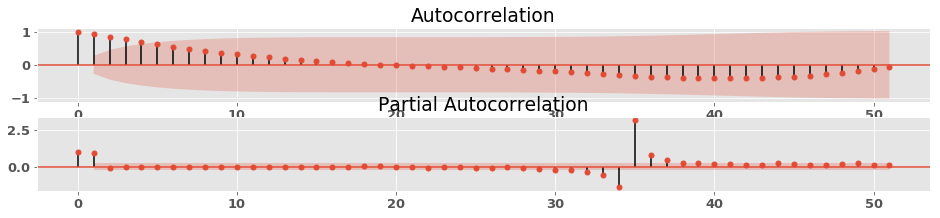

____________________________________________
City:Menlo Park,CA   Zipcode:94025


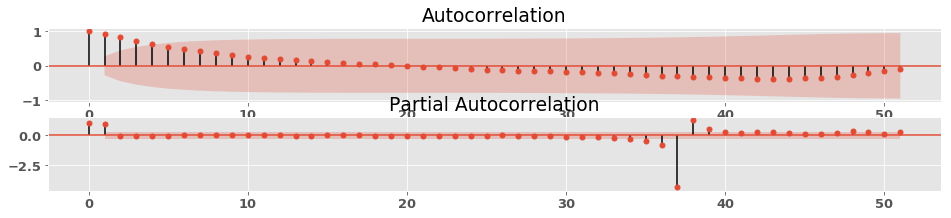

____________________________________________
City:Mountain View,CA   Zipcode:94040


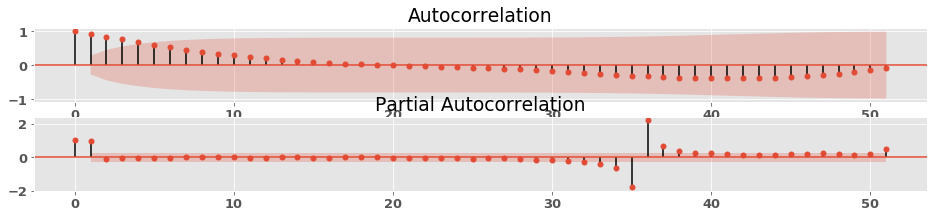

____________________________________________
City:Foster City,CA   Zipcode:94404


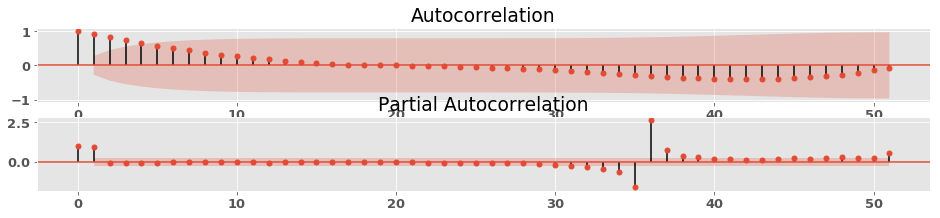

____________________________________________
City:San Jose,CA   Zipcode:95129


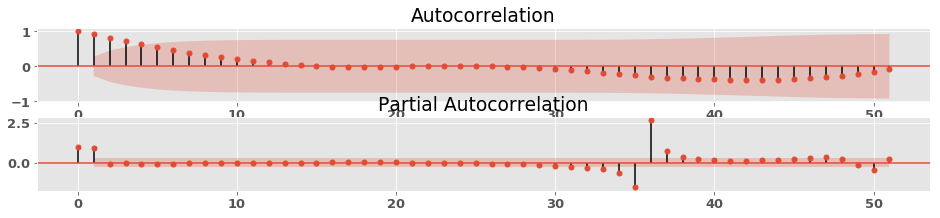

____________________________________________
City:Redwood City,CA   Zipcode:94061


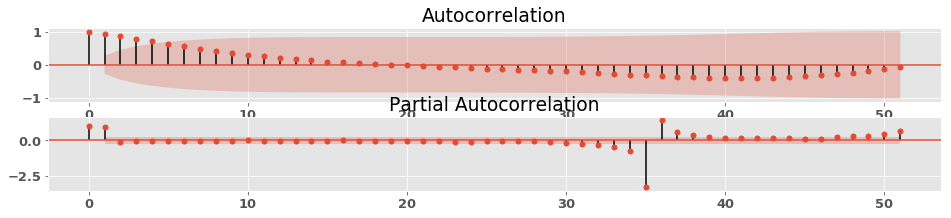

____________________________________________
City:Mountain View,CA   Zipcode:94043


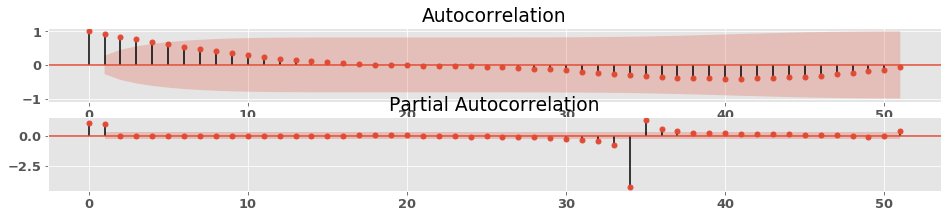

____________________________________________
City:San Jose,CA   Zipcode:95120


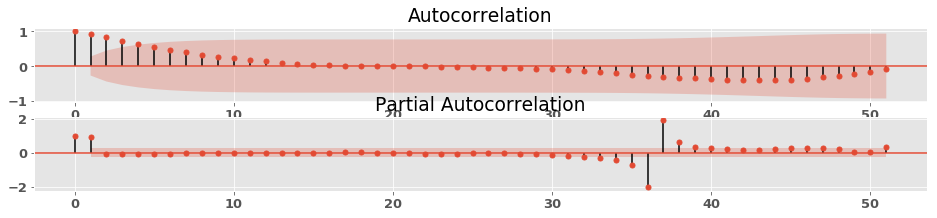

____________________________________________
City:Palo Alto,CA   Zipcode:94306


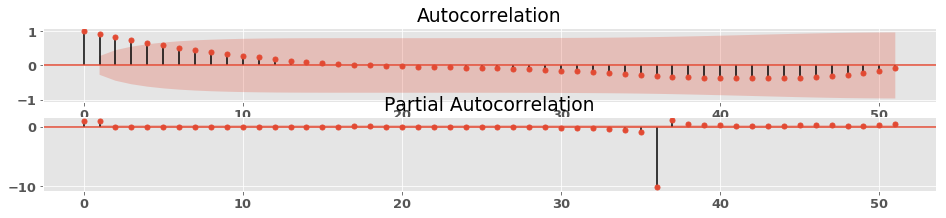

____________________________________________
City:Redwood City,CA   Zipcode:94062


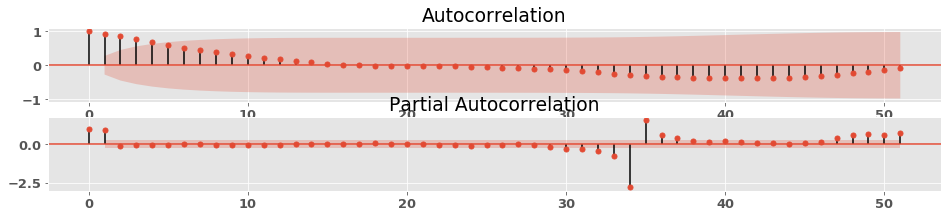

____________________________________________
City:Los Altos,CA   Zipcode:94024


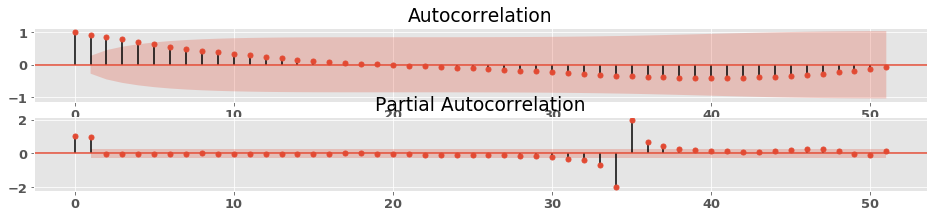

____________________________________________
City:Los Altos,CA   Zipcode:94022


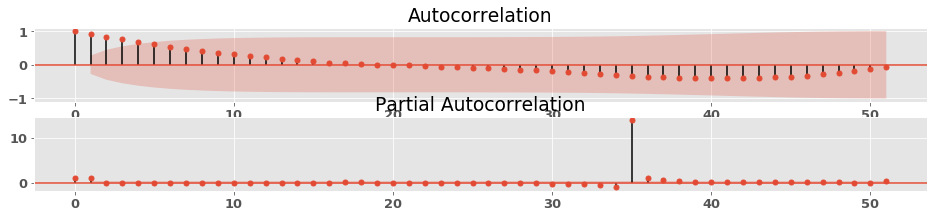

____________________________________________
City:San Jose,CA   Zipcode:95135


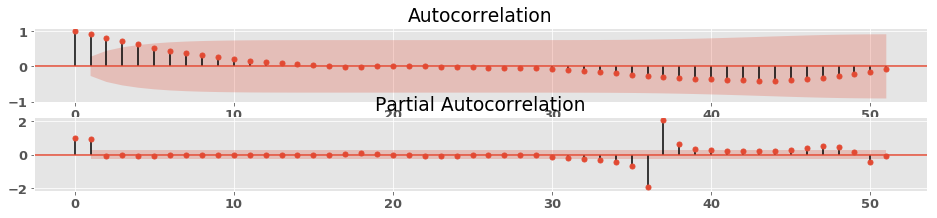

____________________________________________
City:Mountain View,CA   Zipcode:94041


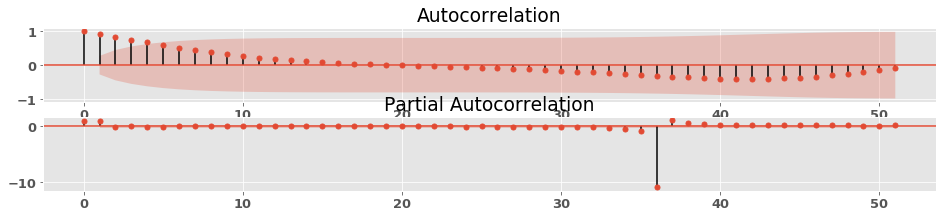

____________________________________________
City:Noyack,NY   Zipcode:11963


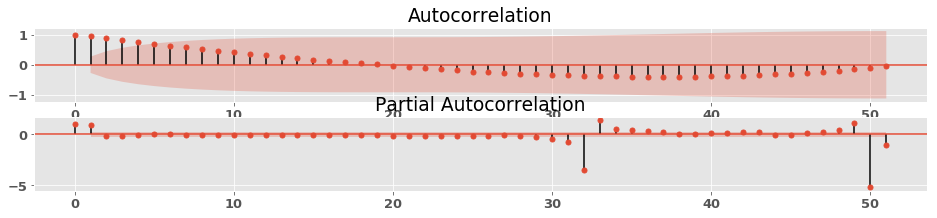

____________________________________________
City:Los Gatos,CA   Zipcode:95030


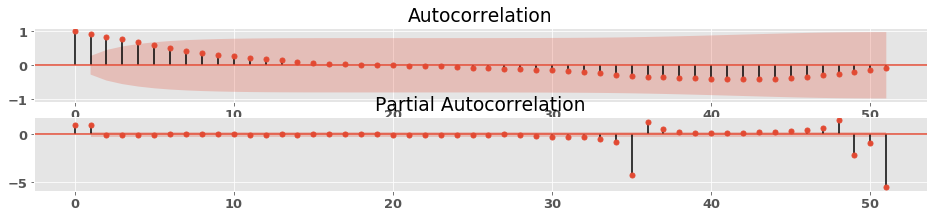

____________________________________________
City:Aspen,CO   Zipcode:81611


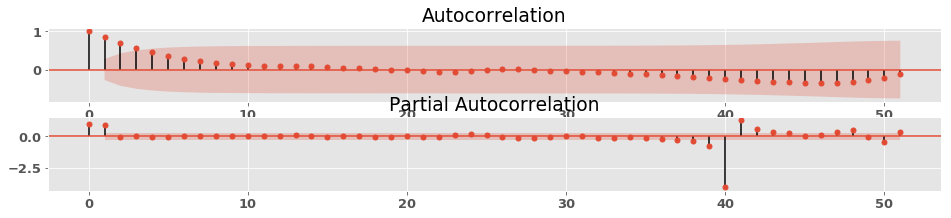

____________________________________________
City:San Jose,CA   Zipcode:95130


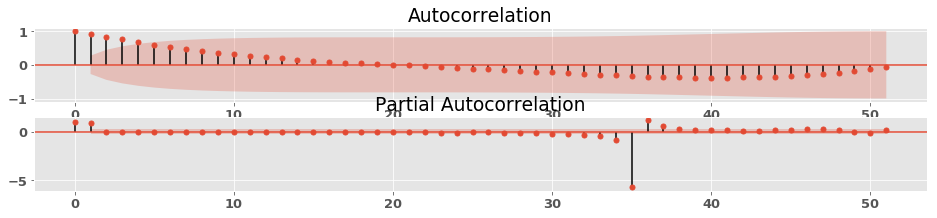

____________________________________________
City:Avalon,NJ   Zipcode:8202


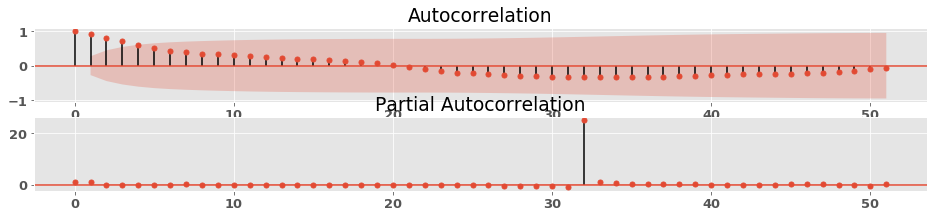

____________________________________________
City:Bridgehampton,NY   Zipcode:11932


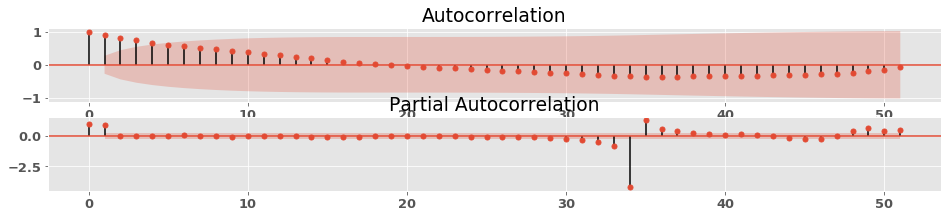

____________________________________________


In [26]:
for i in range(len(zipcodes)):

    series = timeseries[i][1]
    print(titles[i])
    fig, axes = plt.subplots(ncols=1, nrows=2,figsize =(16,3))
    plot_acf(series,ax= axes[0], lags=51)
   
    plot_pacf(series, lags=51, ax=axes[1])

    plt.show()
    print('____________________________________________')

From the plots above, we see that there are autocorrelations for 1 to 2 lags and partial correlation for mostly 1 lag. So we will build ARIMA models with varied combinations of orders in (p (for AR), d (for differencing), q (for MA)) from 0 to 1 order for both seasonal and non-seasonal part. 

## ARIMA modeling

In [27]:
# Define the p, d and q parameters to take any value between 0 and 1
p = d = q = range(0,2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p,d,q))

# Generate all different combinations of seasonal p, q and q triplets (use 12 for frequency)
pdqs = [(x[0],x[1],x[2],12) for x in pdq]


In [28]:
arima_results = []
for i in range(len(zipcodes)):
    series = timeseries[i][1]
    ans=[]
    for comb in pdq:
        for combs in pdqs:
            try:
                mod = sm.tsa.statespace.SARIMAX(series,
                                                order=comb,
                                                seasonal_order=combs,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False)

                output = mod.fit()
                ans.append([comb, combs, output.aic, output.bic])

            except:
                continue
    arima_results.append(ans)

Out of the models with different combinations of orders, the model with the smallest AIC value was picked for each time series. 

In [29]:
# Find the parameters with minimal AIC value.
minAICs =[]
for i in range(len(arima_results)):
    ans_df = pd.DataFrame(arima_results[i], columns =['pdq', 'pdqs','aic','bic'])
    minAICs.append(ans_df.loc[ans_df['aic'].idxmin()])

City:Cupertino,CA   Zipcode:95014
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 549.9480393951992
BIC: 553.7223290092636
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9504      0.070     13.635      0.000       0.814       1.087
ar.S.L12      -0.5120      0.254     -2.012      0.044      -1.011      -0.013
sigma2      7.901e+07   5.78e-10   1.37e+17      0.000     7.9e+07     7.9e+07


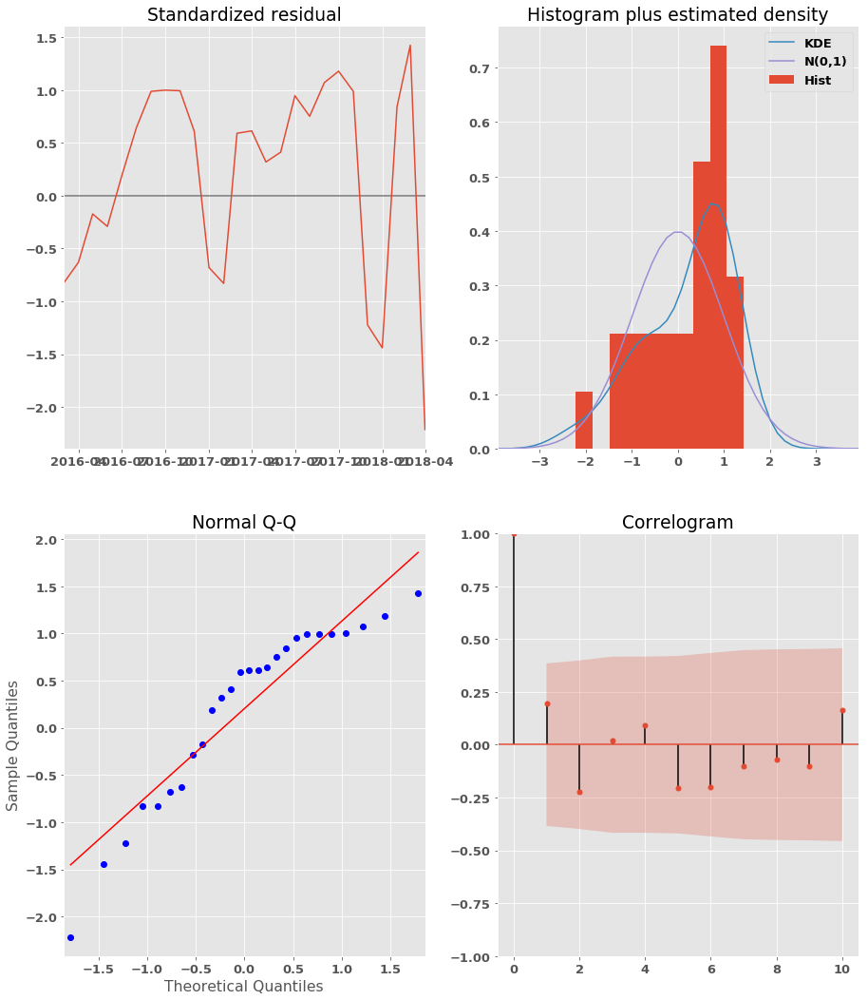



City:Sunnyvale,CA   Zipcode:94087
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 545.092079816841
BIC: 550.1244659689269
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8739      0.114      7.679      0.000       0.651       1.097
ma.L1          0.7795      0.329      2.369      0.018       0.135       1.424
ar.S.L12       0.0450      0.234      0.192      0.848      -0.414       0.504
sigma2      5.337e+07    3.1e-09   1.72e+16      0.000    5.34e+07    5.34e+07


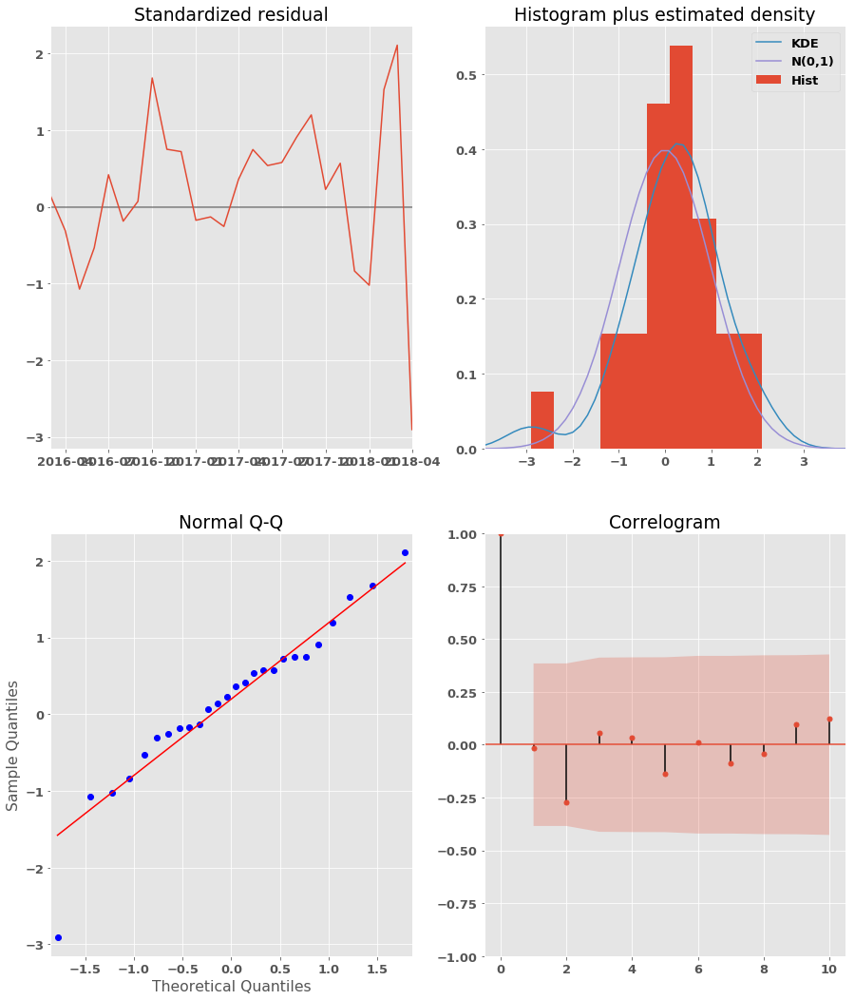



City:Sunnyvale,CA   Zipcode:94086
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 544.6686027189656
BIC: 548.44289233303
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9595      0.067     14.310      0.000       0.828       1.091
ar.S.L12      -0.6957      0.311     -2.238      0.025      -1.305      -0.086
sigma2      6.302e+07   1.55e-09   4.07e+16      0.000     6.3e+07     6.3e+07


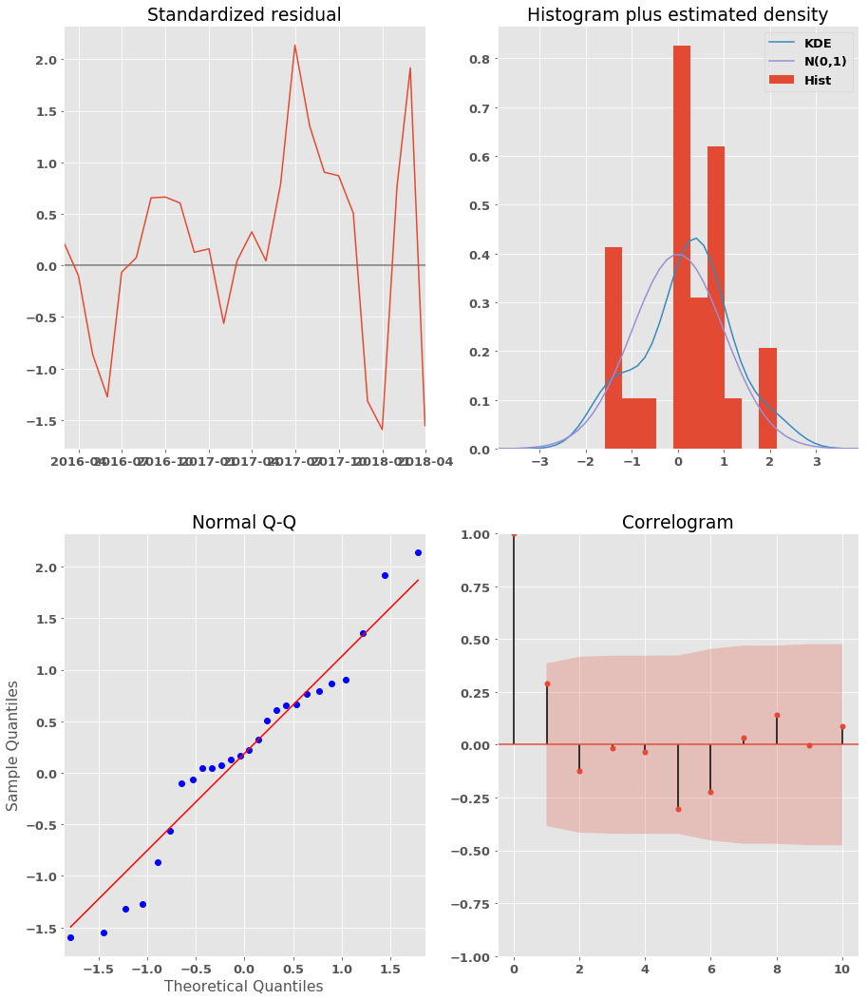



City:San Mateo,CA   Zipcode:94403
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 536.8559715168466
BIC: 541.8883576689325
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7528      0.242      3.115      0.002       0.279       1.226
ma.L1          0.8172      0.265      3.078      0.002       0.297       1.338
ar.S.L12       0.0685      0.305      0.225      0.822      -0.529       0.665
sigma2      4.816e+07   3.23e-09   1.49e+16      0.000    4.82e+07    4.82e+07


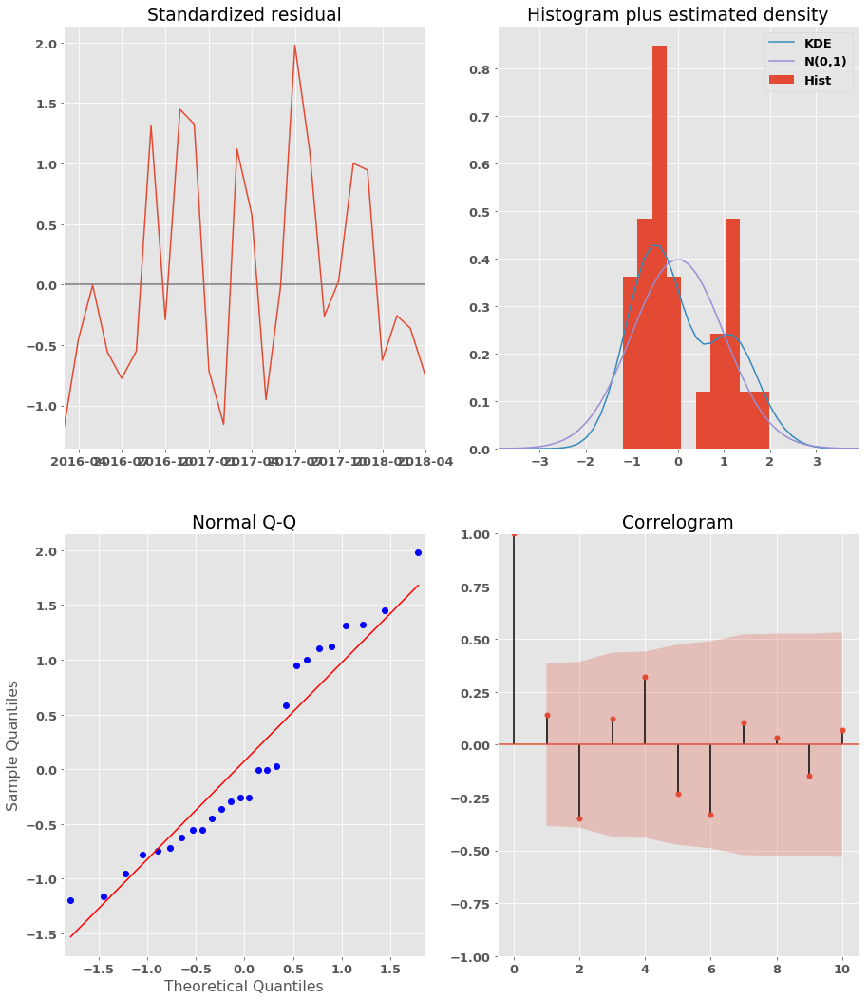



City:Menlo Park,CA   Zipcode:94025
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 536.6341309616589
BIC: 542.7285100859999
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8619      0.095      9.060      0.000       0.675       1.048
ma.L1          0.8092      0.183      4.416      0.000       0.450       1.168
ar.S.L12       0.0899      0.211      0.427      0.670      -0.323       0.503
ma.S.L12      -0.0138      0.066     -0.210      0.834      -0.143       0.115
sigma2      9.352e+07   8.12e-11   1.15e+18      0.000    9.35e+07    9.35e+07


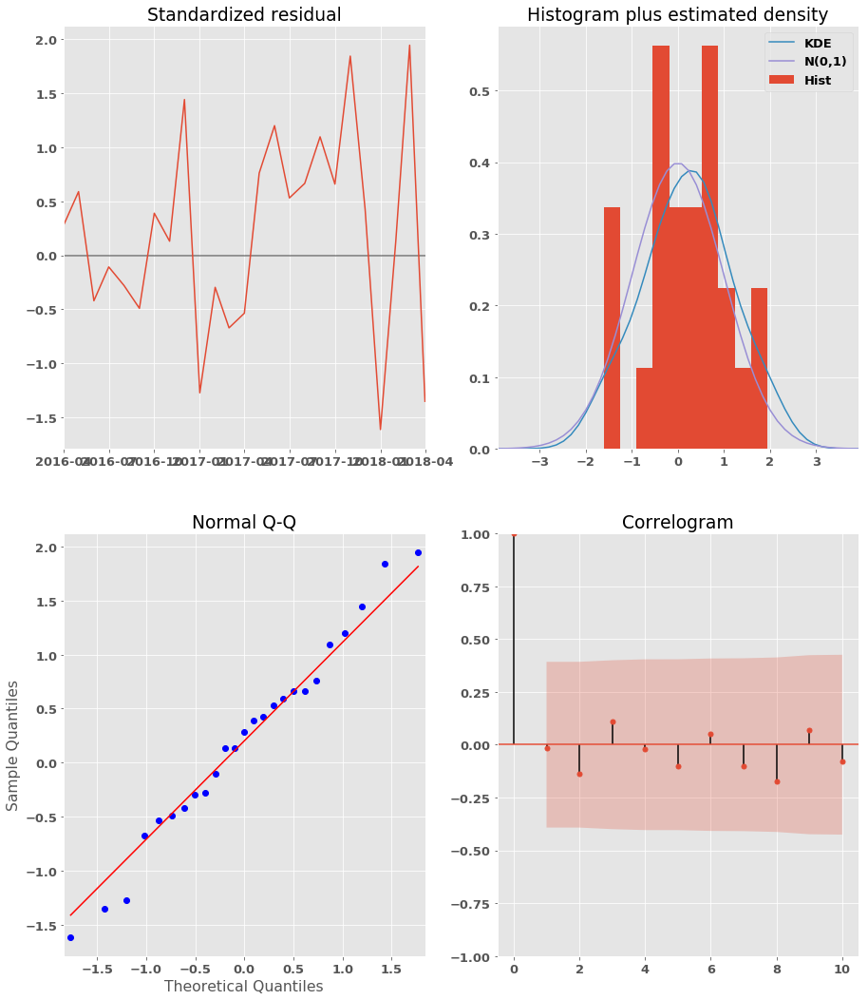



City:Mountain View,CA   Zipcode:94040
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 567.3281184688101
BIC: 571.1024080828745
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9318      0.127      7.327      0.000       0.683       1.181
ar.S.L12      -0.9890      0.289     -3.426      0.001      -1.555      -0.423
sigma2      1.878e+08   9.77e-11   1.92e+18      0.000    1.88e+08    1.88e+08


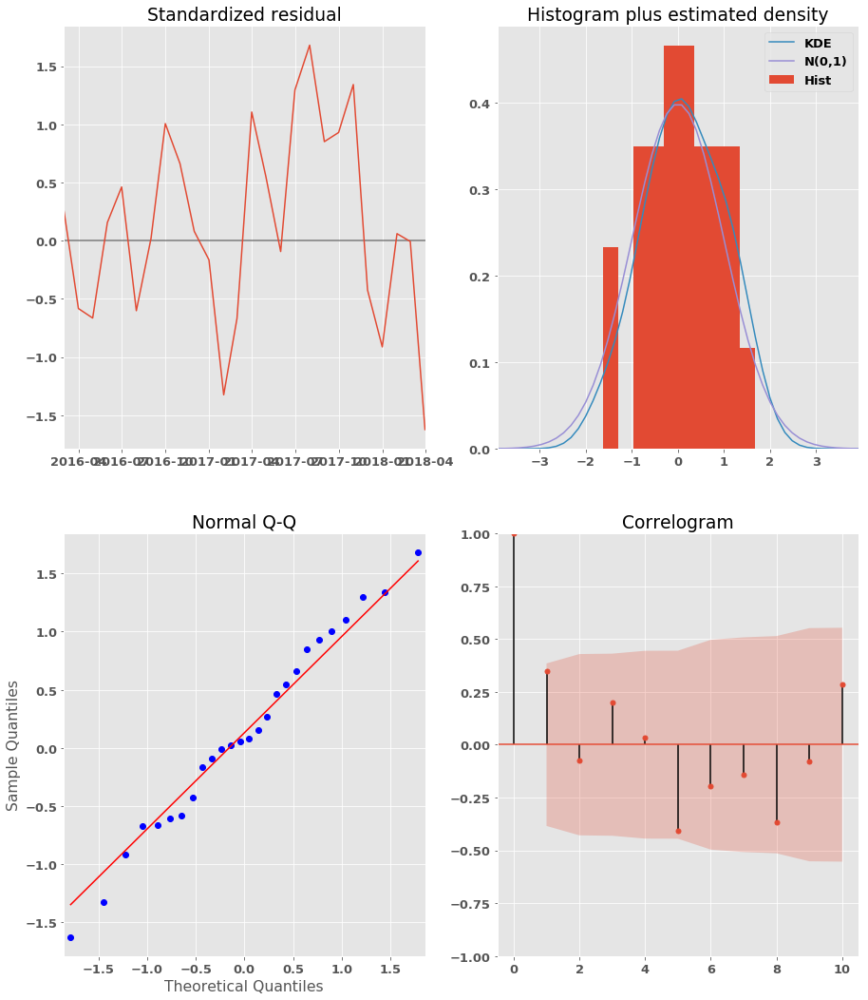



City:Foster City,CA   Zipcode:94404
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 533.156331753451
BIC: 538.1887179055369
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8196      0.151      5.428      0.000       0.524       1.116
ma.L1          0.7361      0.255      2.891      0.004       0.237       1.235
ar.S.L12       0.0249      0.096      0.260      0.795      -0.163       0.213
sigma2      3.869e+07   4.64e-10   8.34e+16      0.000    3.87e+07    3.87e+07


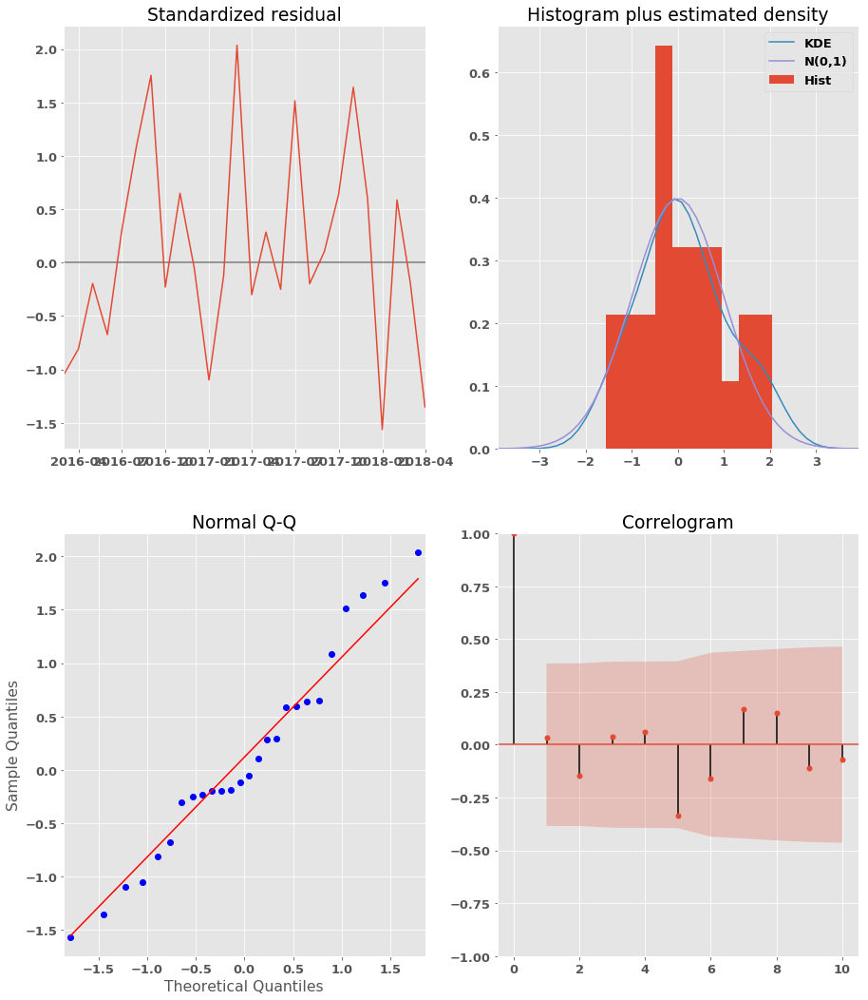



City:San Jose,CA   Zipcode:95129
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 560.2401711934552
BIC: 564.0144608075196
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9668      0.084     11.467      0.000       0.802       1.132
ar.S.L12      -0.5382      0.331     -1.624      0.104      -1.188       0.111
sigma2      1.071e+08   1.03e-09   1.04e+17      0.000    1.07e+08    1.07e+08


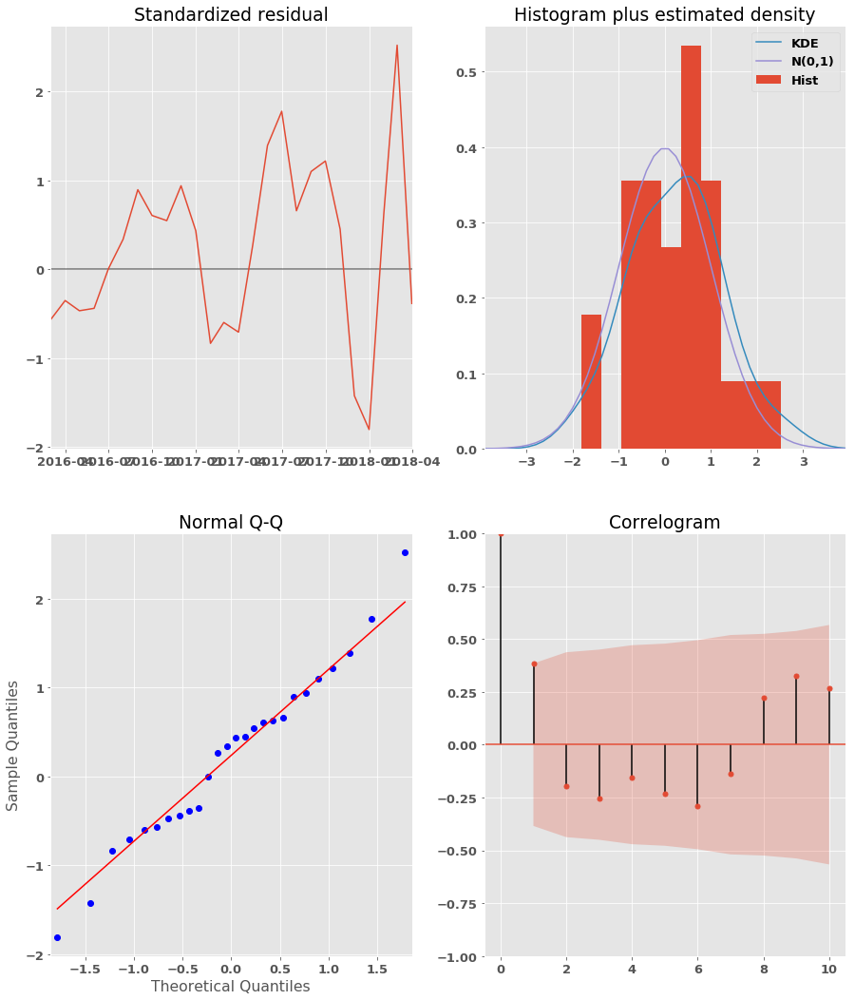



City:Redwood City,CA   Zipcode:94061
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 546.7495216024305
BIC: 550.5238112164949
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8966      0.089     10.047      0.000       0.722       1.071
ar.S.L12      -0.5447      0.299     -1.821      0.069      -1.131       0.042
sigma2      7.123e+07   9.36e-10   7.61e+16      0.000    7.12e+07    7.12e+07


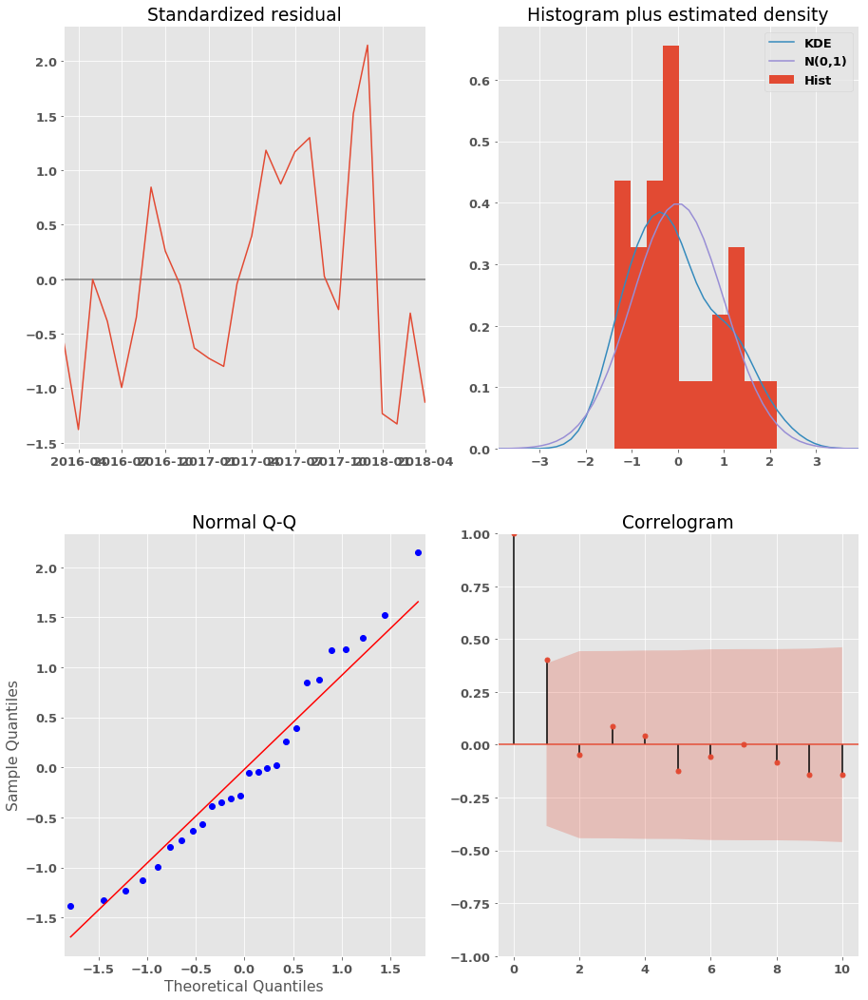



City:Mountain View,CA   Zipcode:94043
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 558.959049026133
BIC: 562.7333386401974
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9584      0.069     13.873      0.000       0.823       1.094
ar.S.L12      -0.6247      0.248     -2.516      0.012      -1.111      -0.138
sigma2      1.205e+08   1.68e-10   7.19e+17      0.000    1.21e+08    1.21e+08


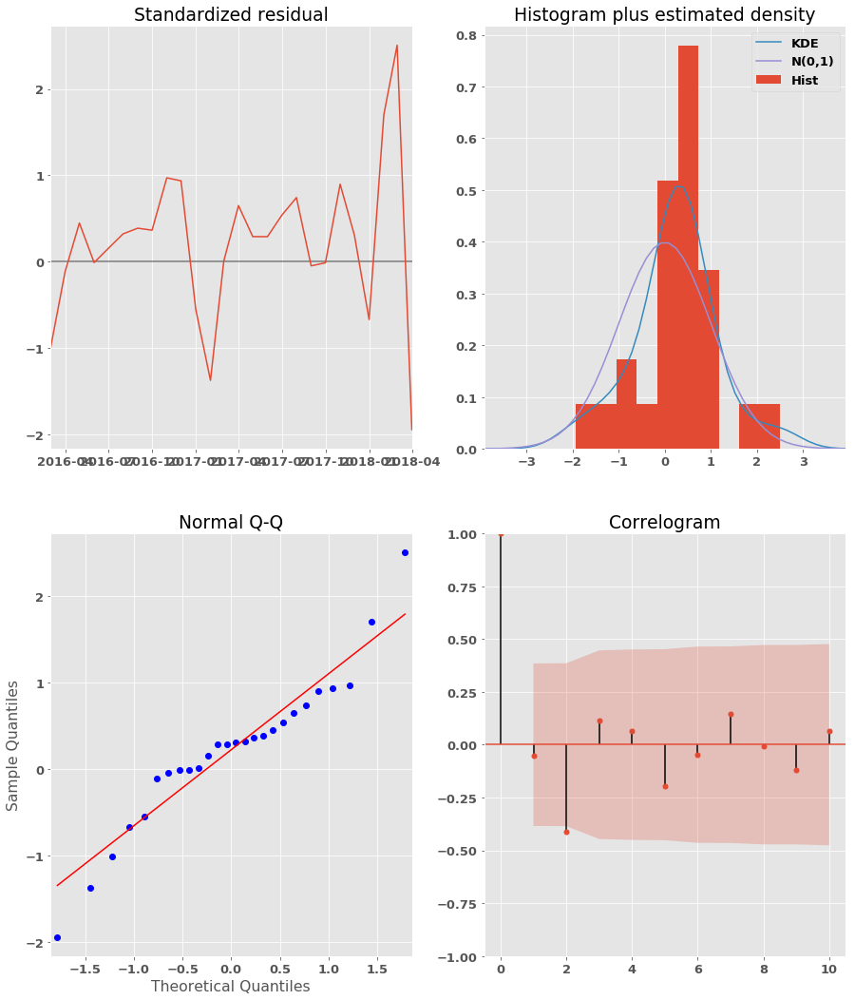



City:San Jose,CA   Zipcode:95120
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 528.2381191704344
BIC: 532.0124087844988
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9559      0.086     11.057      0.000       0.786       1.125
ar.S.L12      -0.6611      0.297     -2.223      0.026      -1.244      -0.078
sigma2      4.077e+07   1.01e-09   4.03e+16      0.000    4.08e+07    4.08e+07


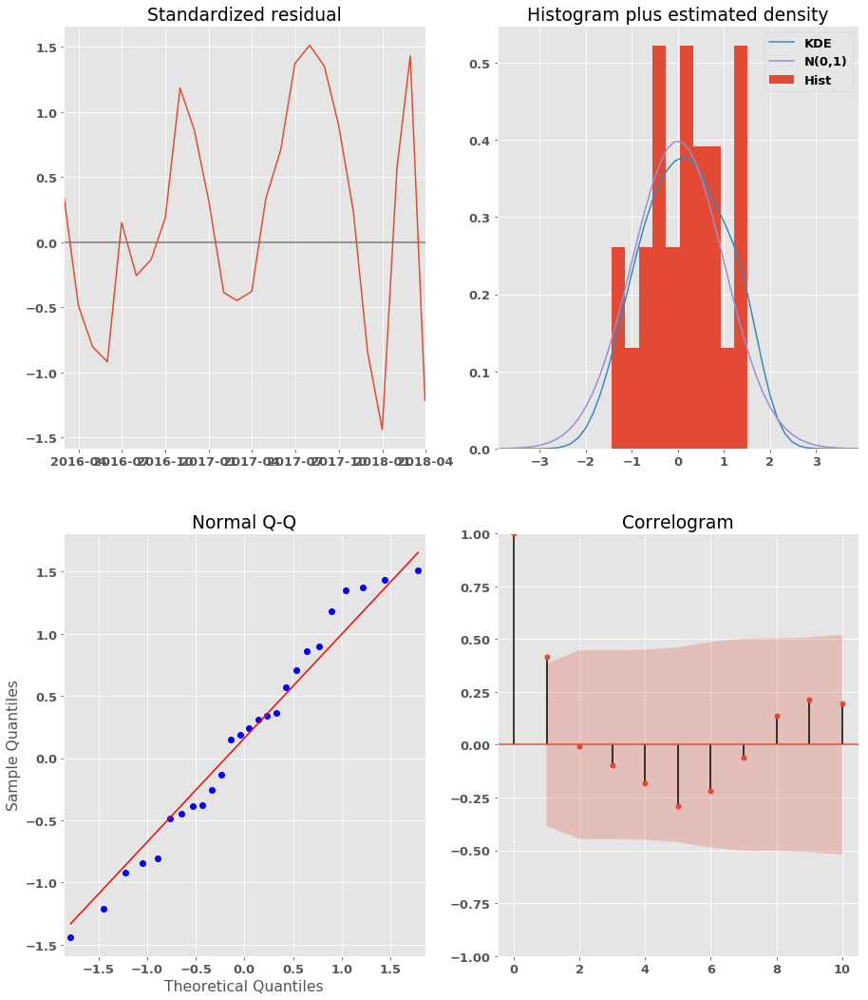



City:Palo Alto,CA   Zipcode:94306
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 561.9444355233696
BIC: 566.9768216754555
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8633      0.100      8.627      0.000       0.667       1.059
ma.L1          0.7842      0.179      4.380      0.000       0.433       1.135
ar.S.L12       0.0569      0.143      0.399      0.690      -0.223       0.336
sigma2      1.086e+08   4.37e-10   2.48e+17      0.000    1.09e+08    1.09e+08


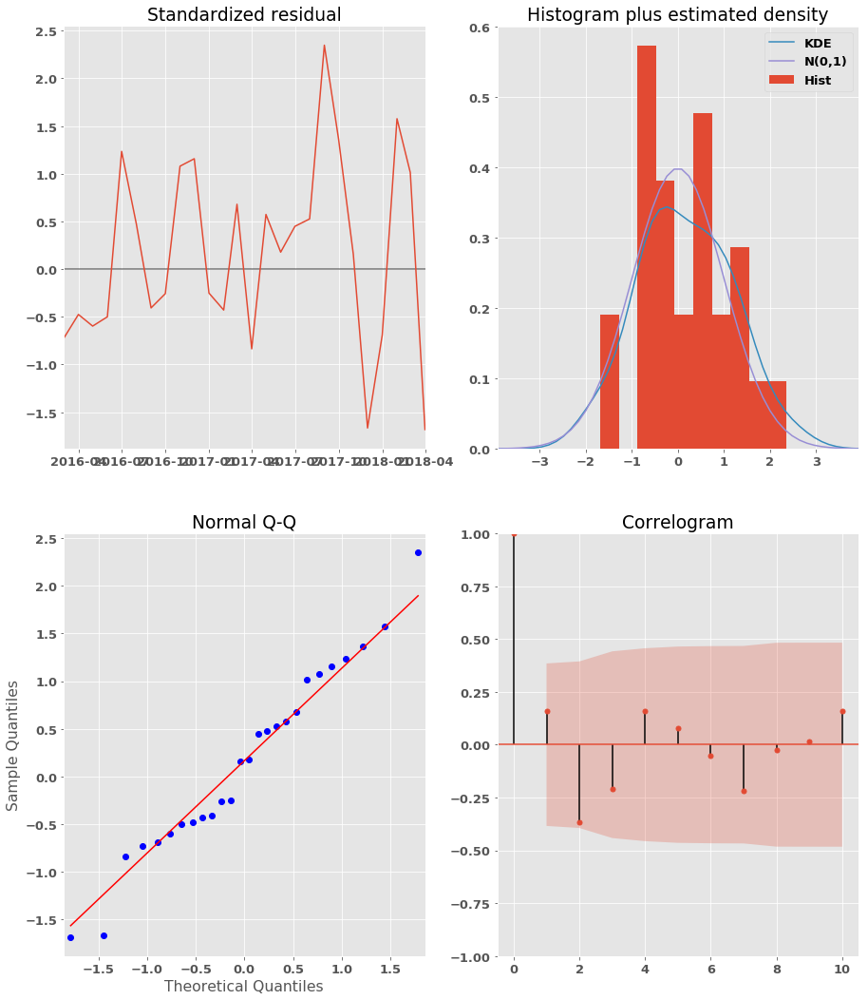



City:Redwood City,CA   Zipcode:94062
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 557.4250061537595
BIC: 562.4573923058454
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8351      0.107      7.788      0.000       0.625       1.045
ma.L1          0.6805      0.183      3.715      0.000       0.321       1.040
ar.S.L12       0.0005      0.033      0.016      0.987      -0.065       0.066
sigma2      7.921e+07   3.28e-10   2.42e+17      0.000    7.92e+07    7.92e+07


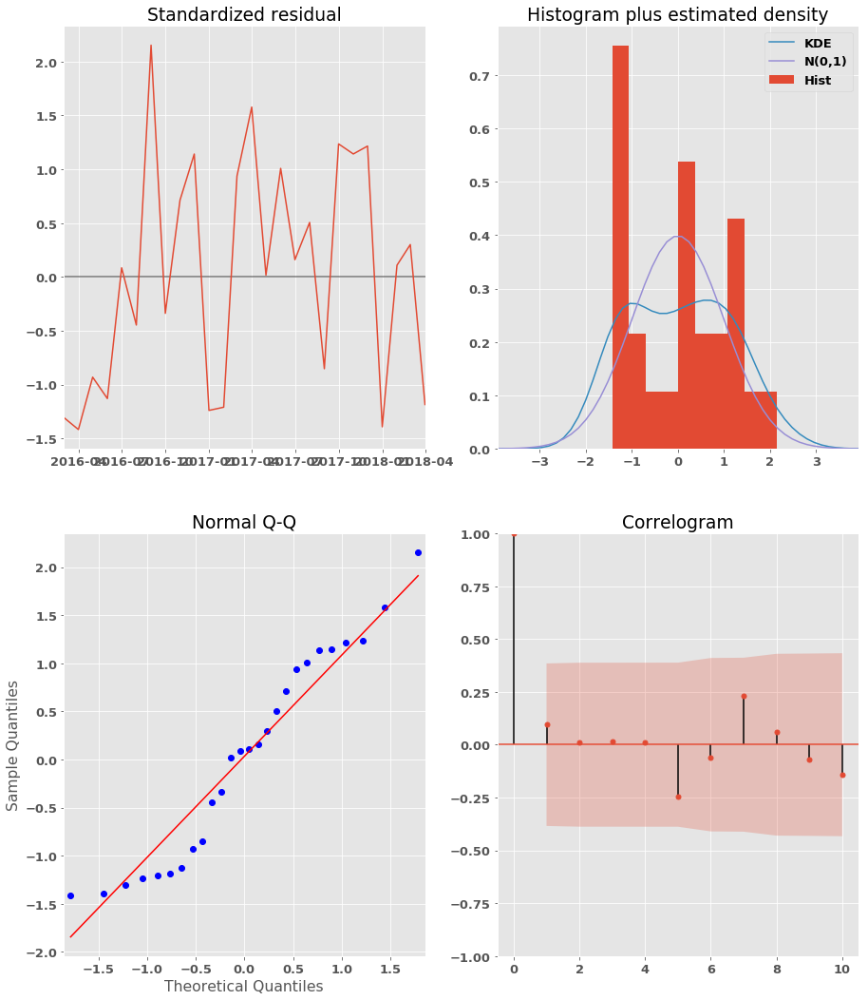



City:Los Altos,CA   Zipcode:94024
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 566.7743699945117
BIC: 570.5486596085761
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9205      0.067     13.717      0.000       0.789       1.052
ar.S.L12      -0.5452      0.297     -1.834      0.067      -1.128       0.038
sigma2      1.253e+08   5.92e-10   2.11e+17      0.000    1.25e+08    1.25e+08


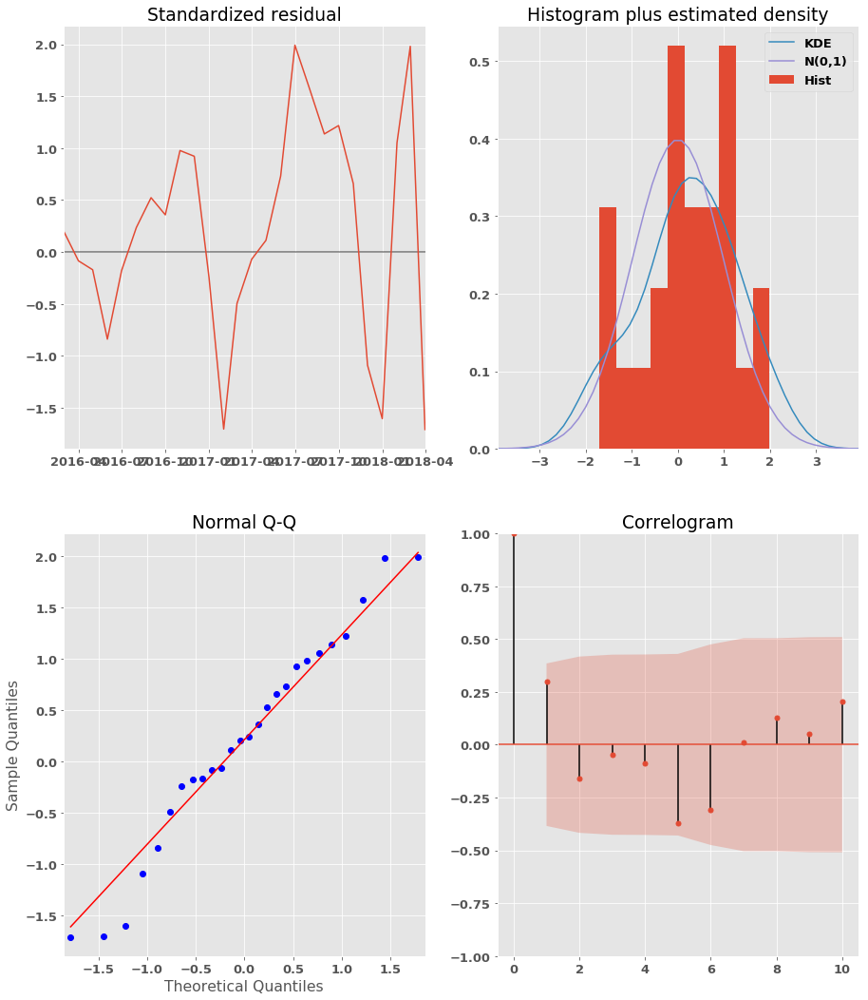



City:Los Altos,CA   Zipcode:94022
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 585.3909524703276
BIC: 589.165242084392
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9221      0.070     13.189      0.000       0.785       1.059
ar.S.L12      -0.3446      0.346     -0.996      0.319      -1.023       0.334
sigma2      2.251e+08   3.38e-11   6.67e+18      0.000    2.25e+08    2.25e+08


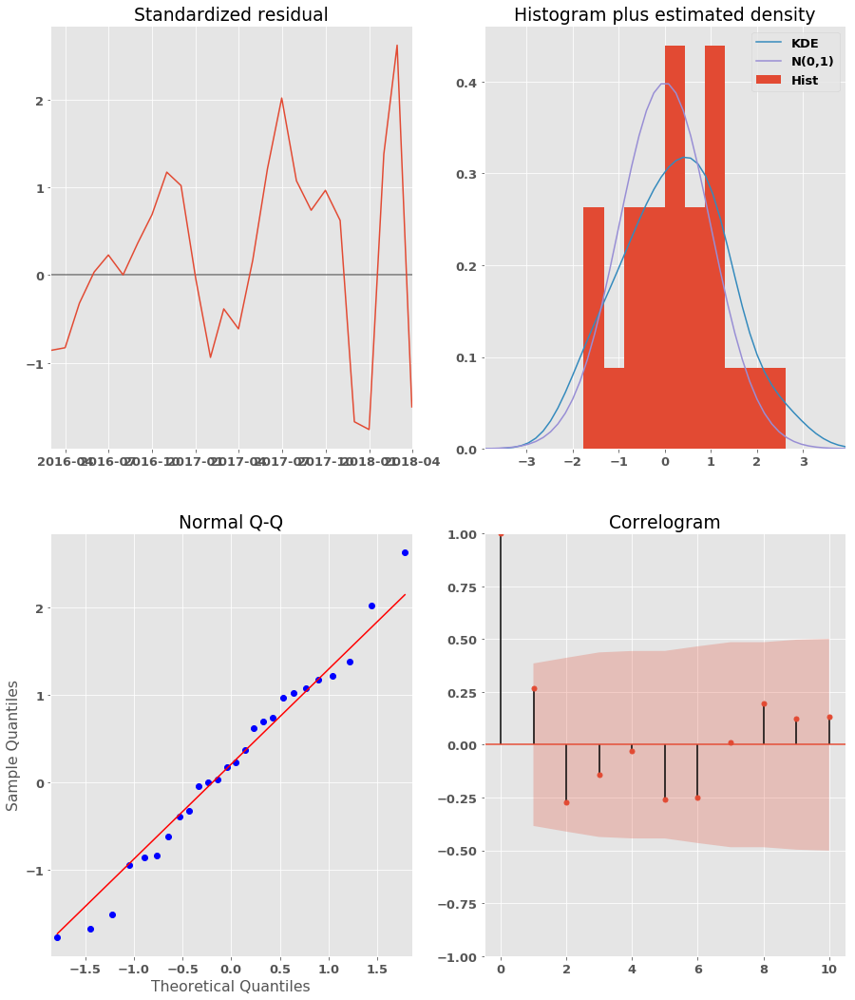



City:San Jose,CA   Zipcode:95135
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 537.7010559421673
BIC: 542.7334420942532
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7758      0.138      5.613      0.000       0.505       1.047
ma.L1          0.7709      0.173      4.448      0.000       0.431       1.111
ar.S.L12       0.0463      0.112      0.413      0.679      -0.173       0.266
sigma2      4.692e+07   1.29e-10   3.62e+17      0.000    4.69e+07    4.69e+07


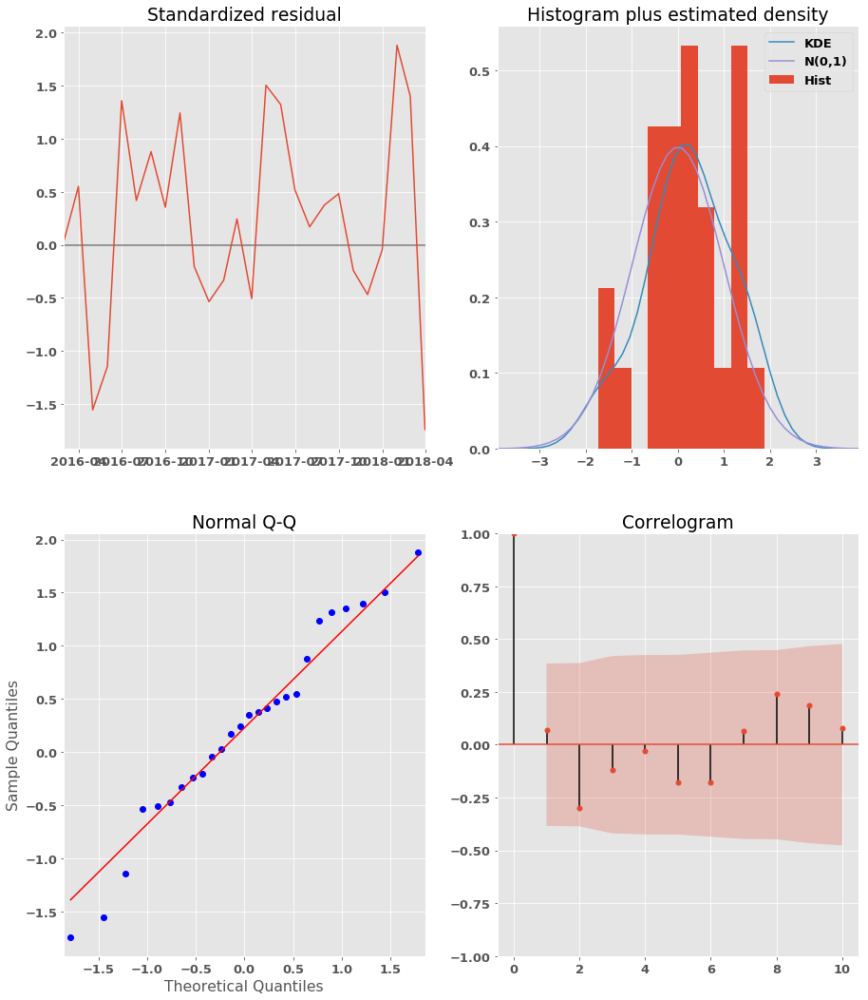



City:Mountain View,CA   Zipcode:94041
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 552.202055617843
BIC: 555.9763452319074
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9741      0.076     12.736      0.000       0.824       1.124
ar.S.L12      -0.1670      0.186     -0.898      0.369      -0.532       0.198
sigma2      7.318e+07   9.84e-10   7.44e+16      0.000    7.32e+07    7.32e+07


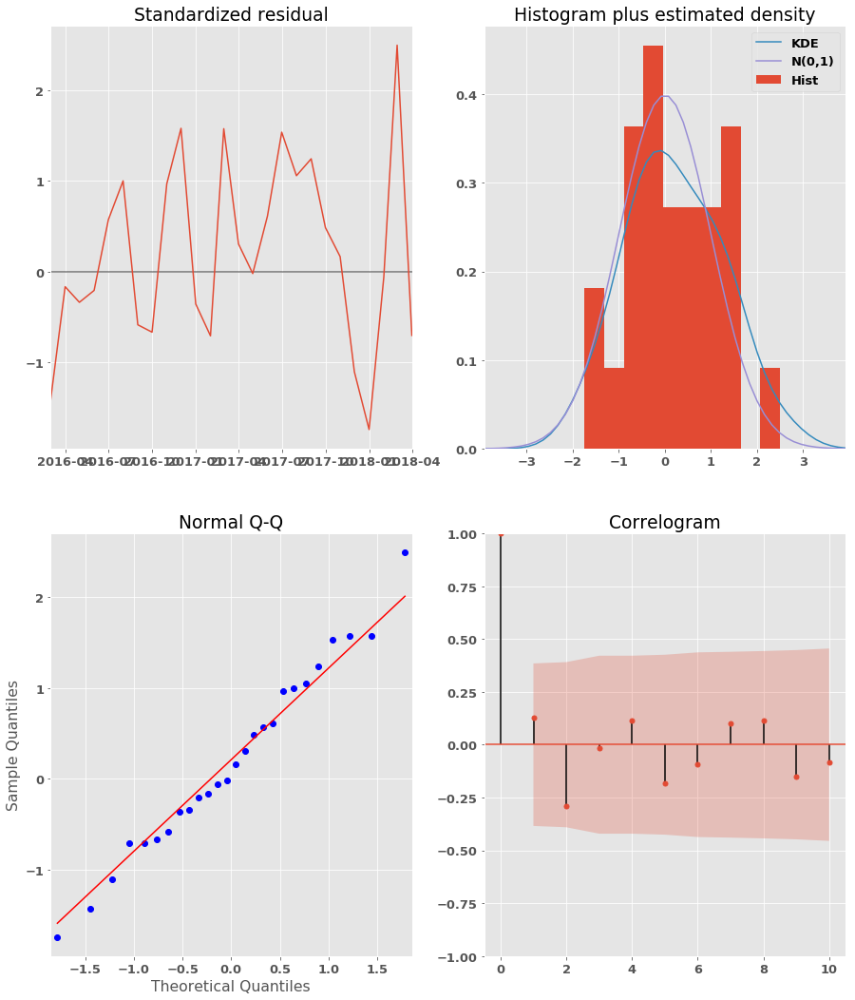



City:Noyack,NY   Zipcode:11963
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 577.4809608442081
BIC: 582.513346996294
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5714      0.285      2.007      0.045       0.013       1.129
ma.L1          1.1859      0.181      6.545      0.000       0.831       1.541
ar.S.L12       0.1213      0.263      0.462      0.644      -0.394       0.636
sigma2      1.755e+08   1.21e-10   1.45e+18      0.000    1.75e+08    1.75e+08


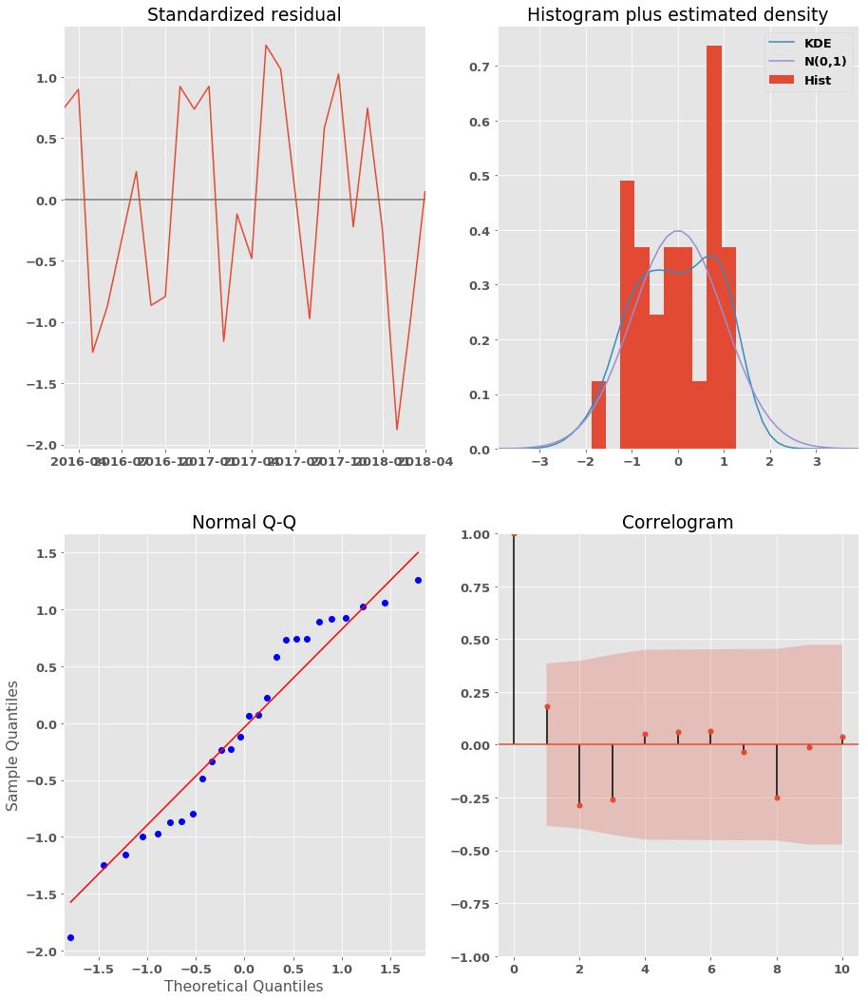



City:Los Gatos,CA   Zipcode:95030
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 576.0889895274074
BIC: 579.8632791414718
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9048      0.164      5.513      0.000       0.583       1.226
ar.S.L12      -0.6714      0.283     -2.373      0.018      -1.226      -0.117
sigma2      2.433e+08   4.17e-11   5.83e+18      0.000    2.43e+08    2.43e+08


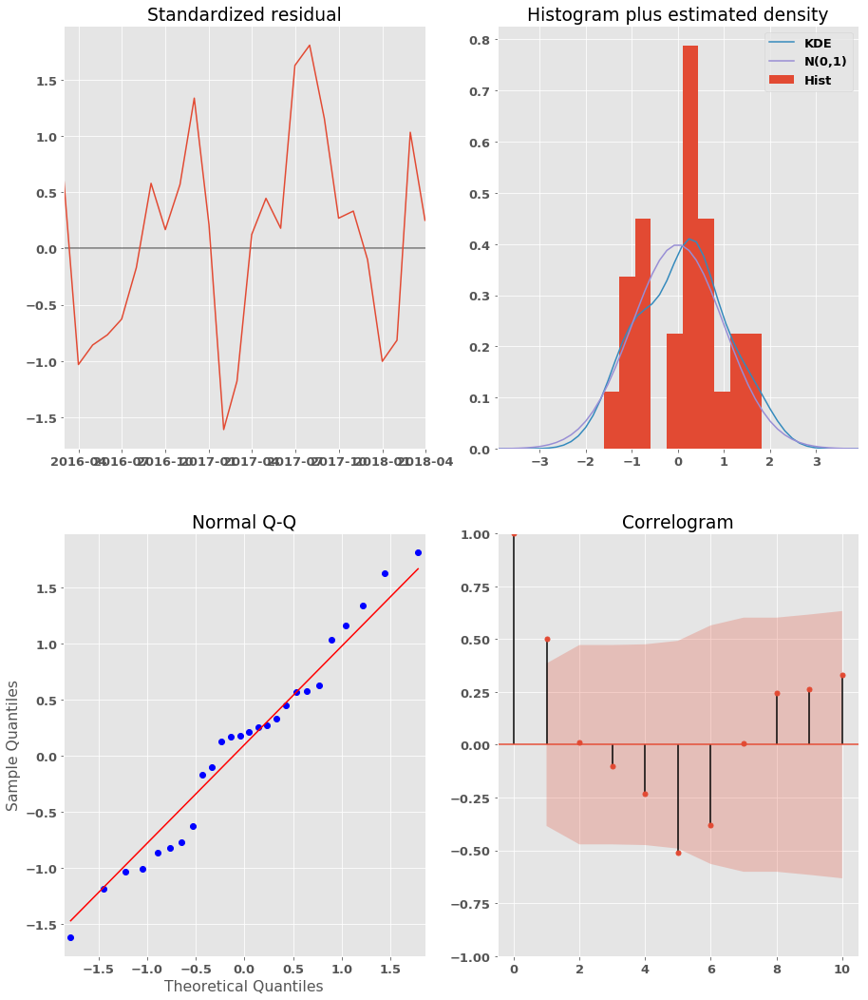



City:Aspen,CO   Zipcode:81611
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 605.8218295257805
BIC: 611.9162086501215
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5646      0.162      3.478      0.001       0.246       0.883
ma.L1          0.7905      0.137      5.778      0.000       0.522       1.059
ar.S.L12       0.2002      0.207      0.967      0.333      -0.206       0.606
ma.S.L12      -0.1416      0.266     -0.532      0.595      -0.663       0.380
sigma2      1.278e+09   4.03e-11   3.17e+19      0.000    1.28e+09    1.28e+09


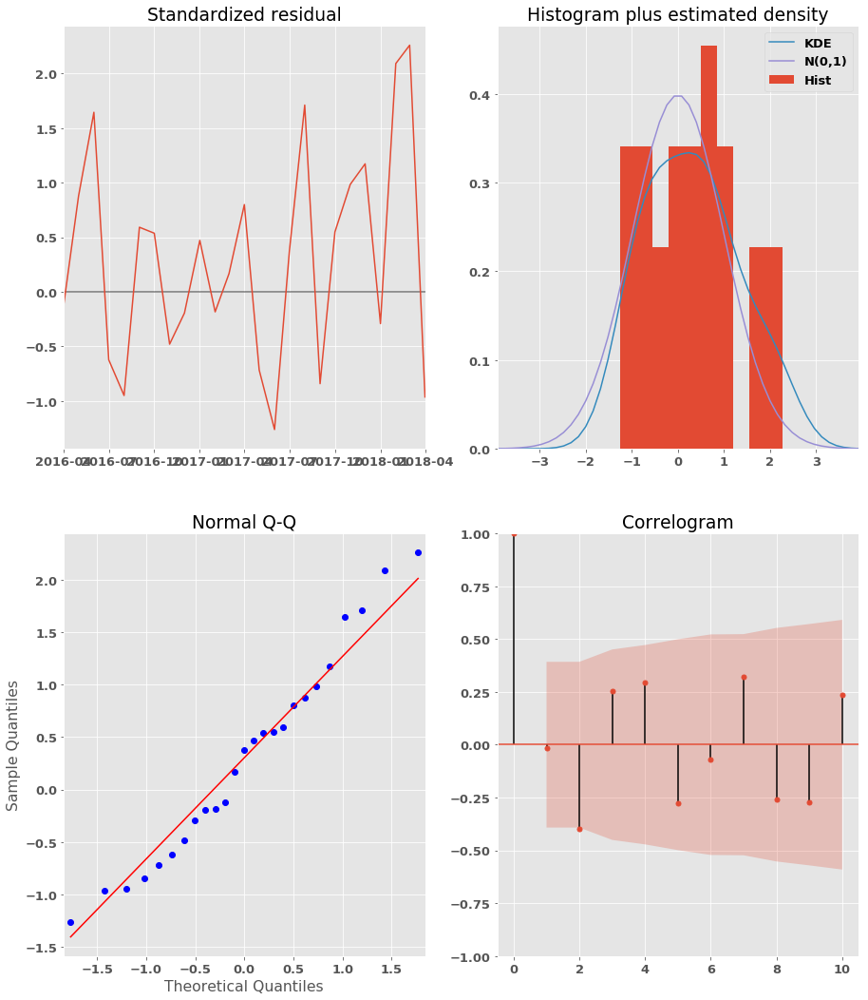



City:San Jose,CA   Zipcode:95130
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 542.9371256365524
BIC: 546.7114152506168
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9290      0.064     14.405      0.000       0.803       1.055
ar.S.L12      -0.5341      0.386     -1.384      0.166      -1.290       0.222
sigma2      4.694e+07   1.28e-09   3.67e+16      0.000    4.69e+07    4.69e+07


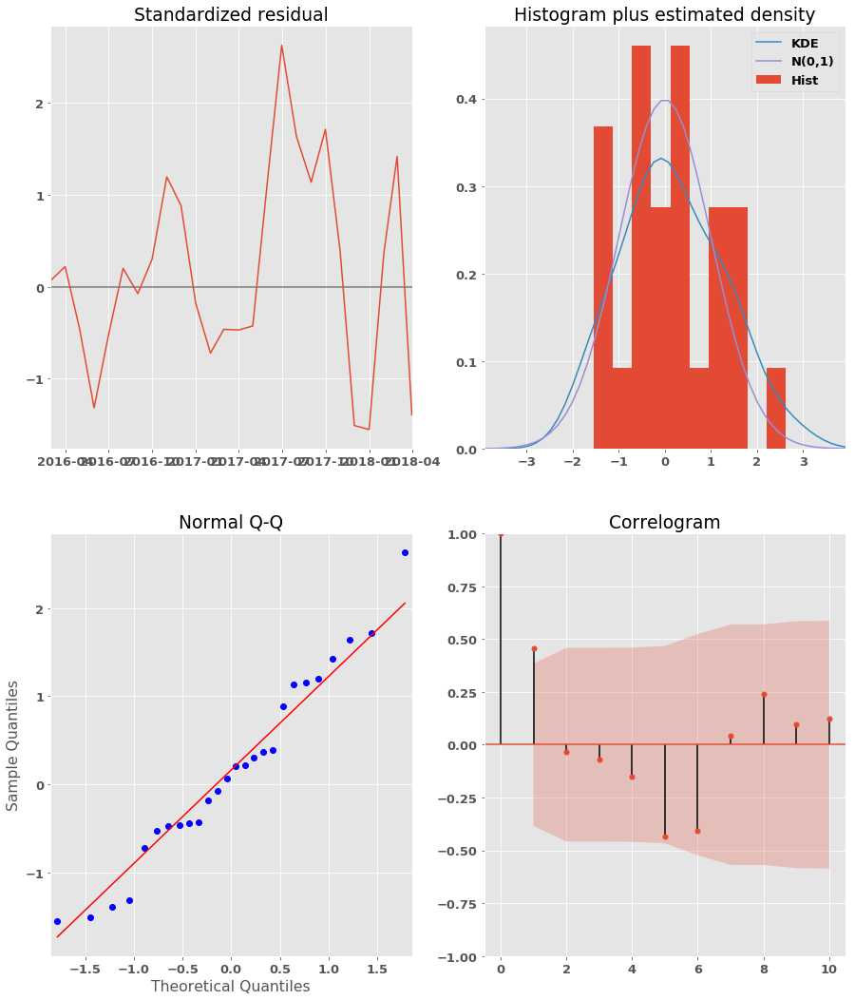



City:Avalon,NJ   Zipcode:8202
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 567.712798429977
BIC: 571.4870880440415
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7991      0.109      7.336      0.000       0.586       1.013
ar.S.L12      -1.0014      0.438     -2.288      0.022      -1.859      -0.144
sigma2      1.491e+08   1.72e-09   8.69e+16      0.000    1.49e+08    1.49e+08


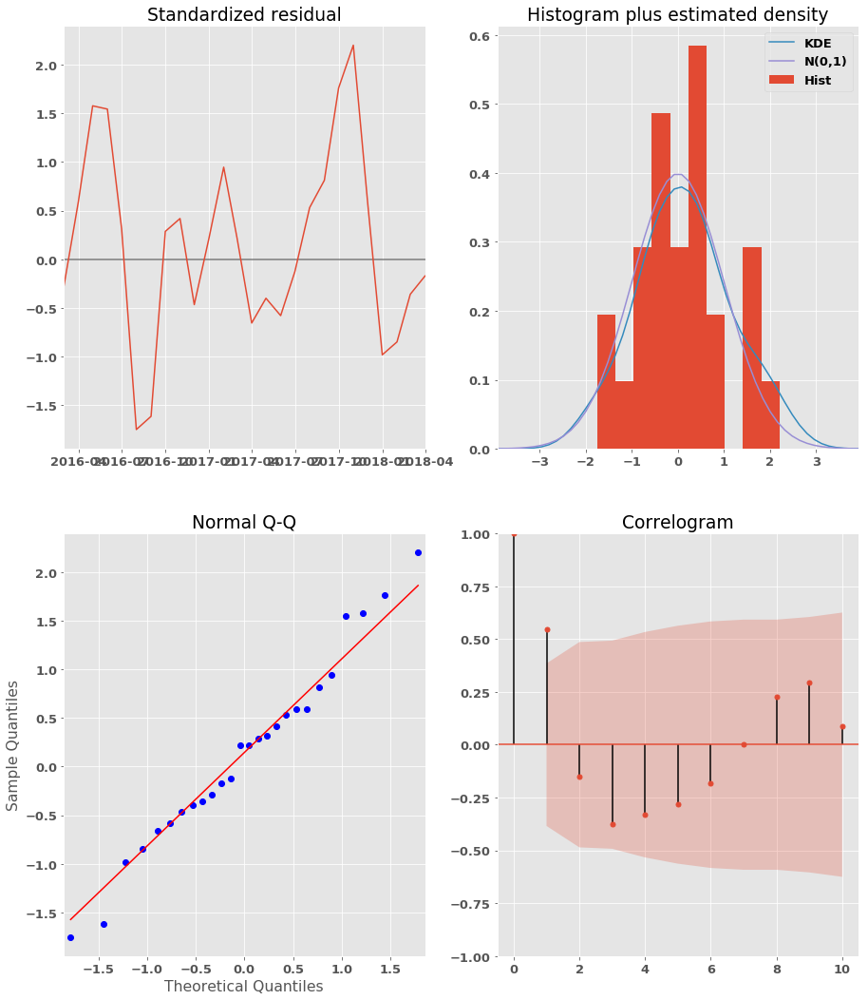



City:Bridgehampton,NY   Zipcode:11932
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 0, 12)
AIC: 569.0746433838538
BIC: 574.1070295359397
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6819      0.184      3.700      0.000       0.321       1.043
ma.L1          0.7586      0.123      6.147      0.000       0.517       1.000
ar.S.L12       0.0362      0.071      0.511      0.610      -0.103       0.175
sigma2      1.249e+08   9.04e-10   1.38e+17      0.000    1.25e+08    1.25e+08


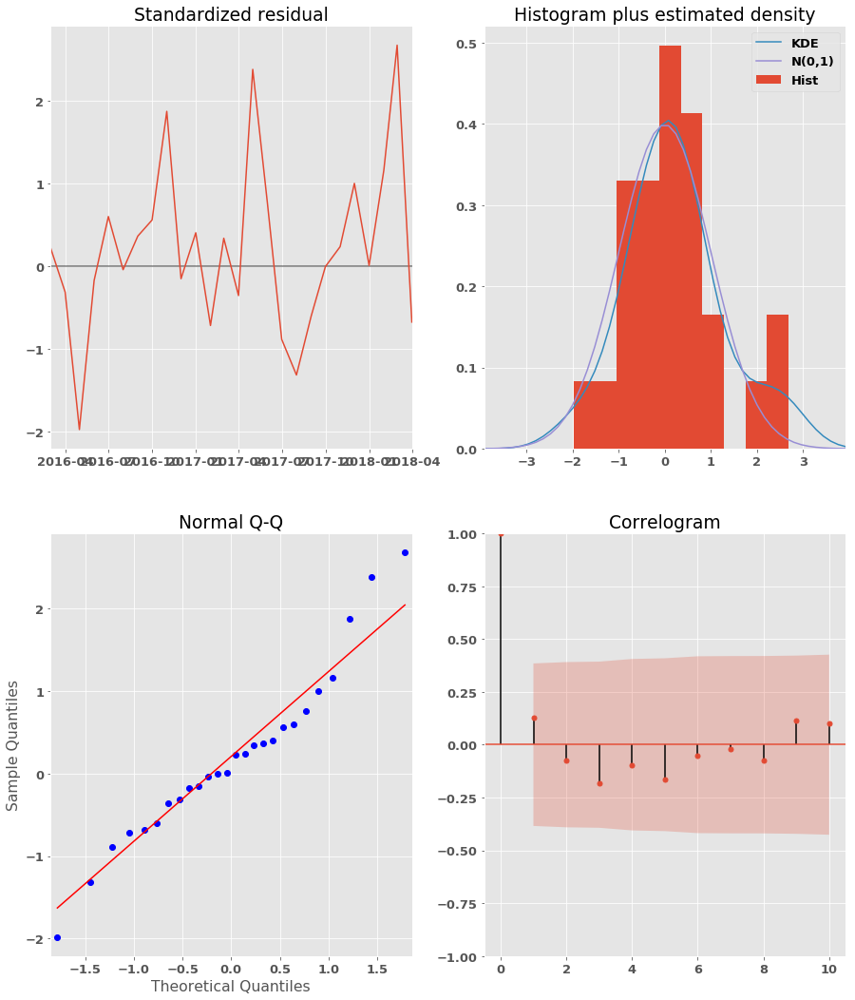

In [30]:
# plug the optimal parameter values into a new SARIMAX model.
outputs =[]
for i in range(len(minAICs)):
    series = timeseries[i][1]
    ARIMA_MODEL = sm.tsa.statespace.SARIMAX(series,
                                    order=minAICs[i]['pdq'],
                                    seasonal_order= minAICs[i]['pdqs'],
                                    enforce_stationarity=False,
                                    enforce_invertibility=False)
    # Fit the model and print results
    output = ARIMA_MODEL.fit()
    
    print(titles[i])
    print('Non-seasonal parameters (p,d,q):', minAICs[i]['pdq'])
    print('Seasonal parameters and periodicity (P,D,Q,s):', minAICs[i]['pdqs'])
    print('AIC:', minAICs[i]['aic'])
    print('BIC:', minAICs[i]['bic'])
    print(output.summary().tables[1])
    output.plot_diagnostics(figsize=(15,18))
    plt.show()
    outputs.append(output)
    print('\n')



In models, there are parameters that have p-value greater than 0.5. So we iterate through results again.

In [31]:
count =0
for i, output in enumerate(outputs):

    if sum(output.pvalues >0.05)>0:
        print('index:', i,'\n')
        print(np.round(output.pvalues,3))
        count +=1

index: 1 

ar.L1       0.000
ma.L1       0.018
ar.S.L12    0.848
sigma2      0.000
dtype: float64
index: 3 

ar.L1       0.002
ma.L1       0.002
ar.S.L12    0.822
sigma2      0.000
dtype: float64
index: 4 

ar.L1       0.000
ma.L1       0.000
ar.S.L12    0.670
ma.S.L12    0.834
sigma2      0.000
dtype: float64
index: 6 

ar.L1       0.000
ma.L1       0.004
ar.S.L12    0.795
sigma2      0.000
dtype: float64
index: 7 

ar.L1       0.000
ar.S.L12    0.104
sigma2      0.000
dtype: float64
index: 8 

ar.L1       0.000
ar.S.L12    0.069
sigma2      0.000
dtype: float64
index: 11 

ar.L1       0.00
ma.L1       0.00
ar.S.L12    0.69
sigma2      0.00
dtype: float64
index: 12 

ar.L1       0.000
ma.L1       0.000
ar.S.L12    0.987
sigma2      0.000
dtype: float64
index: 13 

ar.L1       0.000
ar.S.L12    0.067
sigma2      0.000
dtype: float64
index: 14 

ar.L1       0.000
ar.S.L12    0.319
sigma2      0.000
dtype: float64
index: 15 

ar.L1       0.000
ma.L1       0.000
ar.S.L12    0.679
sigma2  

In [32]:
count

16

As we expected from the EDA step, seasonal parameters are shown to be insignificant in 16 models.
To see if the adjustment of seasonal parameters can improve the models, we extract indexes that has insignificant seasonal parameters.  

In [33]:
idxs =[]
for i, output in enumerate(outputs):

    if sum(output.pvalues >0.05)>0:
        idxs.append(i)
        print('index:', i)
        print(output.pvalues.index[np.where(output.pvalues>0.05)])
        

index: 1
Index(['ar.S.L12'], dtype='object')
index: 3
Index(['ar.S.L12'], dtype='object')
index: 4
Index(['ar.S.L12', 'ma.S.L12'], dtype='object')
index: 6
Index(['ar.S.L12'], dtype='object')
index: 7
Index(['ar.S.L12'], dtype='object')
index: 8
Index(['ar.S.L12'], dtype='object')
index: 11
Index(['ar.S.L12'], dtype='object')
index: 12
Index(['ar.S.L12'], dtype='object')
index: 13
Index(['ar.S.L12'], dtype='object')
index: 14
Index(['ar.S.L12'], dtype='object')
index: 15
Index(['ar.S.L12'], dtype='object')
index: 16
Index(['ar.S.L12'], dtype='object')
index: 17
Index(['ar.S.L12'], dtype='object')
index: 19
Index(['ar.S.L12', 'ma.S.L12'], dtype='object')
index: 20
Index(['ar.S.L12'], dtype='object')
index: 22
Index(['ar.S.L12'], dtype='object')


Then, we save adjusted the seasonal parameters for the corresponding models. 

In [34]:
seasonal ={}
for i in idxs:
    if i in [4,19]:
        seasonal[i] = {'pdqs':(0,1,0,12)}
    else:
        seasonal[i]={'pdqs':(0,1,1,12)}

City:Sunnyvale,CA   Zipcode:94087
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 545.092079816841 	 AIC: 1025.135384413844
BIC in minAIC: 550.1244659689269 	BIC: 1030.0108877133166
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8912   1.64e-27   5.43e+26      0.000       0.891       0.891
ma.L1          0.5401         -0       -inf      0.000       0.540       0.540
ma.S.L12   -5.933e+14   1.21e-33  -4.89e+47      0.000   -5.93e+14   -5.93e+14
sigma2      2.112e-13   3.79e-10      0.001      1.000   -7.44e-10    7.44e-10


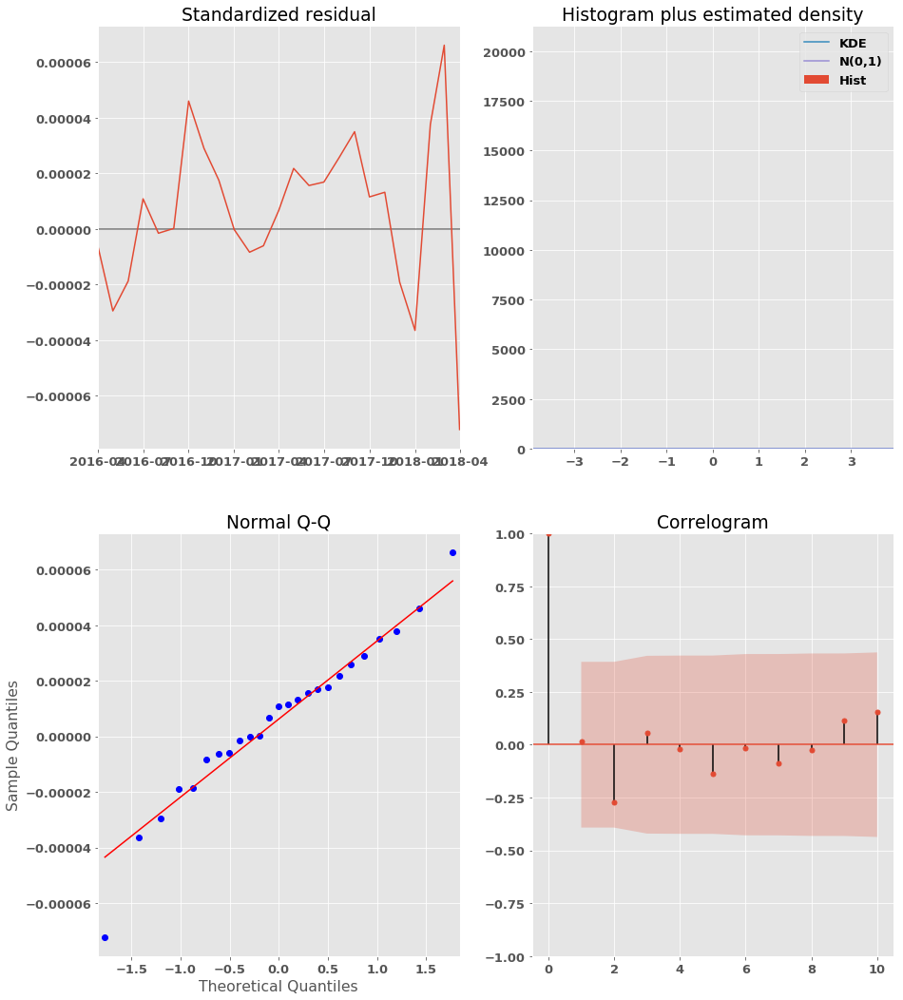



City:San Mateo,CA   Zipcode:94403
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 536.8559715168466 	 AIC: 1093.1977683801706
BIC in minAIC: 541.8883576689325 	BIC: 1098.0732716796433
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6924         -0       -inf      0.000       0.692       0.692
ma.L1          0.6557         -0       -inf      0.000       0.656       0.656
ma.S.L12   -9.164e+14   7.86e-34  -1.17e+48      0.000   -9.16e+14   -9.16e+14
sigma2      1.347e-12    3.8e-10      0.004      0.997   -7.43e-10    7.45e-10


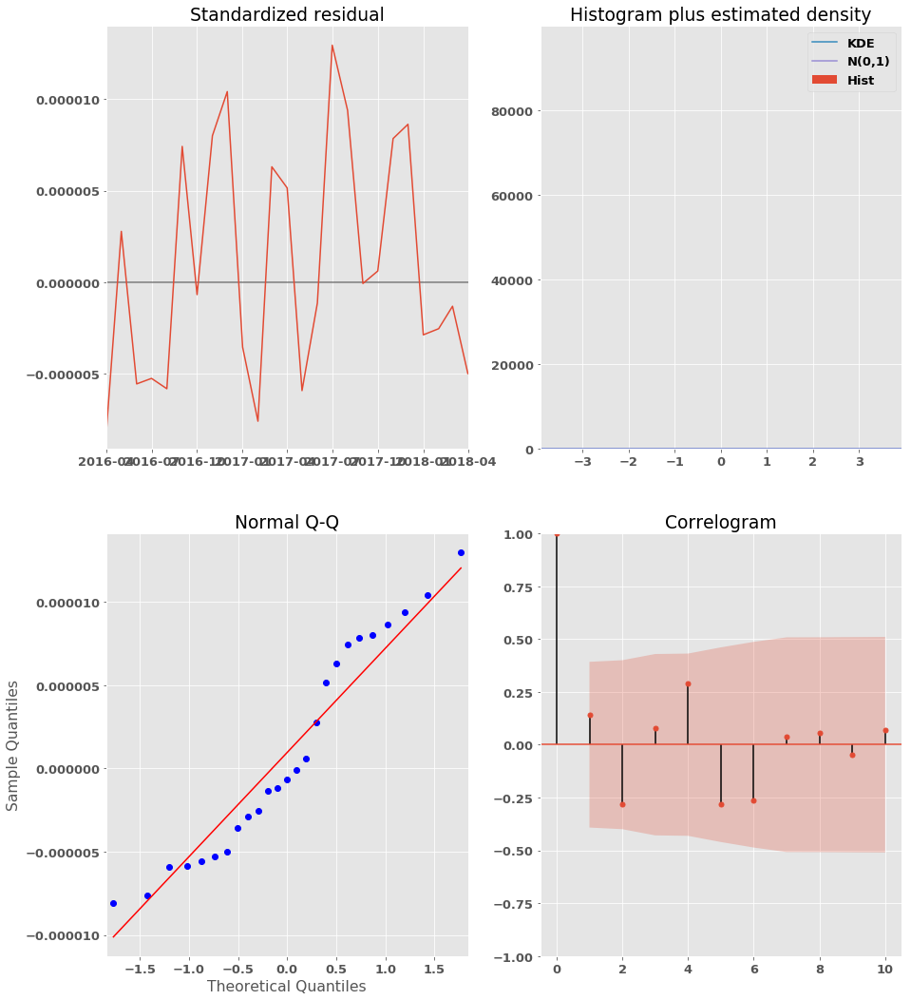



City:Menlo Park,CA   Zipcode:94025
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 0, 12)
minAIC: 536.6341309616589 	 AIC: 795.6809514112709
BIC in minAIC: 542.7285100859999 	BIC: 800.5137051492036
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9376      0.045     20.956      0.000       0.850       1.025
ma.L1          0.0817      0.068      1.207      0.228      -0.051       0.214
sigma2      9.352e+07   1.92e-11   4.87e+18      0.000    9.35e+07    9.35e+07


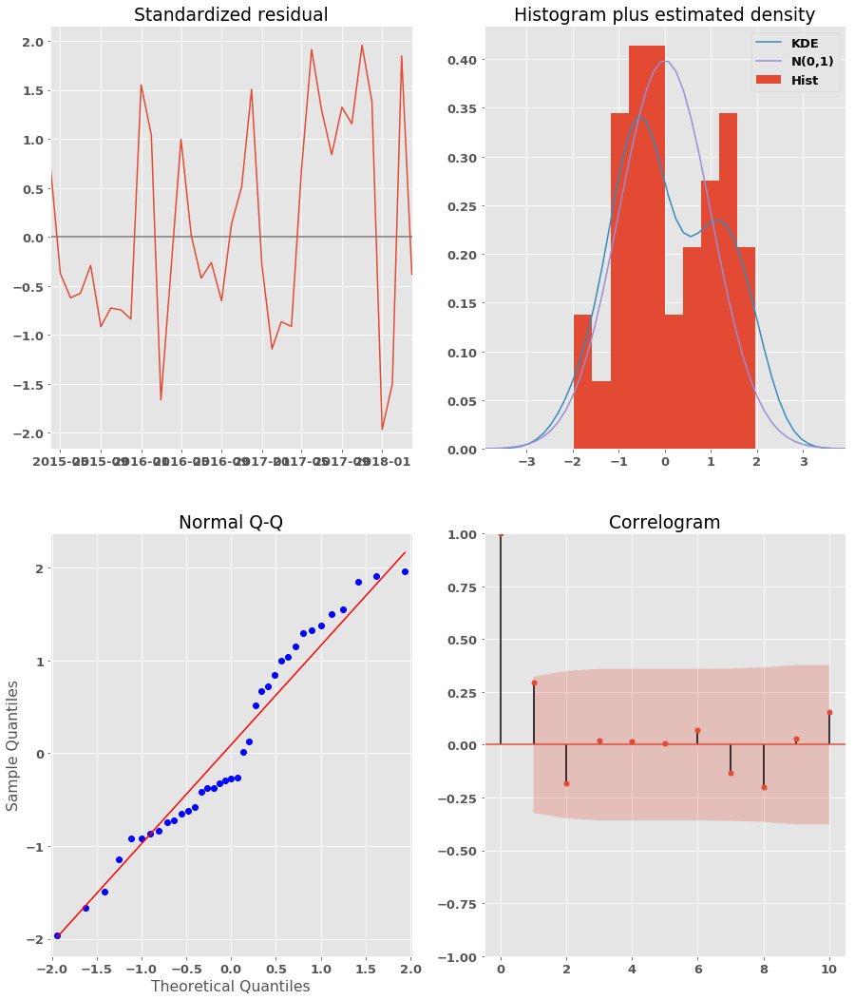



City:Foster City,CA   Zipcode:94404
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 533.156331753451 	 AIC: 1246.1373397451493
BIC in minAIC: 538.1887179055369 	BIC: 1251.012843044622
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7838         -0       -inf      0.000       0.784       0.784
ma.L1          0.7443         -0       -inf      0.000       0.744       0.744
ma.S.L12    5.893e+14   4.84e-33   1.22e+47      0.000    5.89e+14    5.89e+14
sigma2      1.479e-09   7.55e-10      1.958      0.050   -1.55e-12    2.96e-09


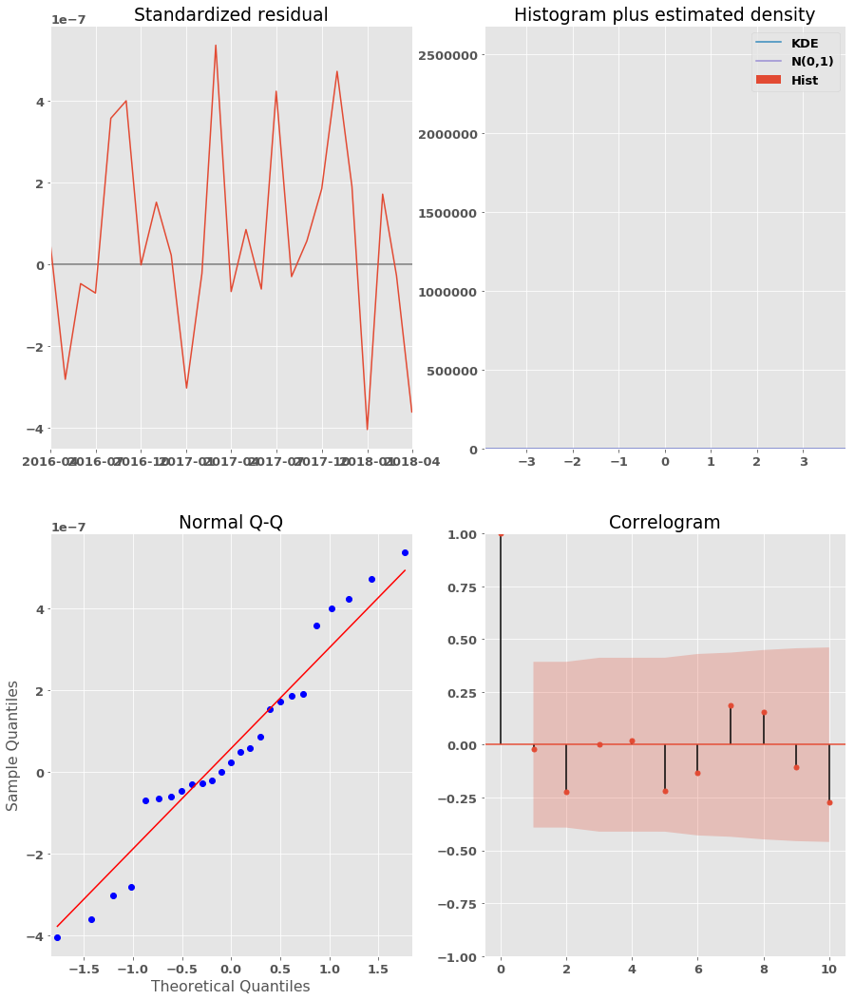



City:San Jose,CA   Zipcode:95129
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 560.2401711934552 	 AIC: 1176.6645204066836
BIC in minAIC: 564.0144608075196 	BIC: 1180.438810020748
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9539         -0       -inf      0.000       0.954       0.954
ma.S.L12    5.412e+14         -0       -inf      0.000    5.41e+14    5.41e+14
sigma2      1.947e-11   3.75e-10      0.052      0.959   -7.16e-10    7.55e-10


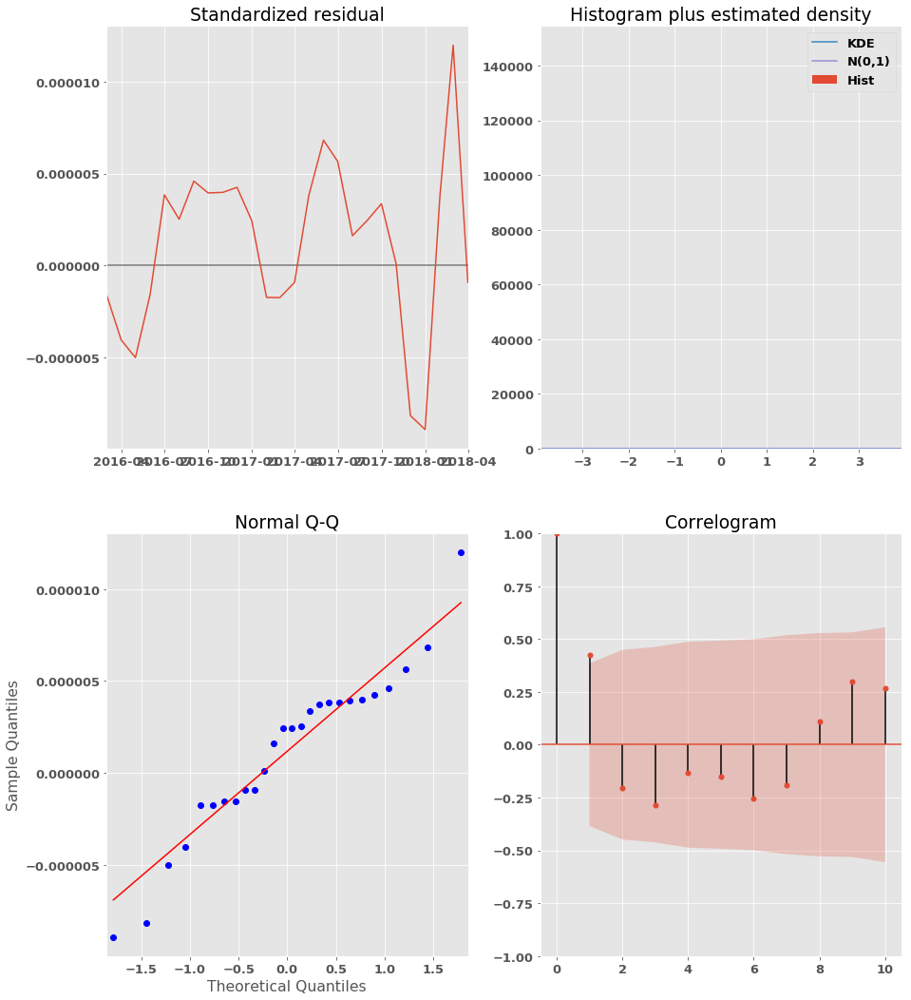



City:Redwood City,CA   Zipcode:94061
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 546.7495216024305 	 AIC: 1056.3760287272032
BIC in minAIC: 550.5238112164949 	BIC: 1060.1503183412676
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8951        nan        nan        nan         nan         nan
ma.S.L12    -3.35e+14         -0        inf      0.000   -3.35e+14   -3.35e+14
sigma2      4.976e-13   3.72e-10      0.001      0.999   -7.29e-10     7.3e-10


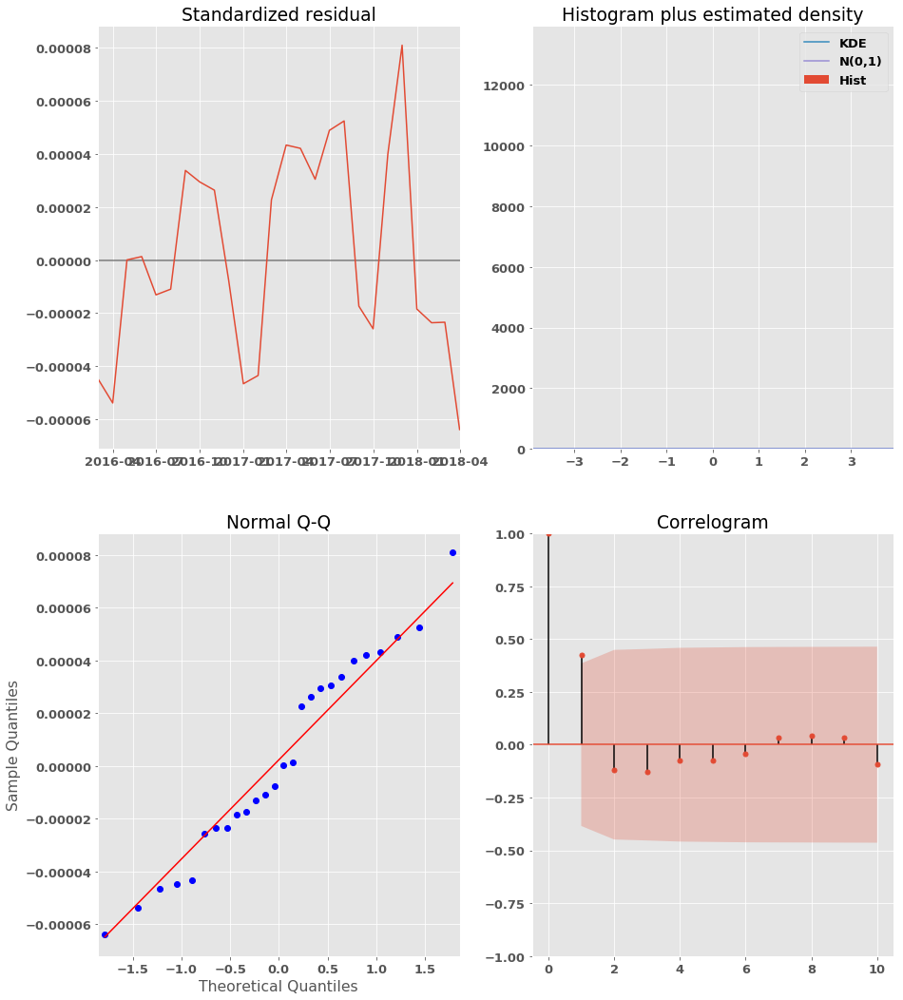



City:Palo Alto,CA   Zipcode:94306
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 561.9444355233696 	 AIC: 1065.3004243610528
BIC in minAIC: 566.9768216754555 	BIC: 1070.1759276605255
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8114         -0       -inf      0.000       0.811       0.811
ma.L1          0.7998         -0       -inf      0.000       0.800       0.800
ma.S.L12   -1.304e+14   5.62e-33  -2.32e+46      0.000    -1.3e+14    -1.3e+14
sigma2      2.179e-11   3.83e-10      0.057      0.955   -7.29e-10    7.72e-10


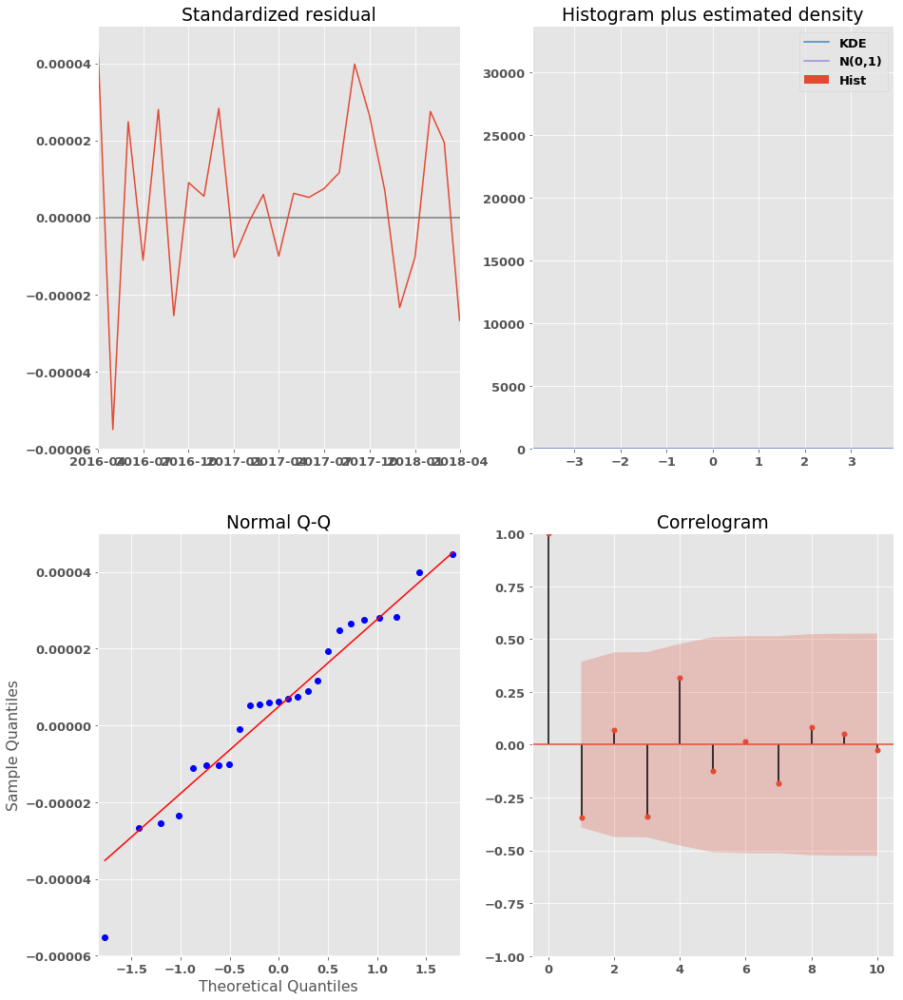



City:Redwood City,CA   Zipcode:94062
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 557.4250061537595 	 AIC: 1092.5220843698185
BIC in minAIC: 562.4573923058454 	BIC: 1097.3975876692912
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8129         -0       -inf      0.000       0.813       0.813
ma.L1          0.6319         -0       -inf      0.000       0.632       0.632
ma.S.L12     3.77e+14   1.92e-33   1.96e+47      0.000    3.77e+14    3.77e+14
sigma2      7.749e-12   3.81e-10      0.020      0.984   -7.38e-10    7.54e-10


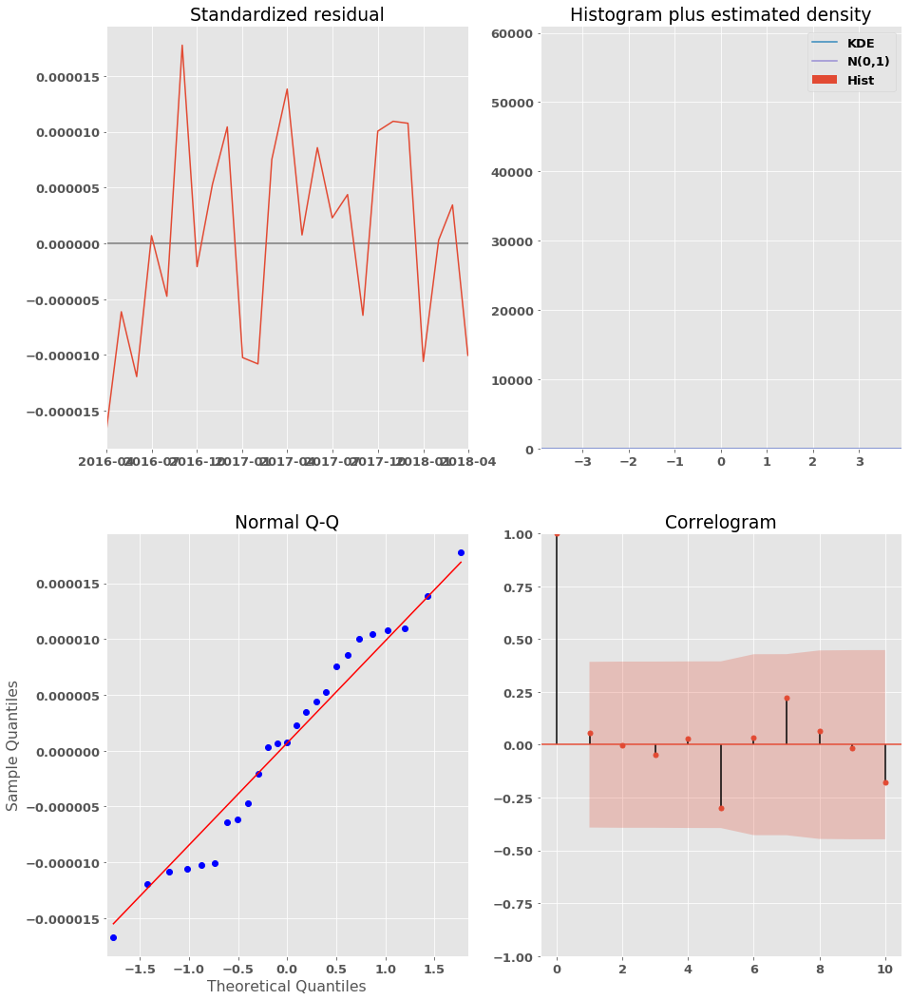



City:Los Altos,CA   Zipcode:94024
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 566.7743699945117 	 AIC: 1193.7647960849577
BIC in minAIC: 570.5486596085761 	BIC: 1197.539085699022
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9181         -0       -inf      0.000       0.918       0.918
ma.S.L12    1.797e+15         -0       -inf      0.000     1.8e+15     1.8e+15
sigma2      3.409e-12   3.73e-10      0.009      0.993   -7.27e-10    7.34e-10


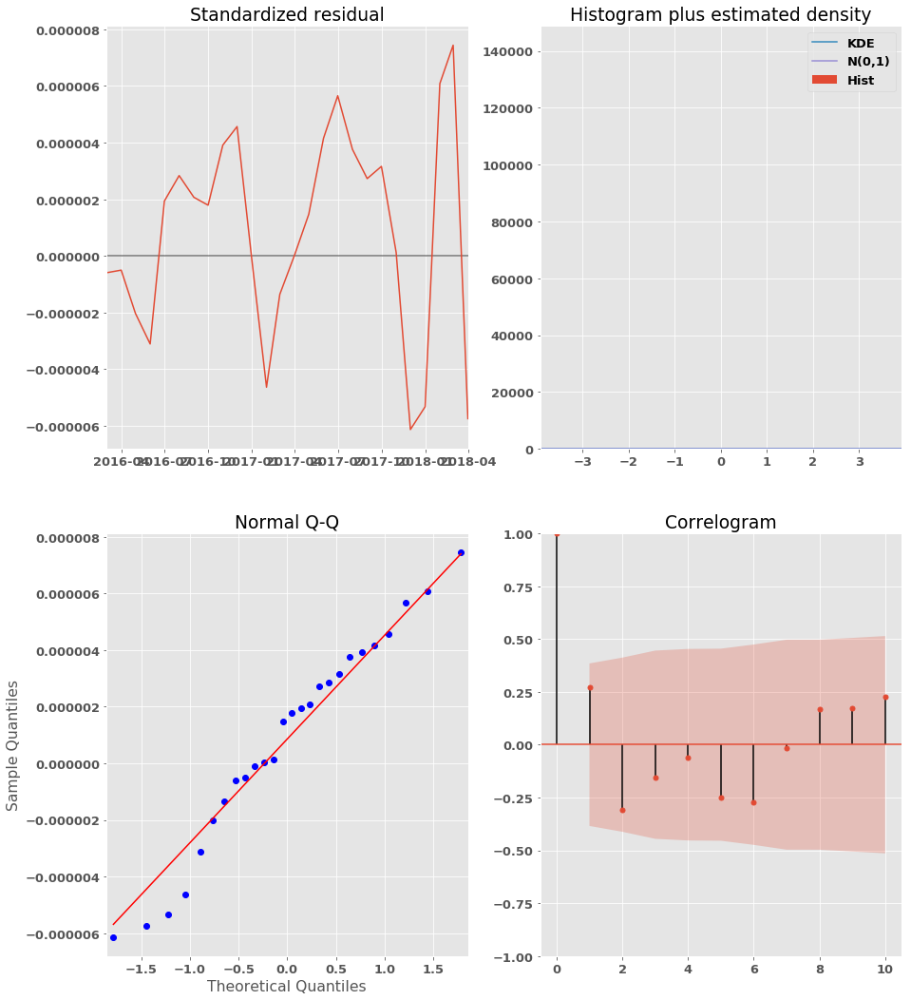



City:Los Altos,CA   Zipcode:94022
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 585.3909524703276 	 AIC: 1166.1070313651646
BIC in minAIC: 589.165242084392 	BIC: 1169.881320979229
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9229         -0       -inf      0.000       0.923       0.923
ma.S.L12   -4.188e+14         -0        inf      0.000   -4.19e+14   -4.19e+14
sigma2      2.167e-11   3.76e-10      0.058      0.954   -7.14e-10    7.58e-10


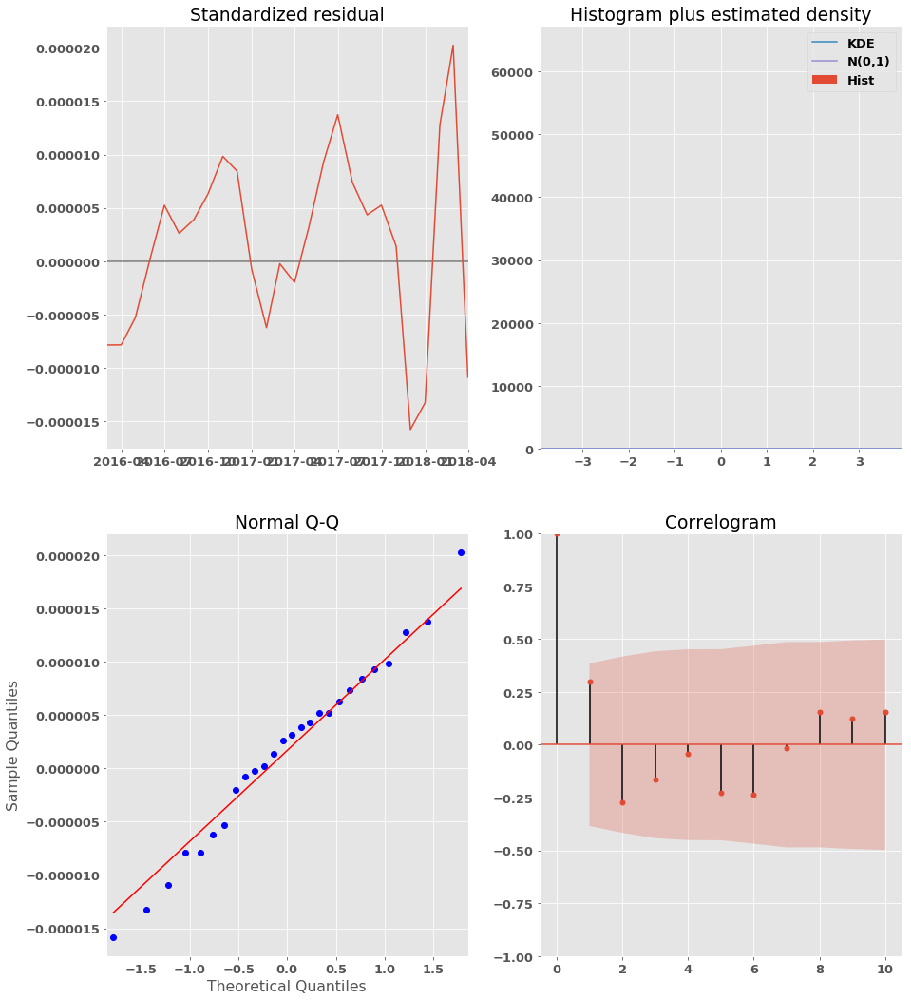



City:San Jose,CA   Zipcode:95135
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 537.7010559421673 	 AIC: 982.3820372119628
BIC in minAIC: 542.7334420942532 	BIC: 987.2575405114356
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7343        nan        nan        nan         nan         nan
ma.L1          0.7576         -0       -inf      0.000       0.758       0.758
ma.S.L12    7.325e+14   9.83e-34   7.45e+47      0.000    7.32e+14    7.32e+14
sigma2      2.506e-14   3.79e-10    6.6e-05      1.000   -7.44e-10    7.44e-10


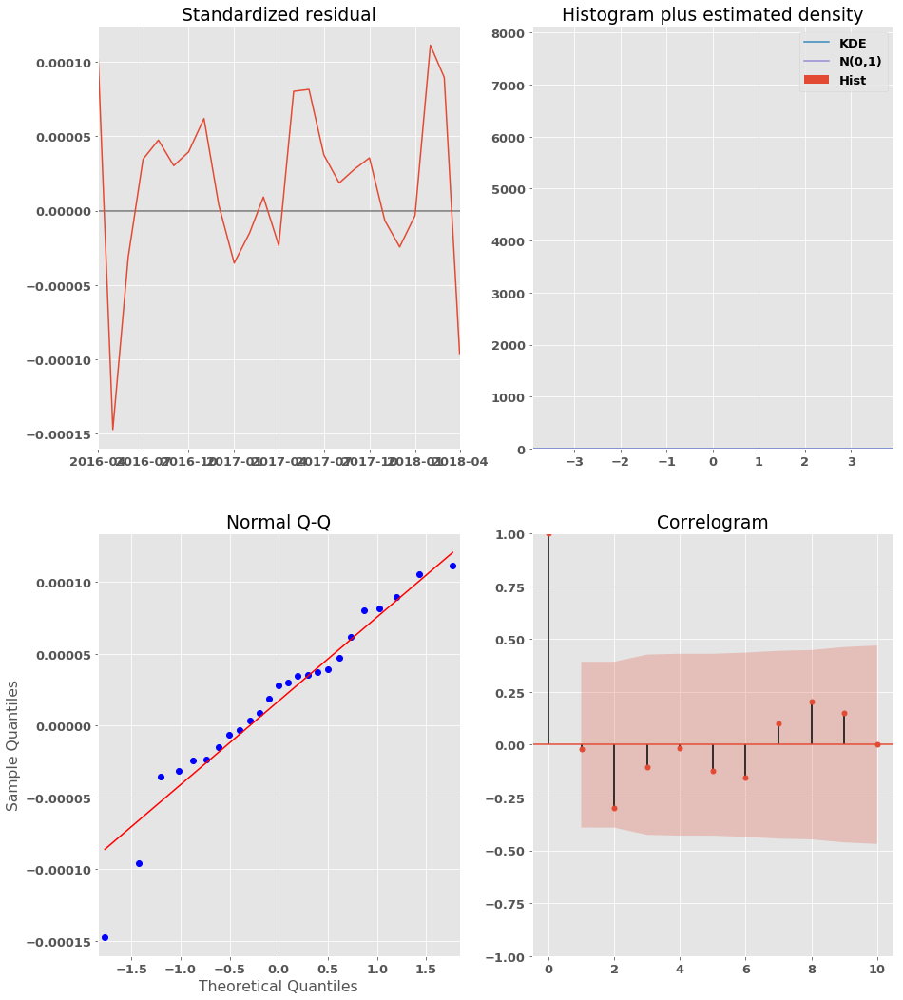



City:Mountain View,CA   Zipcode:94041
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 552.202055617843 	 AIC: 1127.1854132786316
BIC in minAIC: 555.9763452319074 	BIC: 1130.959702892696
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9490        nan        nan        nan         nan         nan
ma.S.L12    3.147e+14         -0       -inf      0.000    3.15e+14    3.15e+14
sigma2      8.586e-12   3.73e-10      0.023      0.982   -7.23e-10    7.41e-10


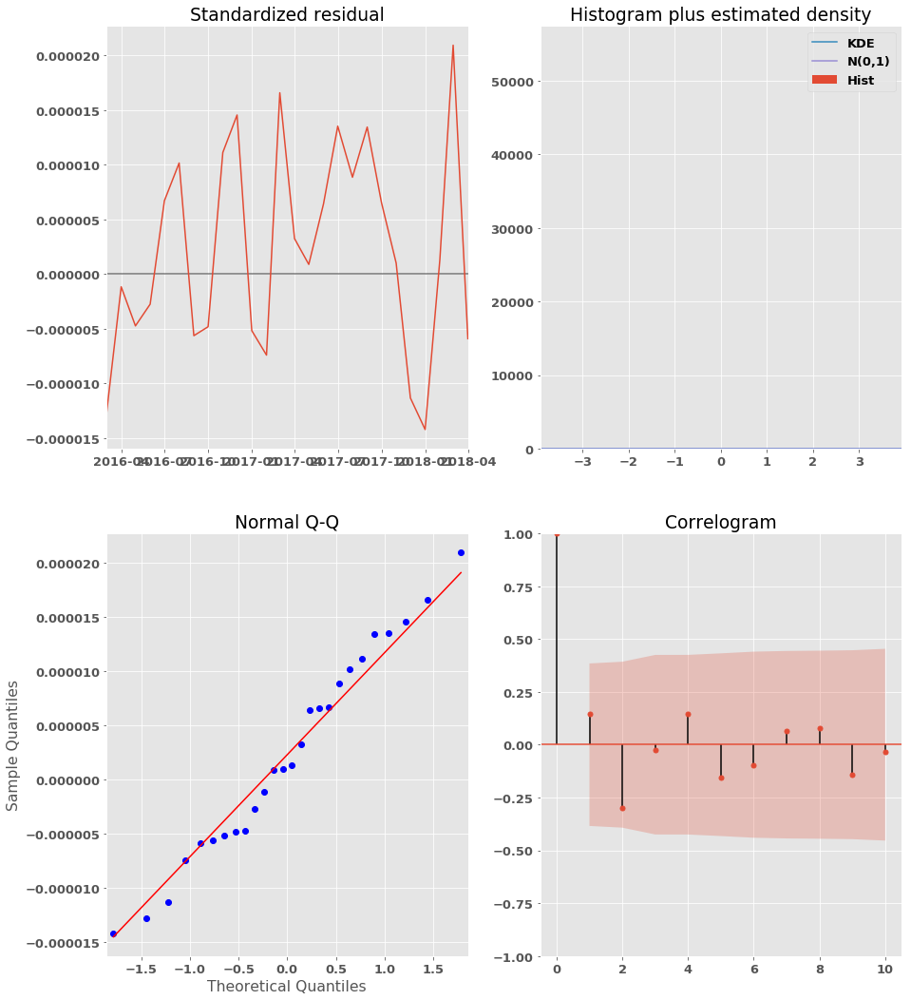



City:Noyack,NY   Zipcode:11963
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 577.4809608442081 	 AIC: 1019.030792814702
BIC in minAIC: 582.513346996294 	BIC: 1023.9062961141748
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3220   1.92e-23   1.68e+22      0.000       0.322       0.322
ma.L1          1.0661   1.83e-22   5.81e+21      0.000       1.066       1.066
ma.S.L12   -1.085e+15   6.63e-34  -1.64e+48      0.000   -1.09e+15   -1.09e+15
sigma2      4.946e-14   3.79e-10      0.000      1.000   -7.44e-10    7.44e-10


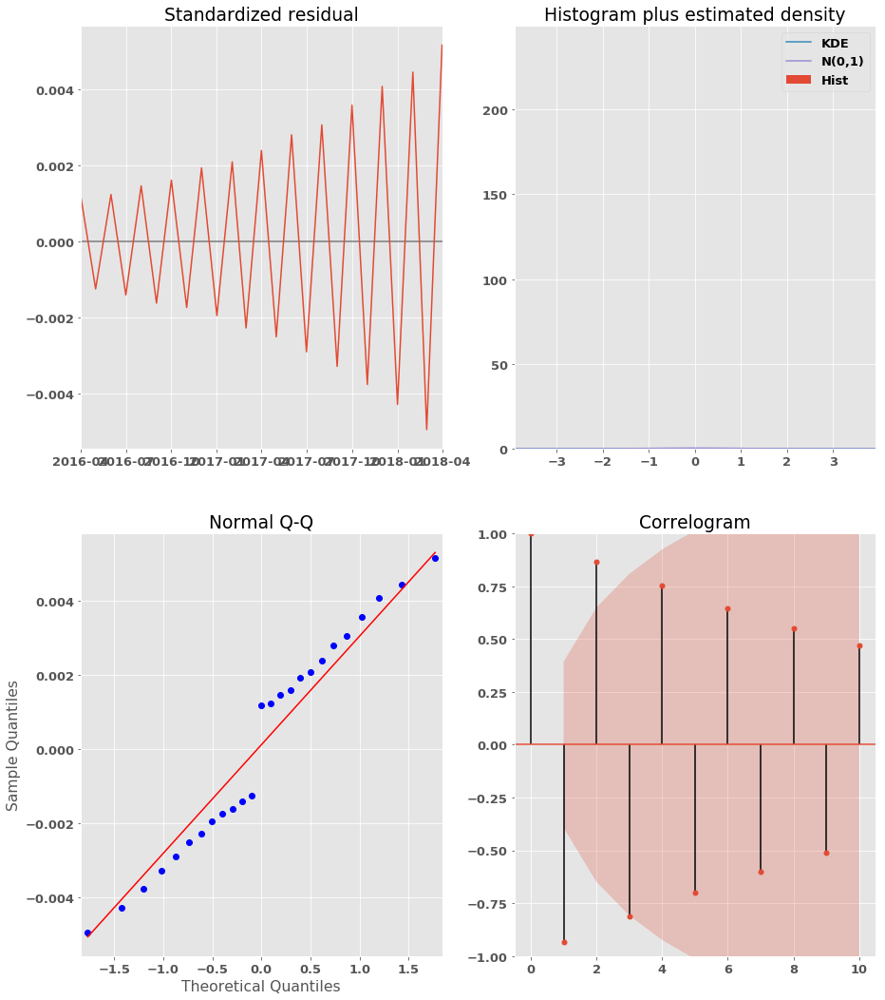



City:Aspen,CO   Zipcode:81611
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 0, 12)
minAIC: 605.8218295257805 	 AIC: 895.0997253268459
BIC in minAIC: 611.9162086501215 	BIC: 899.9324790647786
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7928      0.090      8.839      0.000       0.617       0.969
ma.L1          0.0765      0.099      0.773      0.439      -0.117       0.270
sigma2      1.278e+09    1.2e-11   1.07e+20      0.000    1.28e+09    1.28e+09


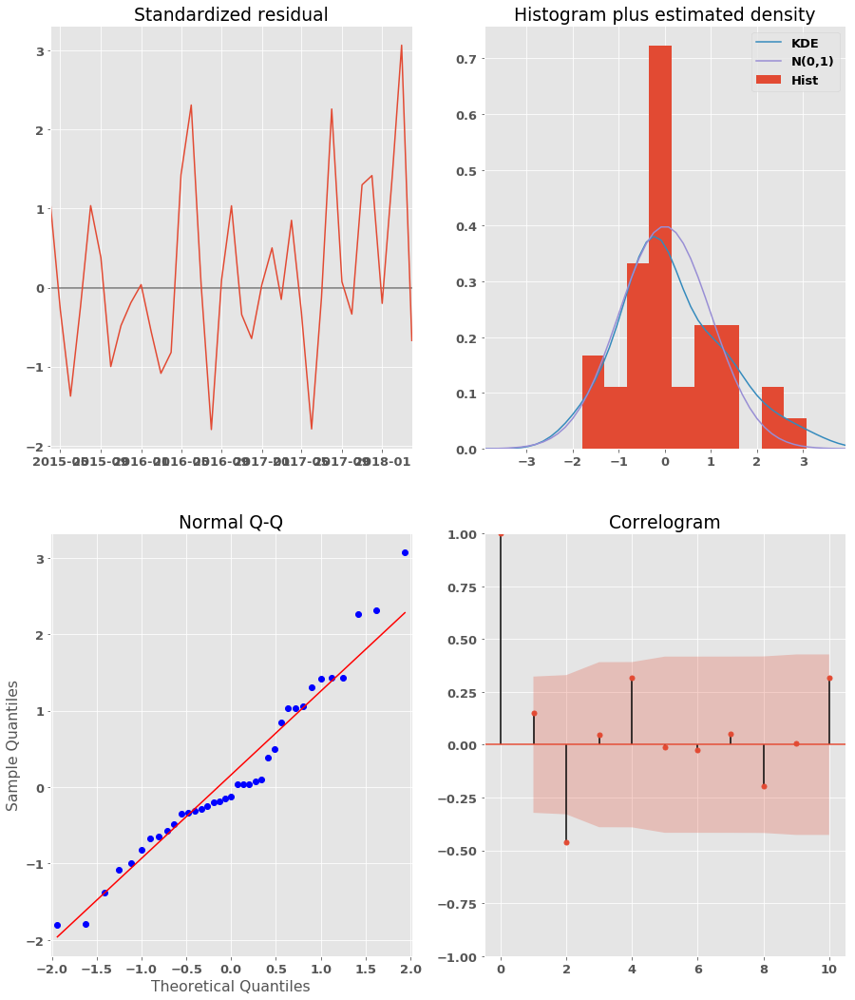



City:San Jose,CA   Zipcode:95130
Non-seasonal parameters (p,d,q): (1, 1, 0)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 542.9371256365524 	 AIC: 1184.6947706250166
BIC in minAIC: 546.7114152506168 	BIC: 1188.469060239081
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9352         -0       -inf      0.000       0.935       0.935
ma.S.L12    -8.09e+14         -0        inf      0.000   -8.09e+14   -8.09e+14
sigma2      1.187e-11   3.74e-10      0.032      0.975   -7.21e-10    7.45e-10


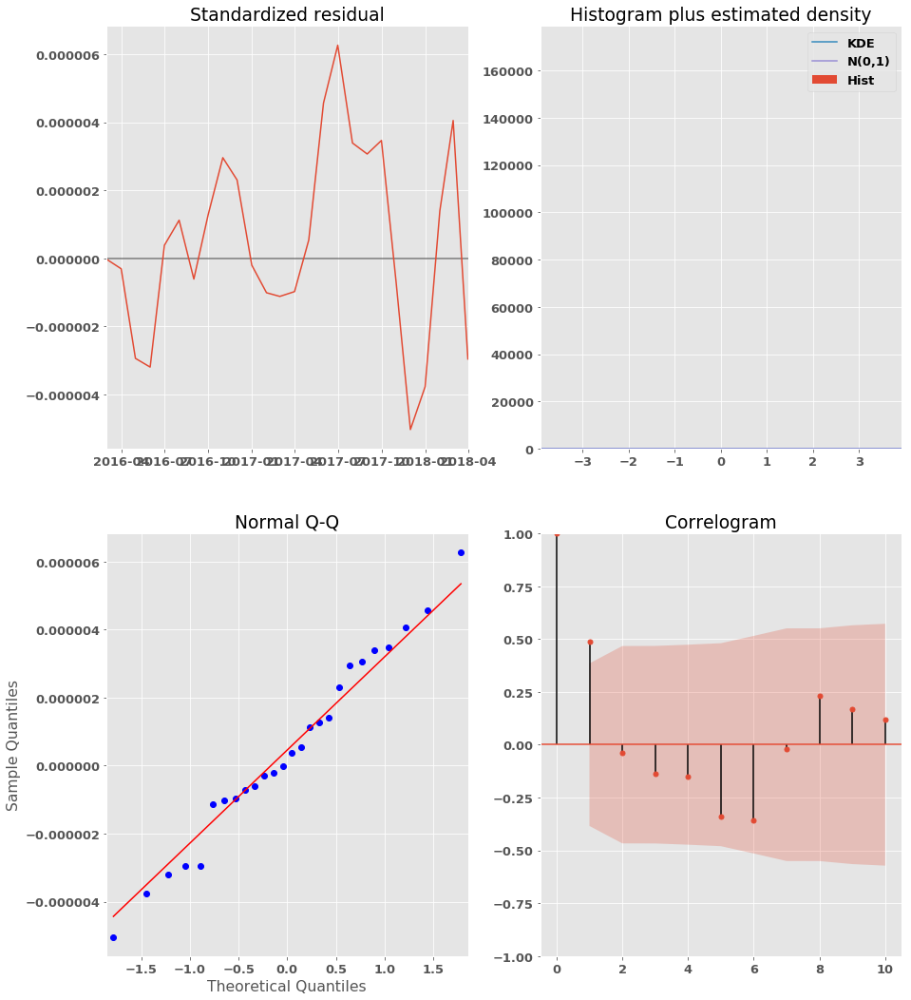



City:Bridgehampton,NY   Zipcode:11932
Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 1, 1, 12)
minAIC: 569.0746433838538 	 AIC: 913.5571139364847
BIC in minAIC: 574.1070295359397 	BIC: 918.4326172359575
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5726   3.74e-24   1.53e+23      0.000       0.573       0.573
ma.L1          0.9133   3.92e-23   2.33e+22      0.000       0.913       0.913
ma.S.L12   -5.817e+14   1.24e-33   -4.7e+47      0.000   -5.82e+14   -5.82e+14
sigma2      2.532e-15   3.79e-10   6.67e-06      1.000   -7.44e-10    7.44e-10


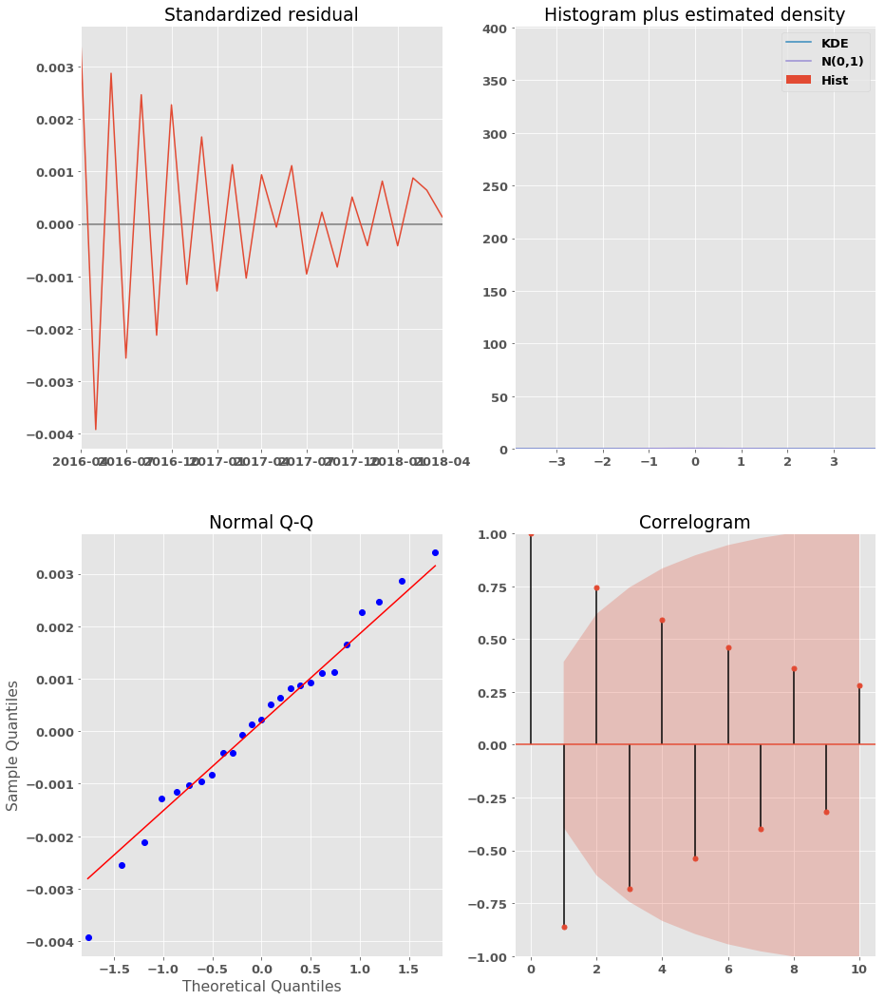

In [35]:
# plug the optimal parameter values into a new SARIMAX model.

for i in seasonal.keys():
    series = timeseries[i][1]
    ARIMA_MODEL = sm.tsa.statespace.SARIMAX(series,
                                    order=minAICs[i]['pdq'],
                                    seasonal_order= seasonal[i]['pdqs'],
                                    enforce_stationarity=False,
                                    enforce_invertibility=False)
    # Fit the model and print results
    output = ARIMA_MODEL.fit()
    
    print(titles[i])
    print('Non-seasonal parameters (p,d,q):', minAICs[i]['pdq'])
    print('Seasonal parameters and periodicity (P,D,Q,s):', seasonal[i]['pdqs'])
#     print('AIC:', minAICs[i]['aic'])
#     print('BIC:', minAICs[i]['bic'])
    print('minAIC:',minAICs[i]['aic'], '\t AIC:', output.aic)
    print('BIC in minAIC:',minAICs[i]['bic'], '\tBIC:', output.bic)
    print(output.summary().tables[1])
    output.plot_diagnostics(figsize=(15,18))
    plt.show()
#     outputs.append(output)
    print('\n')



The results above showed that, based on AIC, BIC, and the histograms, the models did not improved so we keep the previous models for predictions.  

# Validating the Model

Let us check how well our model predicts. 
We compare predicted values to real values of the time series. The predictions are plotted with the real values and the accuracy is quantified with the root squared mean error (RSME).  

## One-step Ahead Forecasting

In [36]:
# Get predictions starting from 01-01-1998 and calculate confidence intervals.
predictions =[]
for output in outputs:
    prediction = output.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic = False)
    pred_conf = prediction.conf_int()
    predictions.append((prediction,pred_conf))

City:Cupertino,CA   Zipcode:95014 

The Root Mean Squared Error of our forecasts is 9522.51
The Root Mean Squared Error of our forcase is 0.434% of mean housing price from 2017.


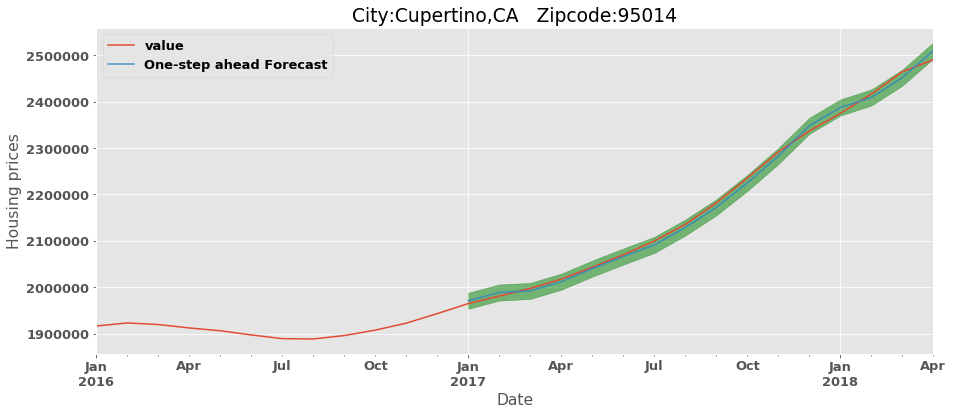

City:Sunnyvale,CA   Zipcode:94087 

The Root Mean Squared Error of our forecasts is 8373.67
The Root Mean Squared Error of our forcase is 0.427% of mean housing price from 2017.


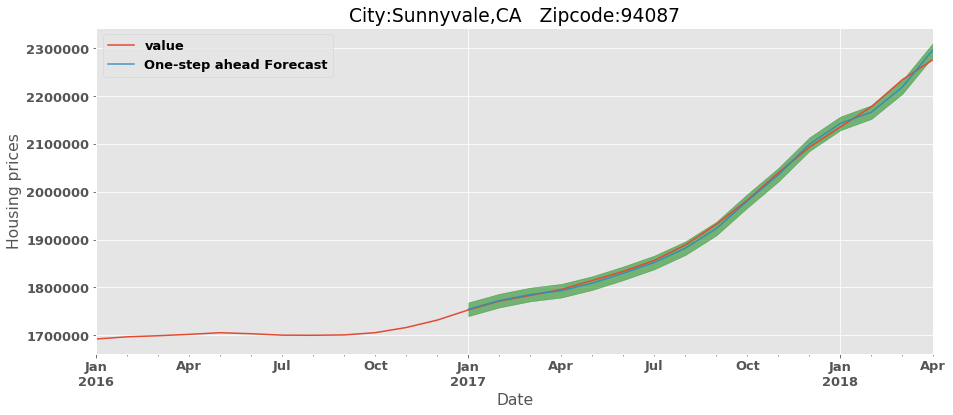

City:Sunnyvale,CA   Zipcode:94086 

The Root Mean Squared Error of our forecasts is 8931.79
The Root Mean Squared Error of our forcase is 0.541% of mean housing price from 2017.


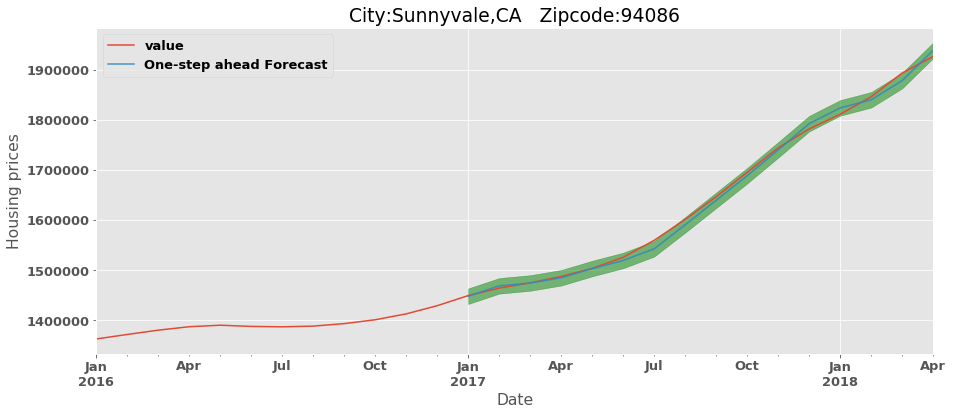

City:San Mateo,CA   Zipcode:94403 

The Root Mean Squared Error of our forecasts is 6159.57
The Root Mean Squared Error of our forcase is 0.411% of mean housing price from 2017.


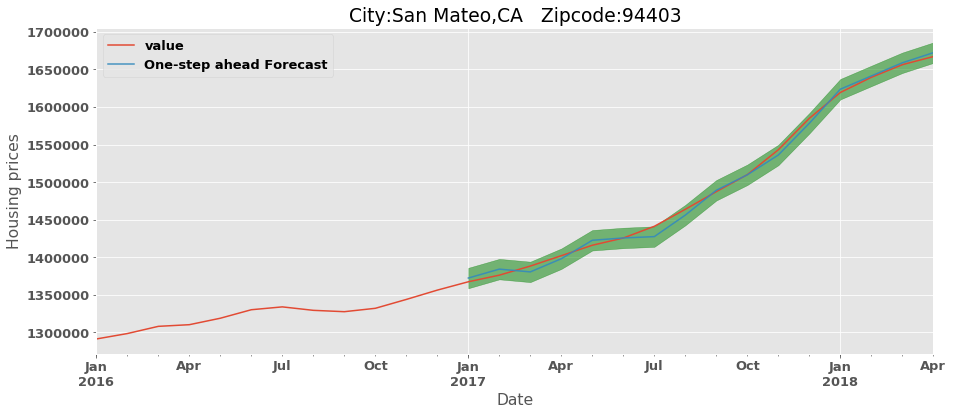

City:Menlo Park,CA   Zipcode:94025 

The Root Mean Squared Error of our forecasts is 10443.36
The Root Mean Squared Error of our forcase is 0.456% of mean housing price from 2017.


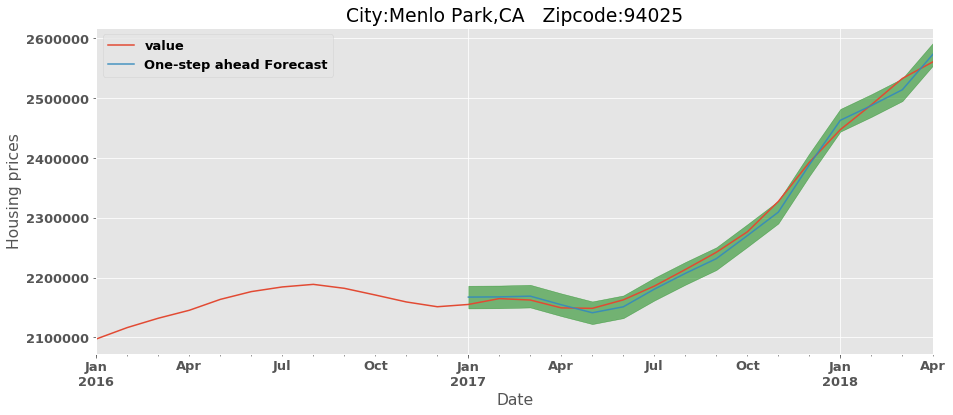

City:Mountain View,CA   Zipcode:94040 

The Root Mean Squared Error of our forecasts is 13403.53
The Root Mean Squared Error of our forcase is 0.539% of mean housing price from 2017.


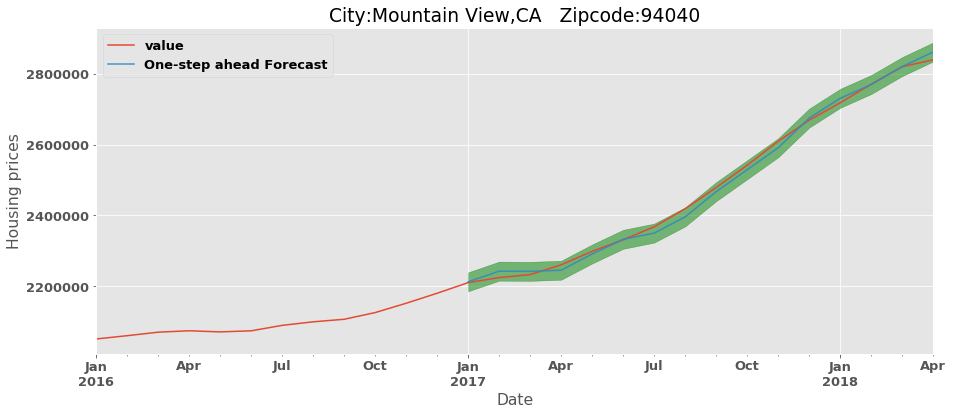

City:Foster City,CA   Zipcode:94404 

The Root Mean Squared Error of our forecasts is 6231.86
The Root Mean Squared Error of our forcase is 0.385% of mean housing price from 2017.


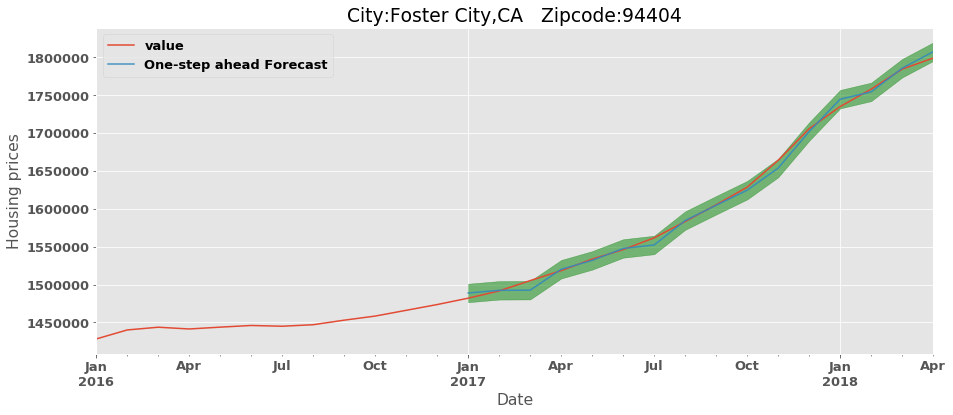

City:San Jose,CA   Zipcode:95129 

The Root Mean Squared Error of our forecasts is 12248.69
The Root Mean Squared Error of our forcase is 0.67% of mean housing price from 2017.


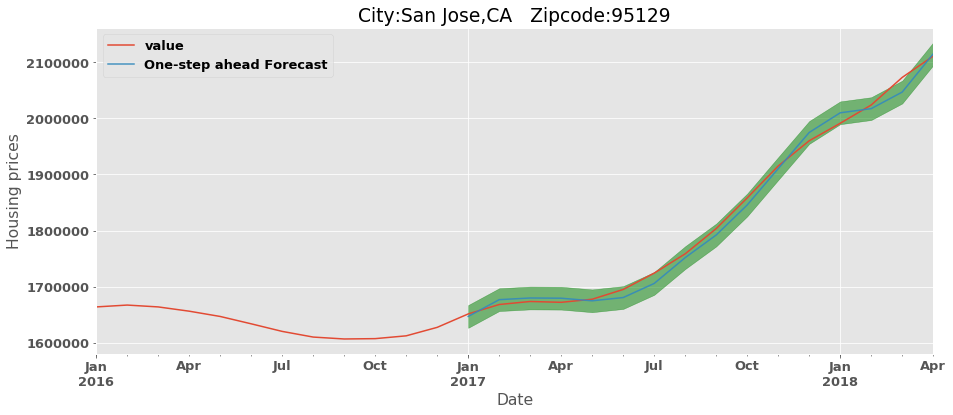

City:Redwood City,CA   Zipcode:94061 

The Root Mean Squared Error of our forecasts is 8996.06
The Root Mean Squared Error of our forcase is 0.583% of mean housing price from 2017.


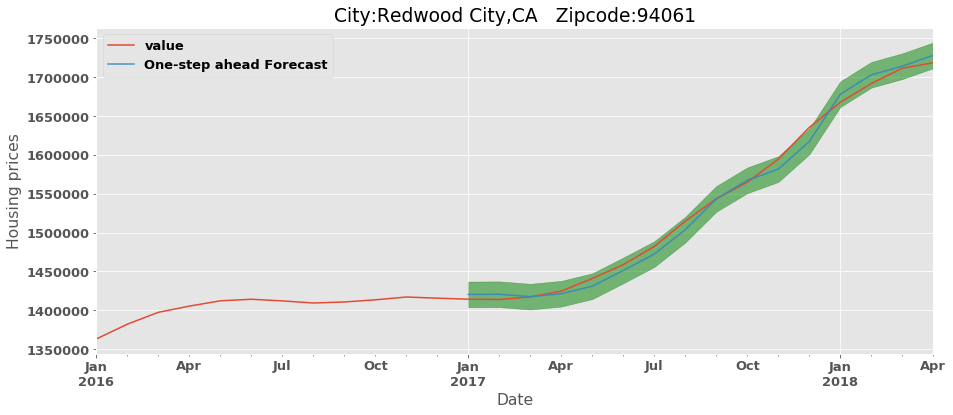

City:Mountain View,CA   Zipcode:94043 

The Root Mean Squared Error of our forecasts is 11619.39
The Root Mean Squared Error of our forcase is 0.652% of mean housing price from 2017.


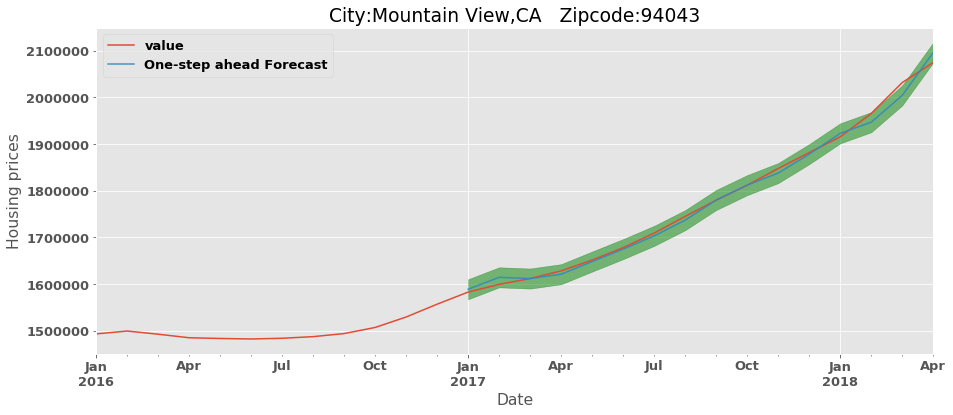

City:San Jose,CA   Zipcode:95120 

The Root Mean Squared Error of our forecasts is 6118.9
The Root Mean Squared Error of our forcase is 0.409% of mean housing price from 2017.


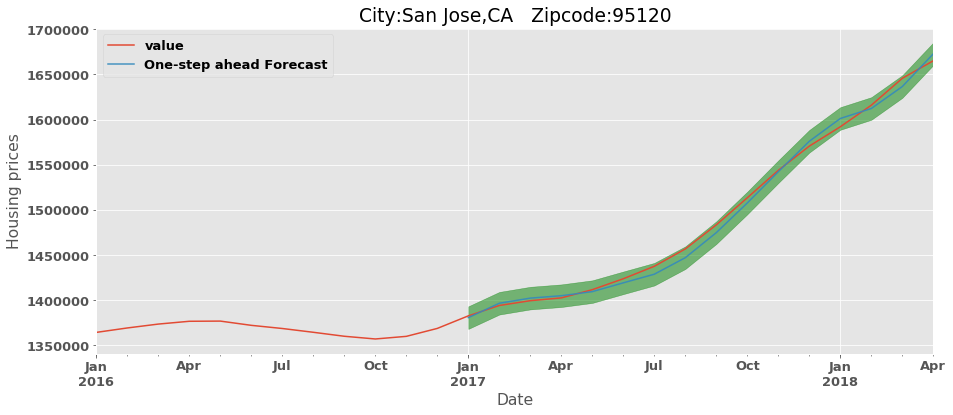

City:Palo Alto,CA   Zipcode:94306 

The Root Mean Squared Error of our forecasts is 11425.16
The Root Mean Squared Error of our forcase is 0.39% of mean housing price from 2017.


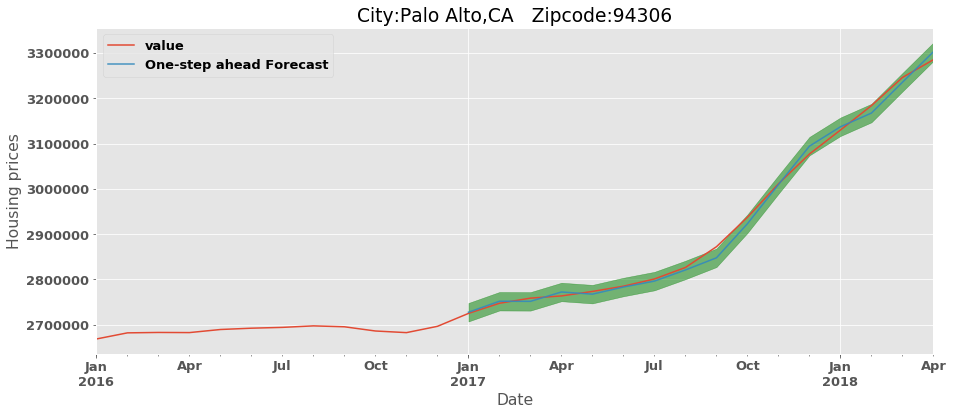

City:Redwood City,CA   Zipcode:94062 

The Root Mean Squared Error of our forecasts is 8939.51
The Root Mean Squared Error of our forcase is 0.457% of mean housing price from 2017.


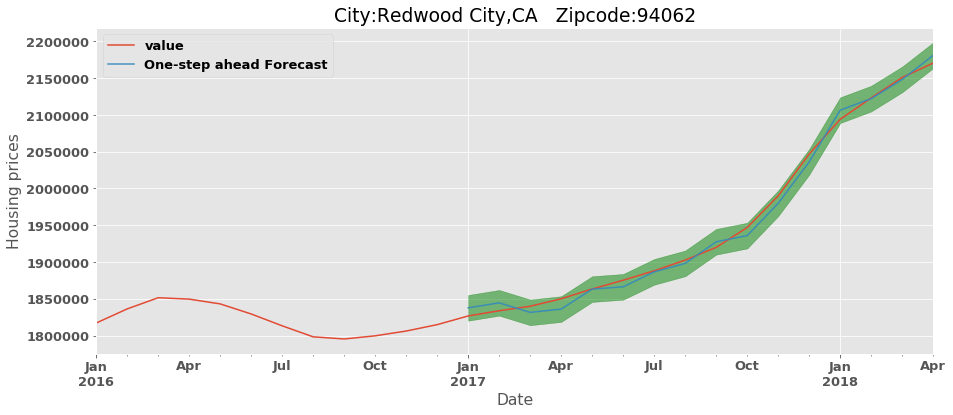

City:Los Altos,CA   Zipcode:94024 

The Root Mean Squared Error of our forecasts is 14024.62
The Root Mean Squared Error of our forcase is 0.441% of mean housing price from 2017.


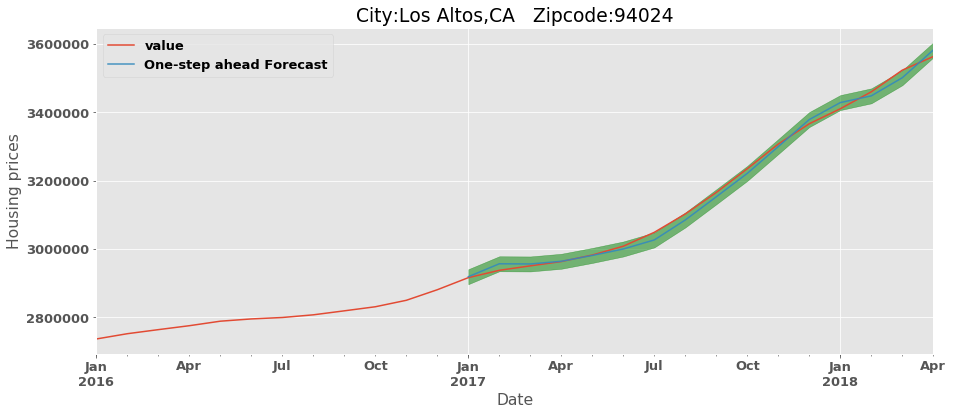

City:Los Altos,CA   Zipcode:94022 

The Root Mean Squared Error of our forecasts is 19473.6
The Root Mean Squared Error of our forcase is 0.5% of mean housing price from 2017.


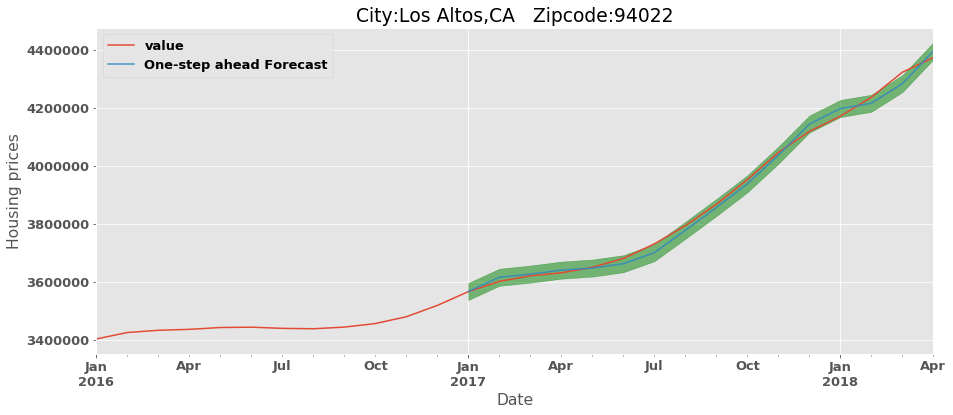

City:San Jose,CA   Zipcode:95135 

The Root Mean Squared Error of our forecasts is 6440.77
The Root Mean Squared Error of our forcase is 0.452% of mean housing price from 2017.


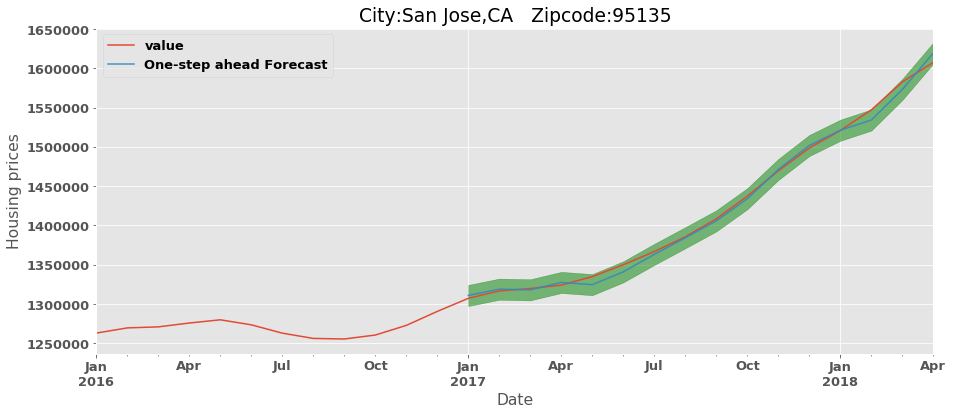

City:Mountain View,CA   Zipcode:94041 

The Root Mean Squared Error of our forecasts is 9522.04
The Root Mean Squared Error of our forcase is 0.489% of mean housing price from 2017.


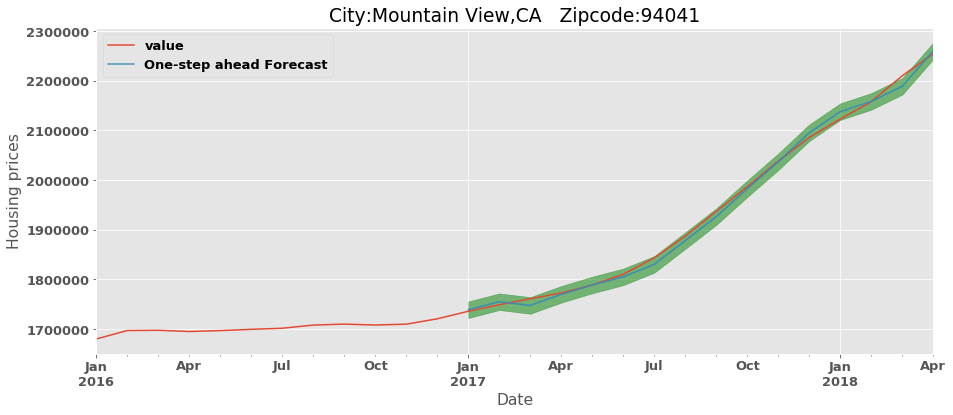

City:Noyack,NY   Zipcode:11963 

The Root Mean Squared Error of our forecasts is 13981.94
The Root Mean Squared Error of our forcase is 0.882% of mean housing price from 2017.


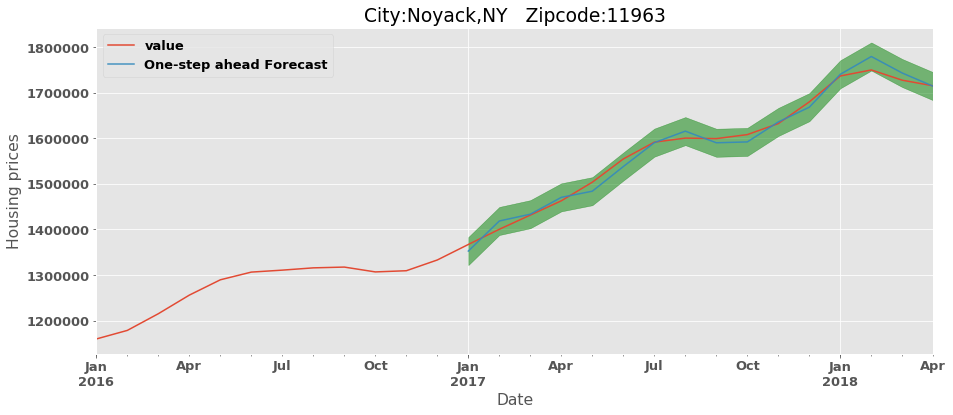

City:Los Gatos,CA   Zipcode:95030 

The Root Mean Squared Error of our forecasts is 14878.01
The Root Mean Squared Error of our forcase is 0.54% of mean housing price from 2017.


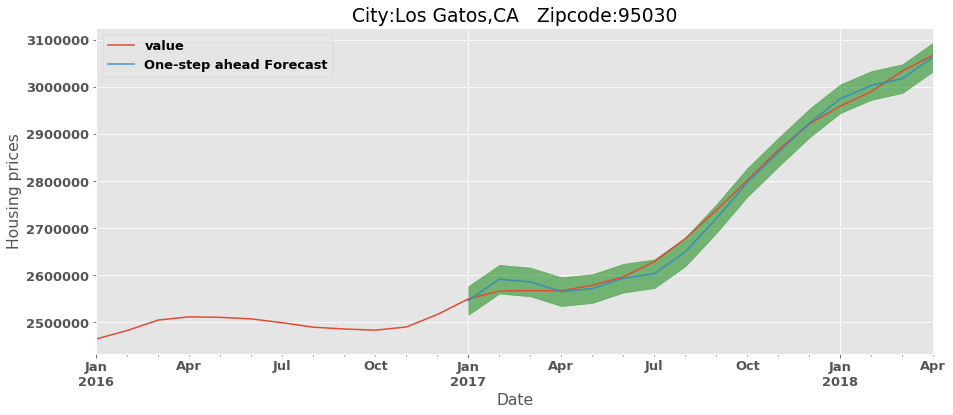

City:Aspen,CO   Zipcode:81611 

The Root Mean Squared Error of our forecasts is 39935.98
The Root Mean Squared Error of our forcase is 0.948% of mean housing price from 2017.


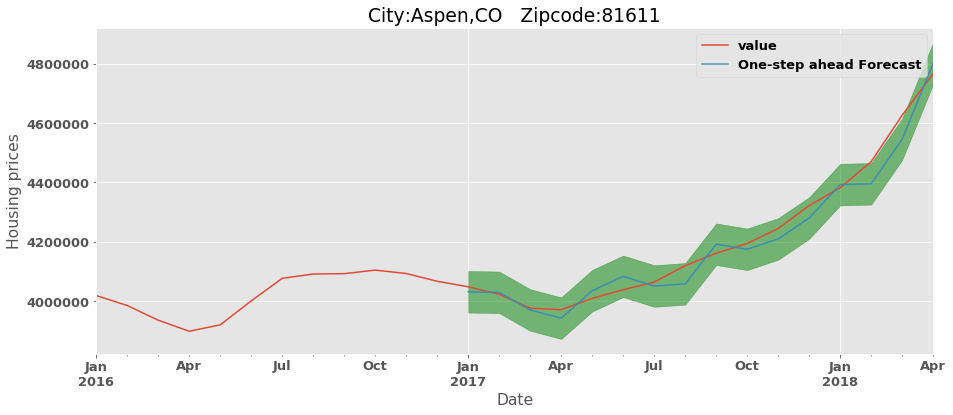

City:San Jose,CA   Zipcode:95130 

The Root Mean Squared Error of our forecasts is 8608.77
The Root Mean Squared Error of our forcase is 0.62% of mean housing price from 2017.


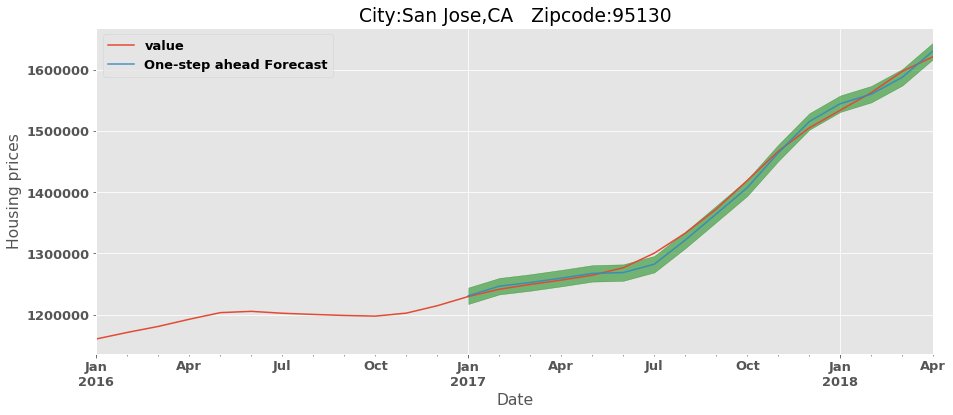

City:Avalon,NJ   Zipcode:8202 

The Root Mean Squared Error of our forecasts is 11019.69
The Root Mean Squared Error of our forcase is 0.73% of mean housing price from 2017.


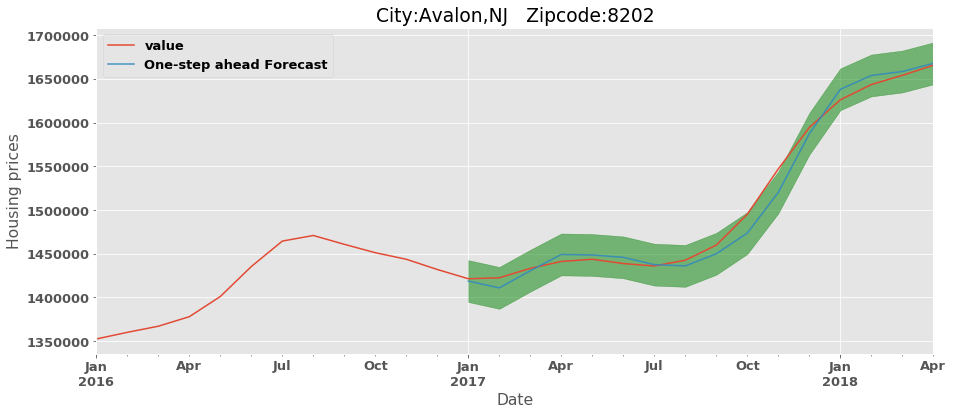

City:Bridgehampton,NY   Zipcode:11932 

The Root Mean Squared Error of our forecasts is 12532.92
The Root Mean Squared Error of our forcase is 0.547% of mean housing price from 2017.


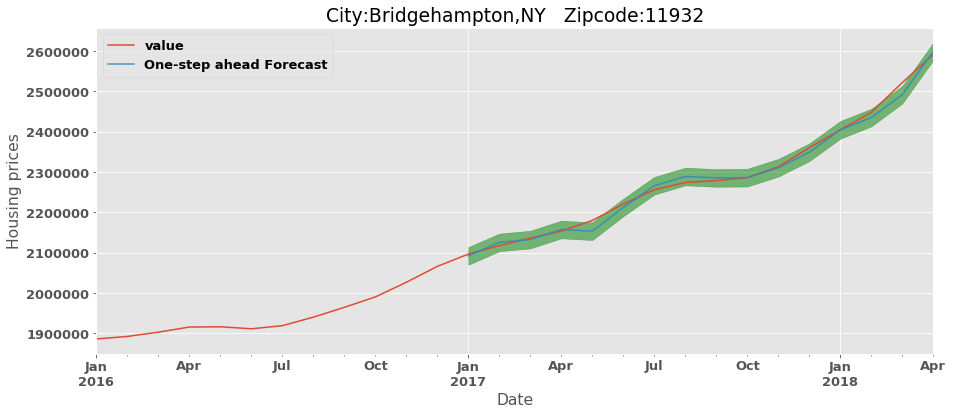

In [37]:
for i, prediction in enumerate(predictions): 
    series = timeseries[i][1]
    
    
    # Get the Real and predicted values
    series_forecasted = prediction[0].predicted_mean
    series_truth = series['2017-01-01':].squeeze()

    # series_truth.squeeze()
    # Compute the mean square error
    rmse = np.sqrt(((series_forecasted-series_truth)**2).mean())

    print(titles[i],'\n')
    print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse, 2)))
    print('The root mean squared error'.title()
          + ' of our forcase is '
          +'{}% of mean housing price from 2017.'.format(round(rmse/series_truth.mean()*100,3)))

    
    # Plot real vs predicted values along with confidence interval
    rcParams['figure.figsize']=15,6
    # Plot observed values
    ax = series['2016':].plot(label ='observed')
    # Plot predicted values
    prediction[0].predicted_mean.plot(ax= ax, label ='One-step ahead Forecast', alpha =0.9)
    # Plot the range for confidence intervals
    ax.fill_between(prediction[1].index,
                   prediction[1].iloc[:,0],
                   prediction[1].iloc[:,1], color='g', alpha=0.5)
    # Set axes labels
    ax.set_xlabel('Date')
    ax.set_ylabel('Housing prices')
    ax.set_title(titles[i])
    plt.legend()

    plt.show()


The root mean squared error(RMSE) seems large but it is not when it is compared to the average house price from 2017 to 2018.

## Dynamic Forecasting

Before forecasting, let us check how well dynamic prediction works with the models.  

In [38]:
# Get dynamic predictions with confidence intervals as above.
pred_dynamics =[]
for output in outputs:
    pred_dynamic = output.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=True, full_results=True)
    pred_dynamic_conf = pred_dynamic.conf_int()
    pred_dynamics.append((pred_dynamic, pred_dynamic_conf))

City:Cupertino,CA   Zipcode:95014 

The Root Mean Squared Error of our forecasts is 113069.36
The Root Mean Squared Errorof our forcase is5.154% of mean housing price from 2017.


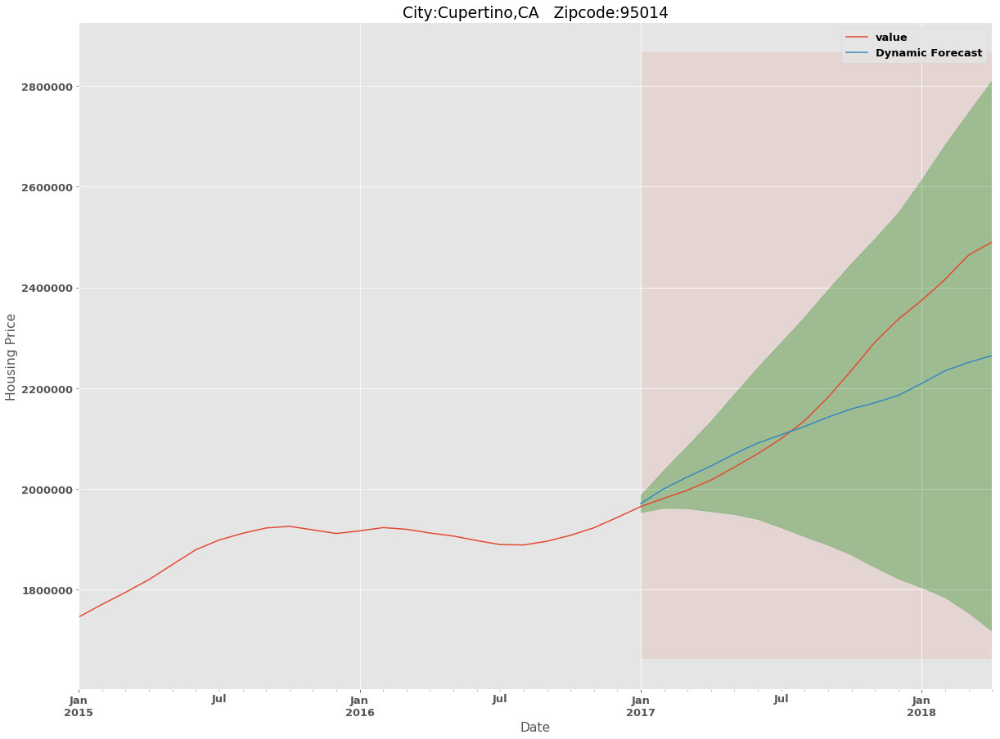

City:Sunnyvale,CA   Zipcode:94087 

The Root Mean Squared Error of our forecasts is 145360.02
The Root Mean Squared Errorof our forcase is7.415% of mean housing price from 2017.


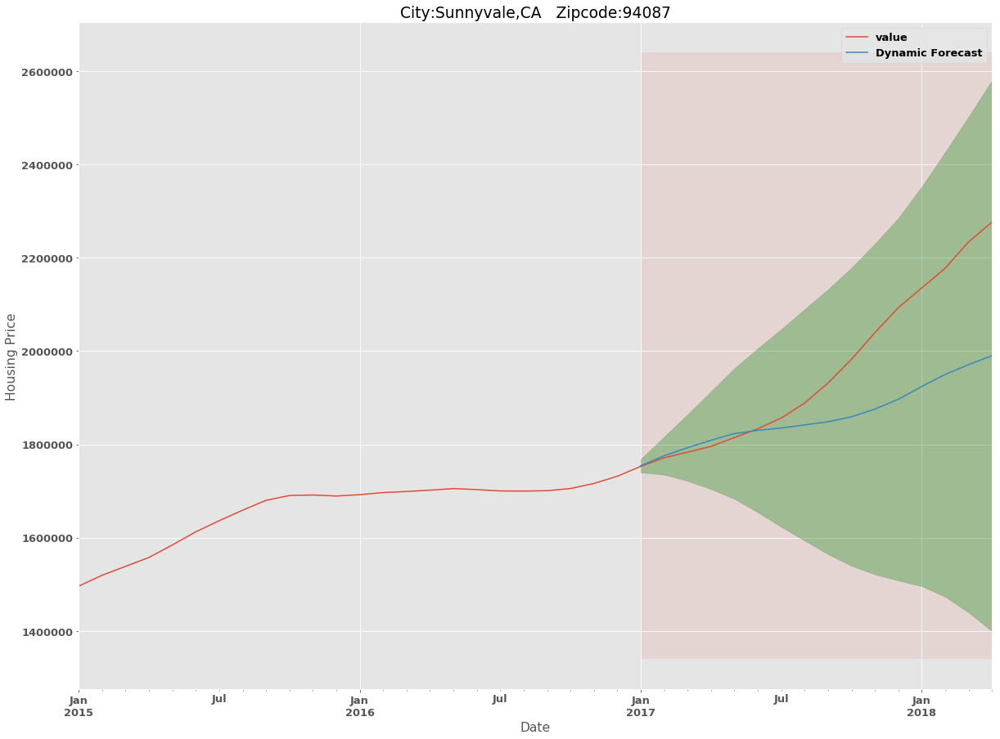

City:Sunnyvale,CA   Zipcode:94086 

The Root Mean Squared Error of our forecasts is 168224.78
The Root Mean Squared Errorof our forcase is10.192% of mean housing price from 2017.


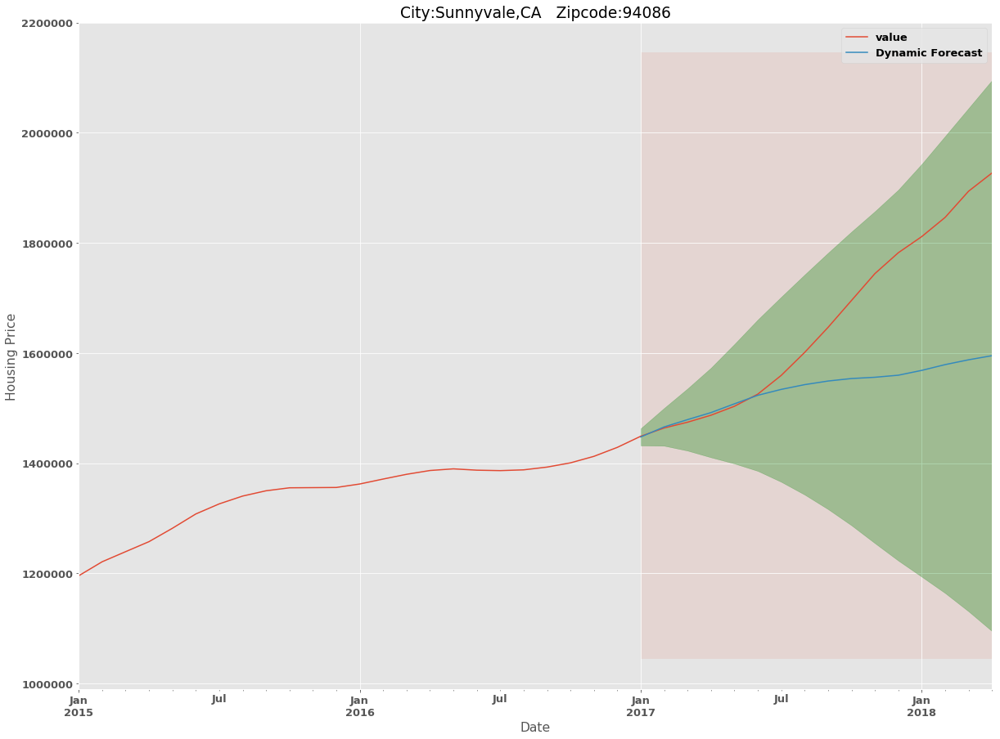

City:San Mateo,CA   Zipcode:94403 

The Root Mean Squared Error of our forecasts is 56128.84
The Root Mean Squared Errorof our forcase is3.744% of mean housing price from 2017.


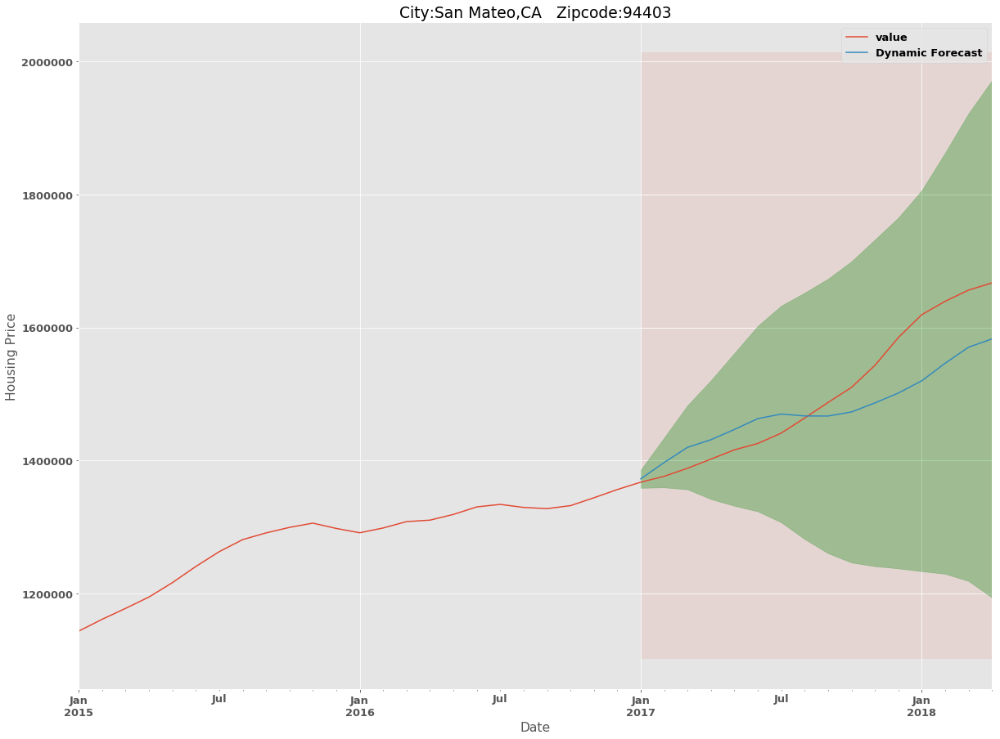

City:Menlo Park,CA   Zipcode:94025 

The Root Mean Squared Error of our forecasts is 105188.18
The Root Mean Squared Errorof our forcase is4.597% of mean housing price from 2017.


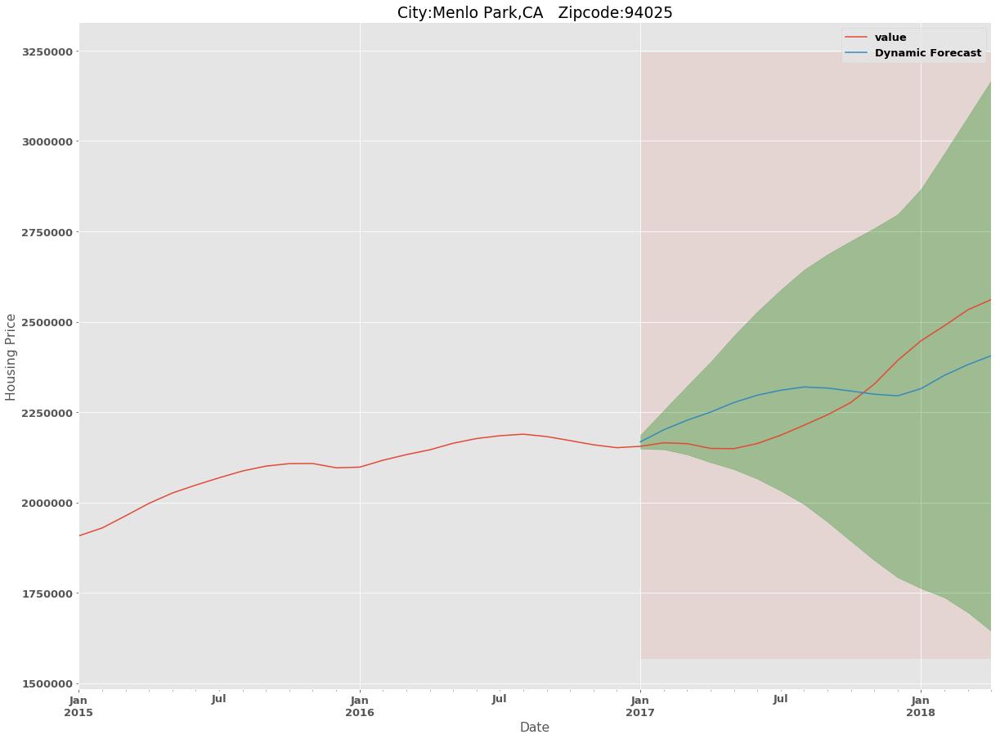

City:Mountain View,CA   Zipcode:94040 

The Root Mean Squared Error of our forecasts is 172080.37
The Root Mean Squared Errorof our forcase is6.92% of mean housing price from 2017.


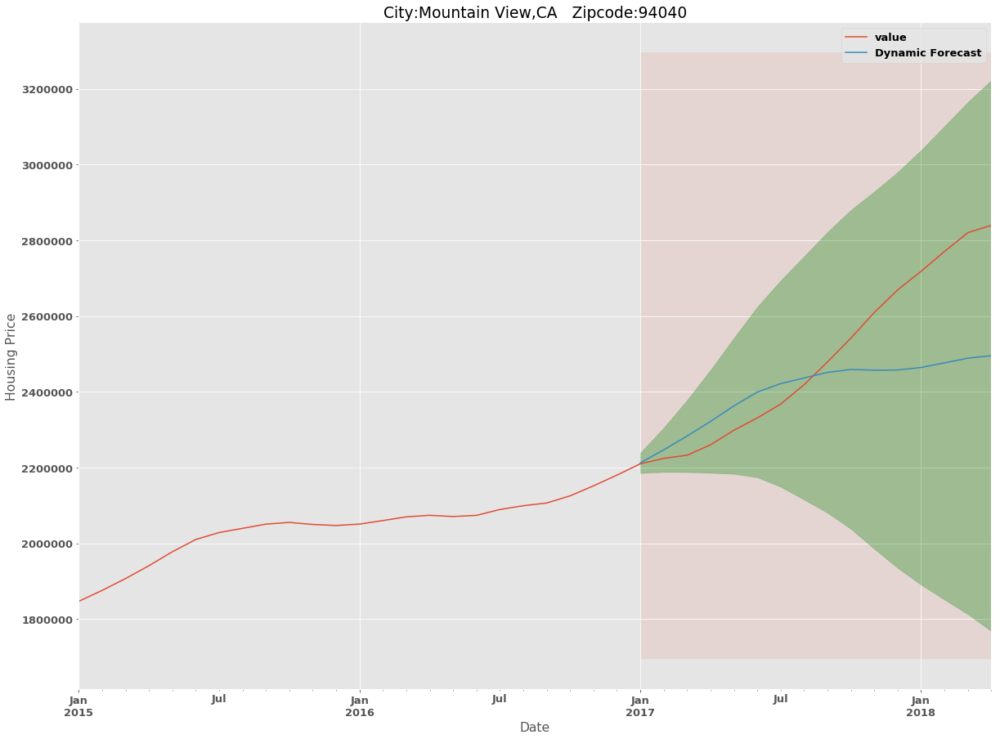

City:Foster City,CA   Zipcode:94404 

The Root Mean Squared Error of our forecasts is 89222.49
The Root Mean Squared Errorof our forcase is5.512% of mean housing price from 2017.


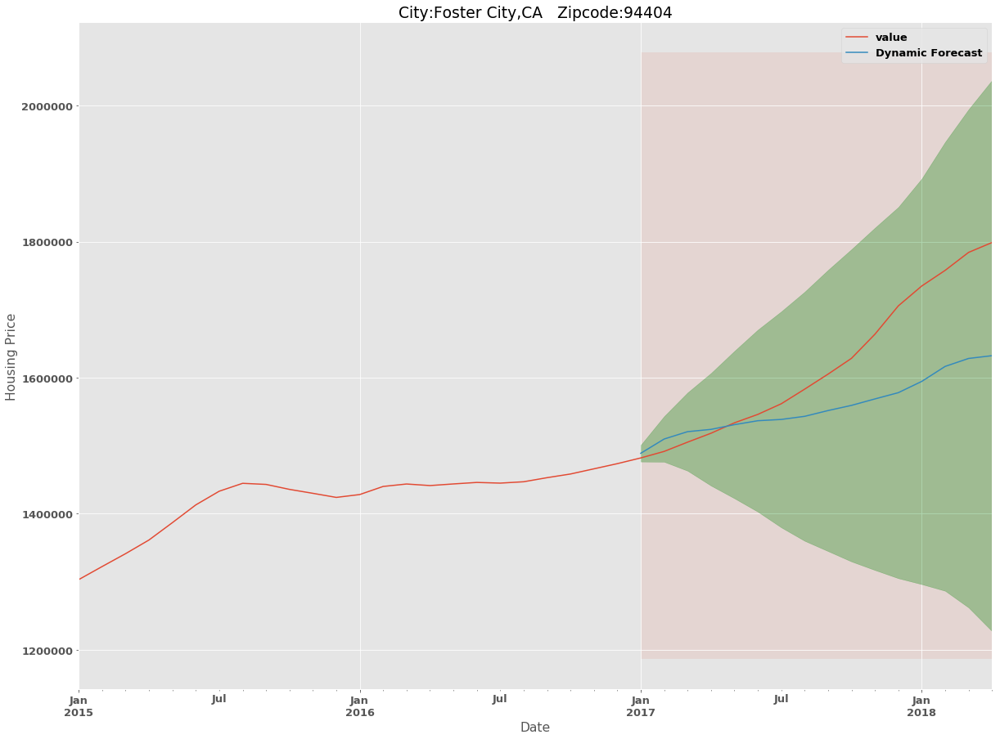

City:San Jose,CA   Zipcode:95129 

The Root Mean Squared Error of our forecasts is 132331.64
The Root Mean Squared Errorof our forcase is7.237% of mean housing price from 2017.


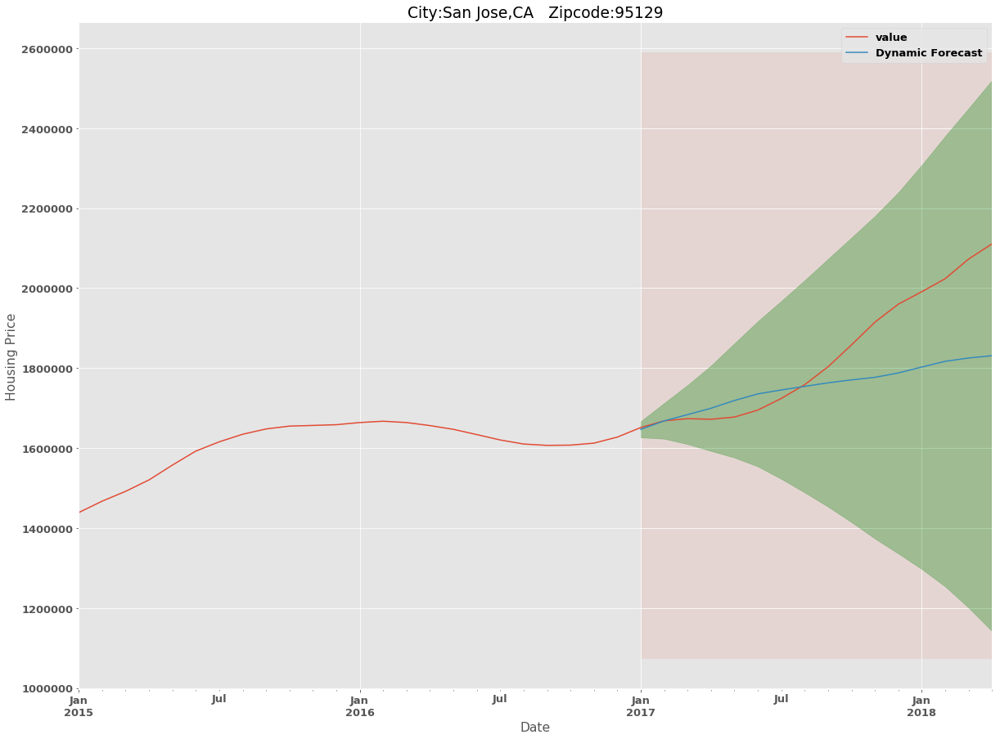

City:Redwood City,CA   Zipcode:94061 

The Root Mean Squared Error of our forecasts is 109319.66
The Root Mean Squared Errorof our forcase is7.083% of mean housing price from 2017.


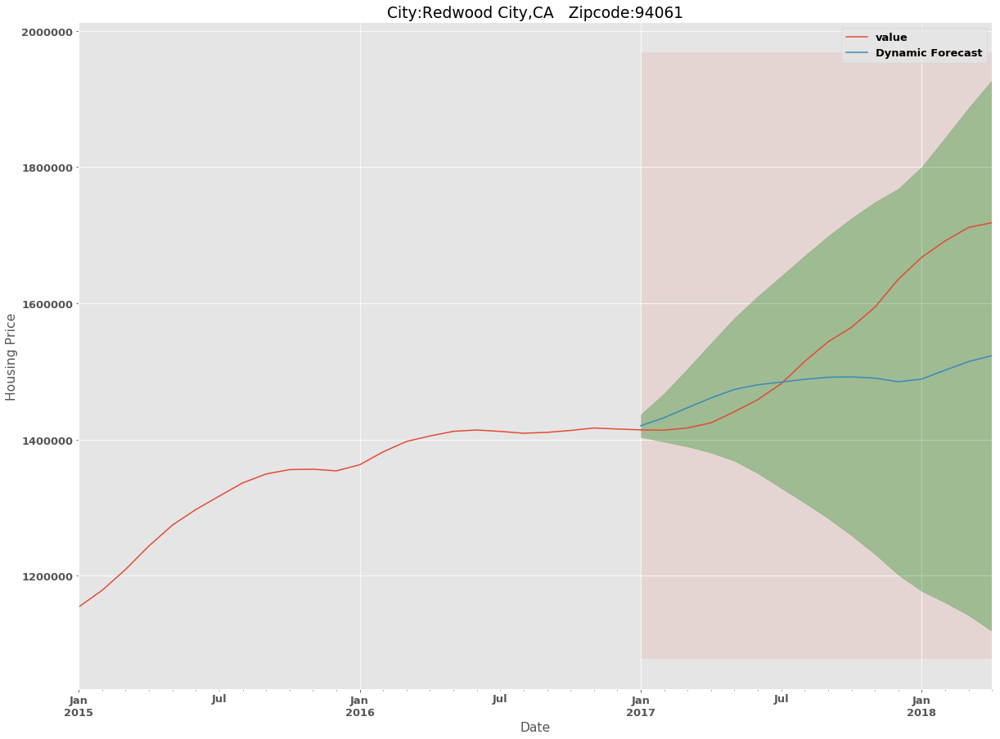

City:Mountain View,CA   Zipcode:94043 

The Root Mean Squared Error of our forecasts is 54193.69
The Root Mean Squared Errorof our forcase is3.041% of mean housing price from 2017.


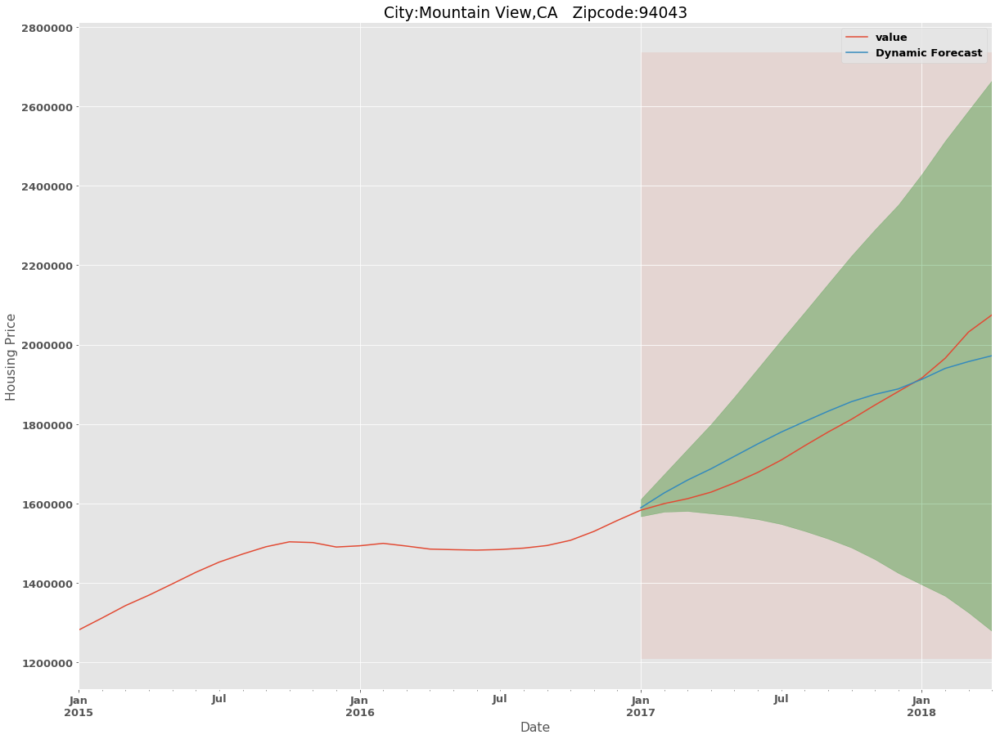

City:San Jose,CA   Zipcode:95120 

The Root Mean Squared Error of our forecasts is 103612.12
The Root Mean Squared Errorof our forcase is6.925% of mean housing price from 2017.


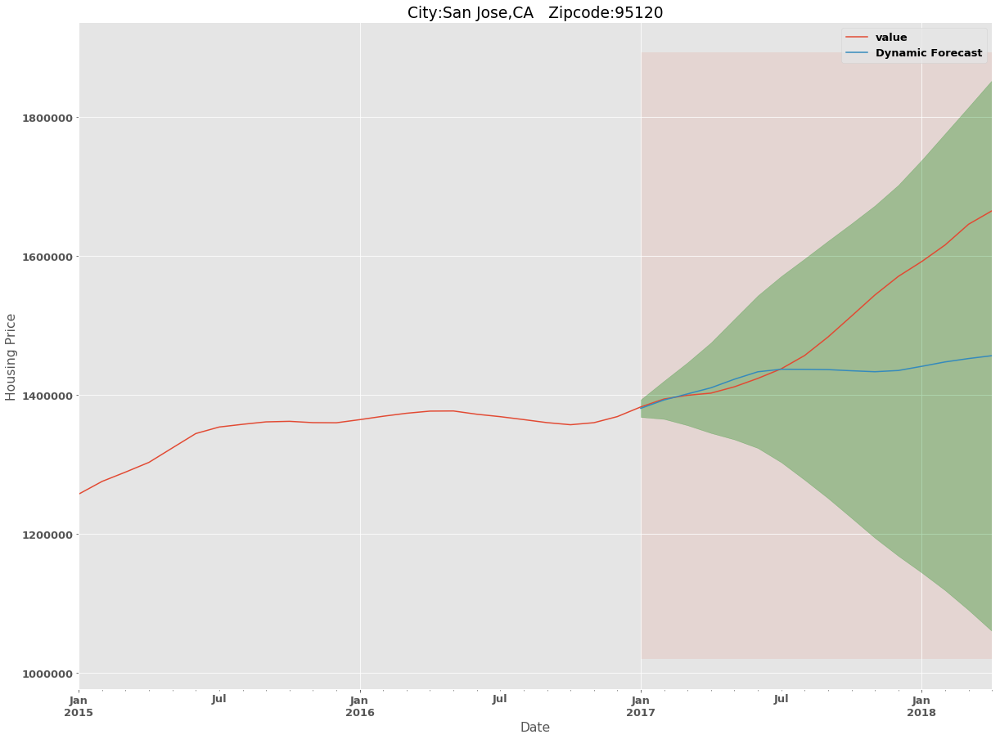

City:Palo Alto,CA   Zipcode:94306 

The Root Mean Squared Error of our forecasts is 162841.6
The Root Mean Squared Errorof our forcase is5.553% of mean housing price from 2017.


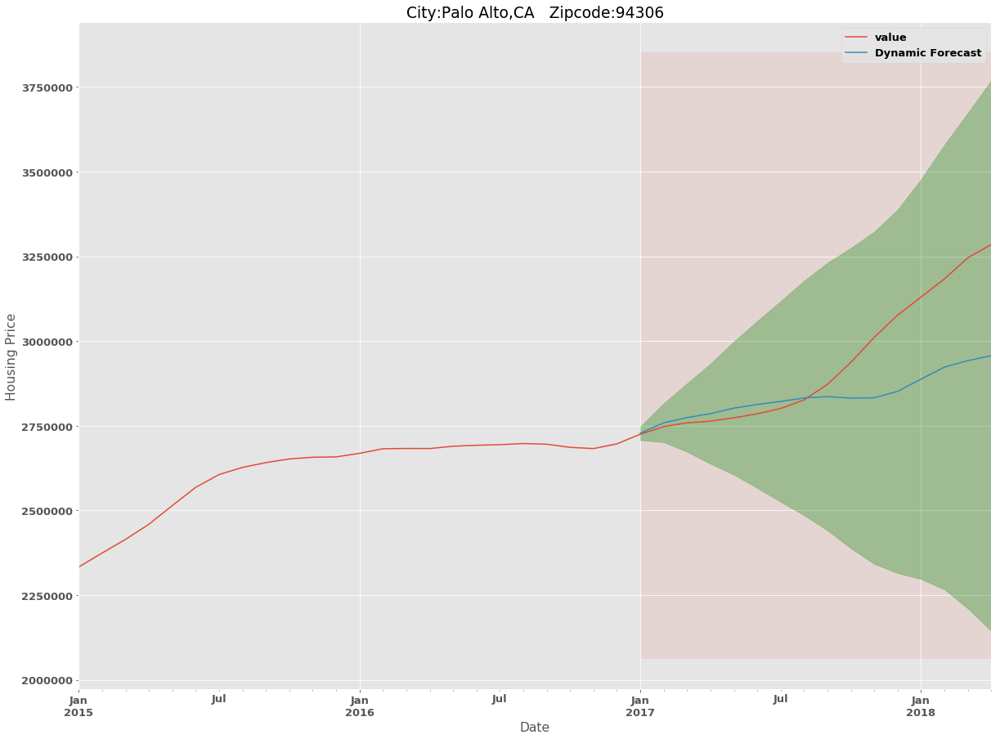

City:Redwood City,CA   Zipcode:94062 

The Root Mean Squared Error of our forecasts is 90100.83
The Root Mean Squared Errorof our forcase is4.603% of mean housing price from 2017.


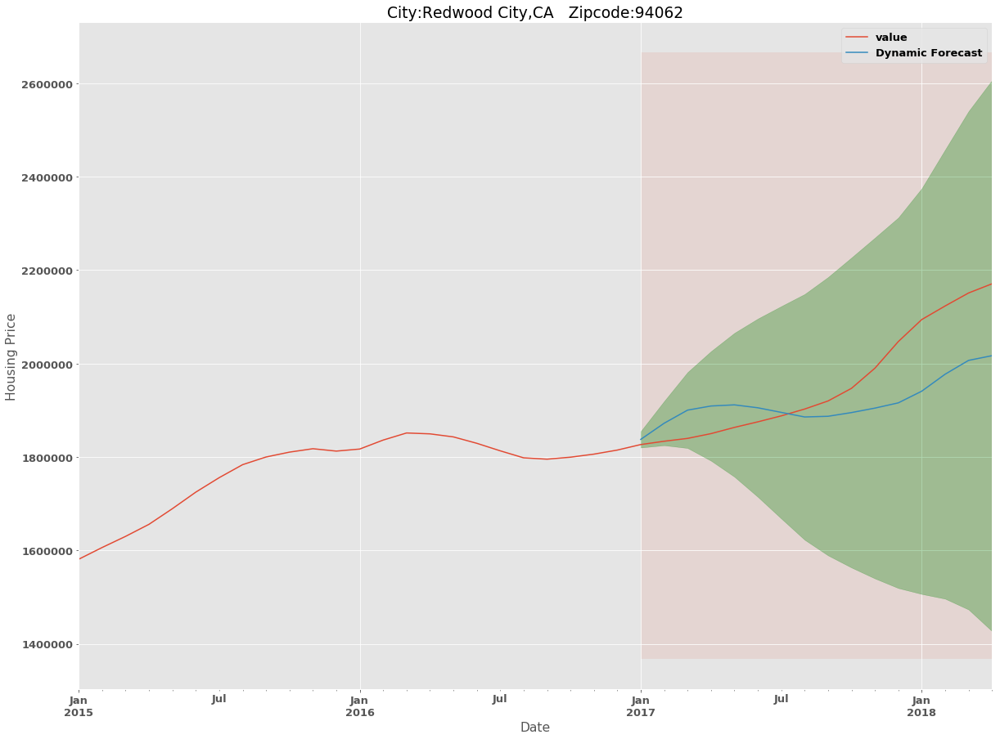

City:Los Altos,CA   Zipcode:94024 

The Root Mean Squared Error of our forecasts is 101965.27
The Root Mean Squared Errorof our forcase is3.203% of mean housing price from 2017.


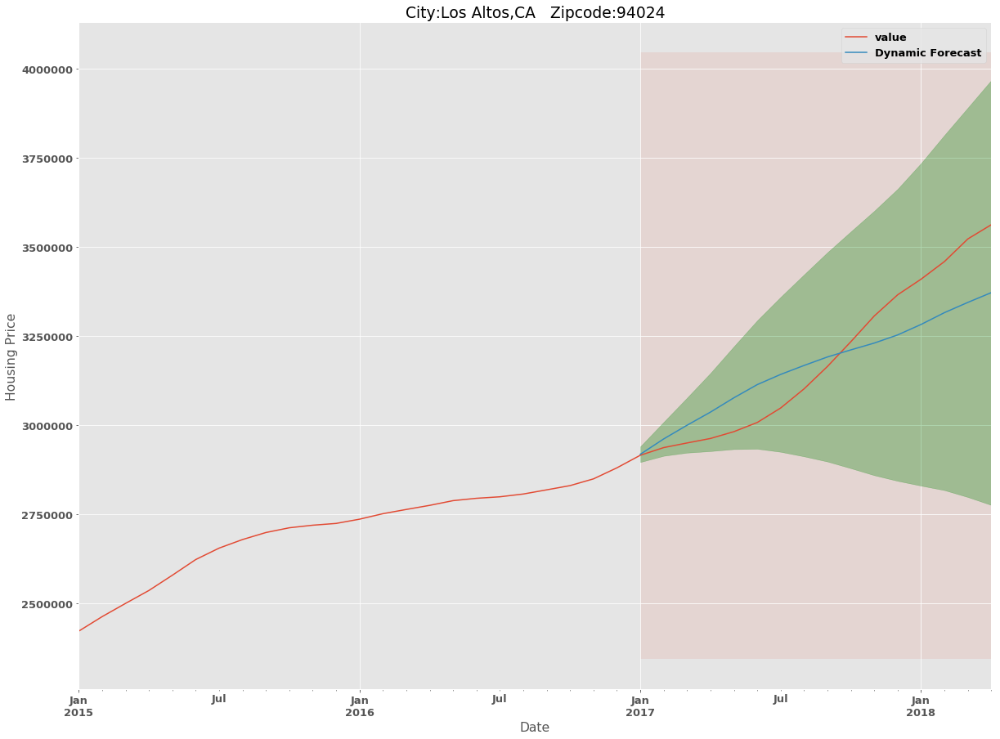

City:Los Altos,CA   Zipcode:94022 

The Root Mean Squared Error of our forecasts is 145540.53
The Root Mean Squared Errorof our forcase is3.735% of mean housing price from 2017.


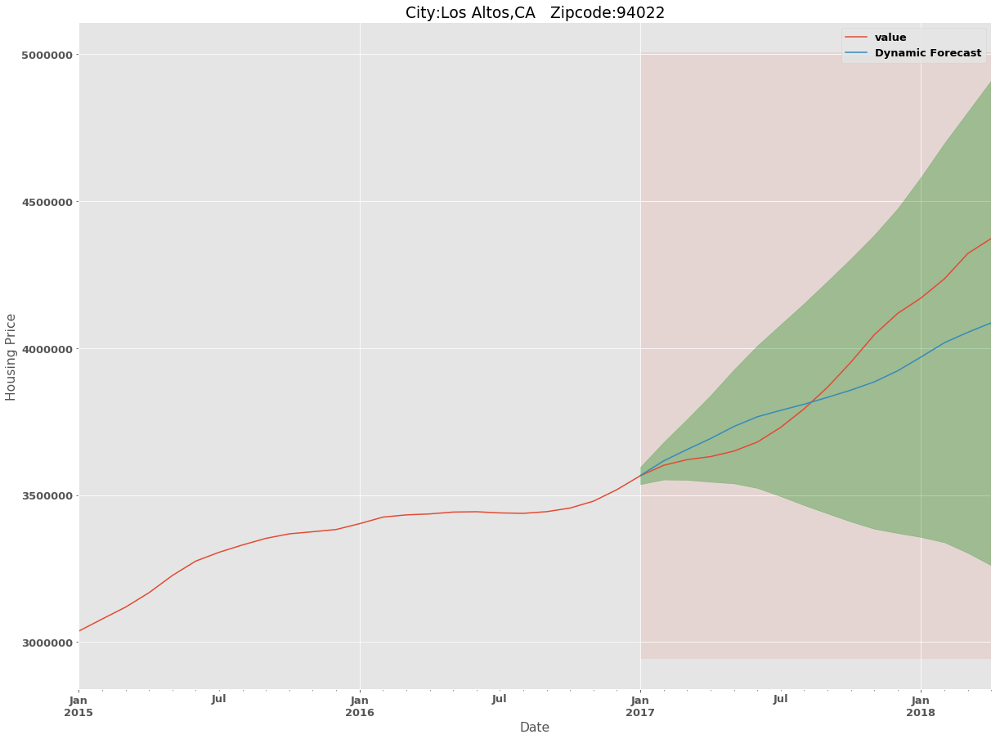

City:San Jose,CA   Zipcode:95135 

The Root Mean Squared Error of our forecasts is 85644.34
The Root Mean Squared Errorof our forcase is6.016% of mean housing price from 2017.


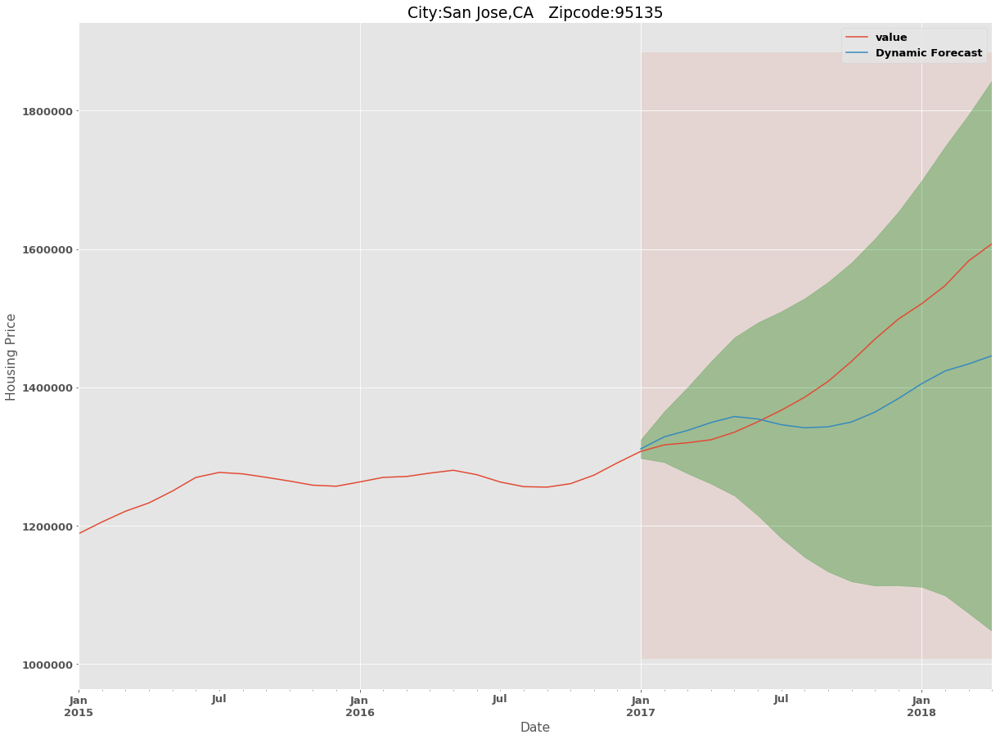

City:Mountain View,CA   Zipcode:94041 

The Root Mean Squared Error of our forecasts is 181894.44
The Root Mean Squared Errorof our forcase is9.346% of mean housing price from 2017.


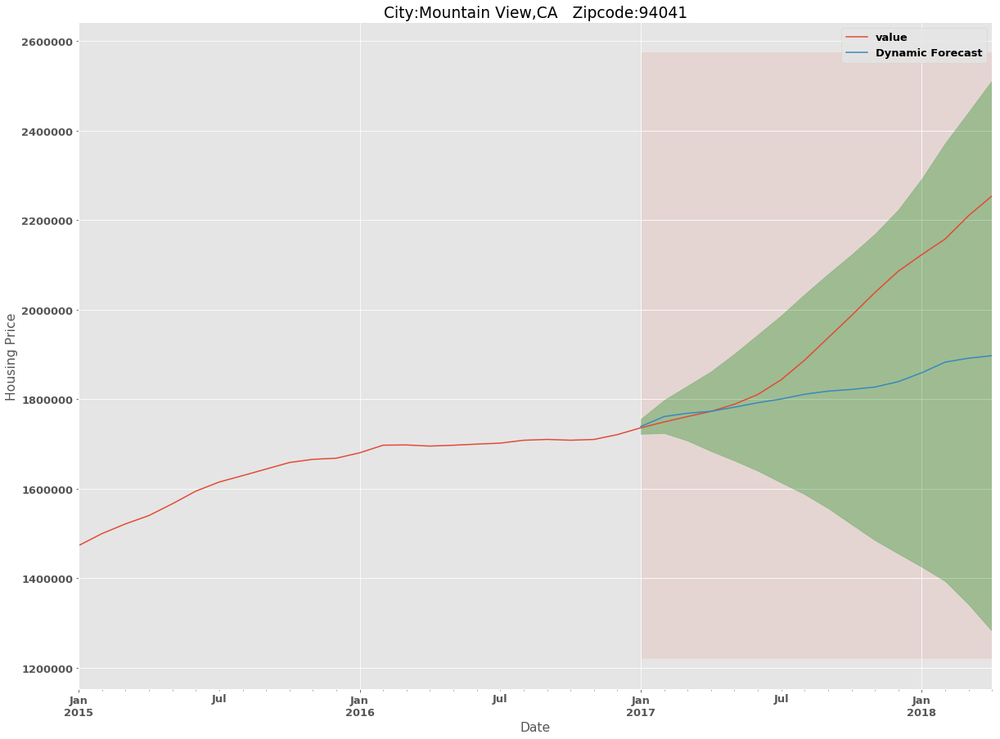

City:Noyack,NY   Zipcode:11963 

The Root Mean Squared Error of our forecasts is 79732.03
The Root Mean Squared Errorof our forcase is5.031% of mean housing price from 2017.


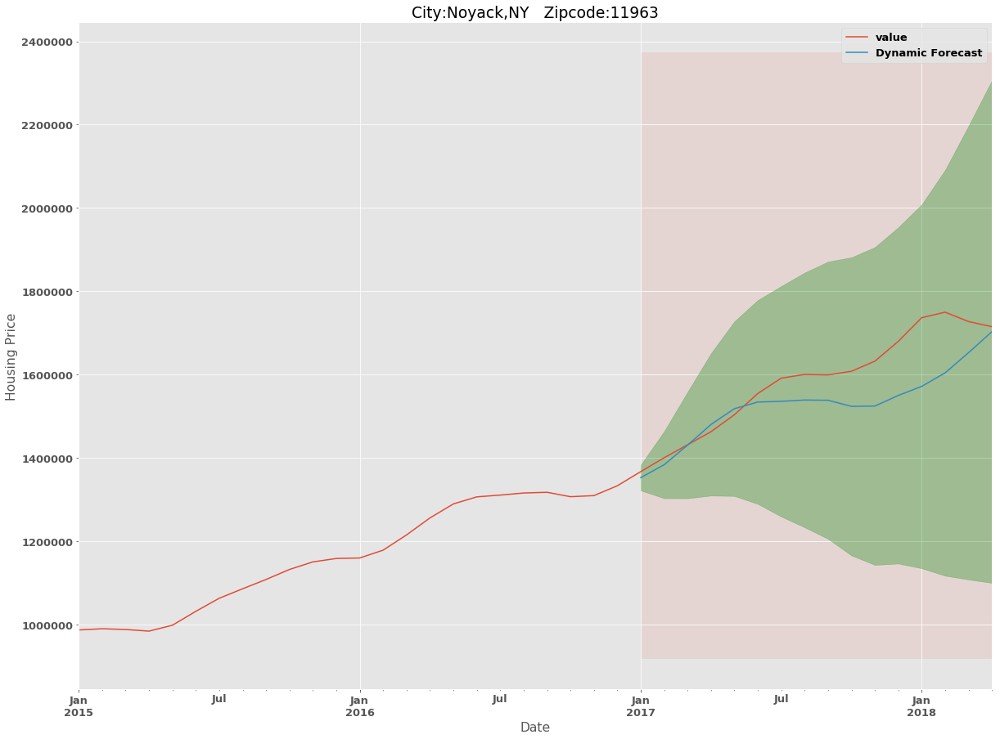

City:Los Gatos,CA   Zipcode:95030 

The Root Mean Squared Error of our forecasts is 104210.24
The Root Mean Squared Errorof our forcase is3.78% of mean housing price from 2017.


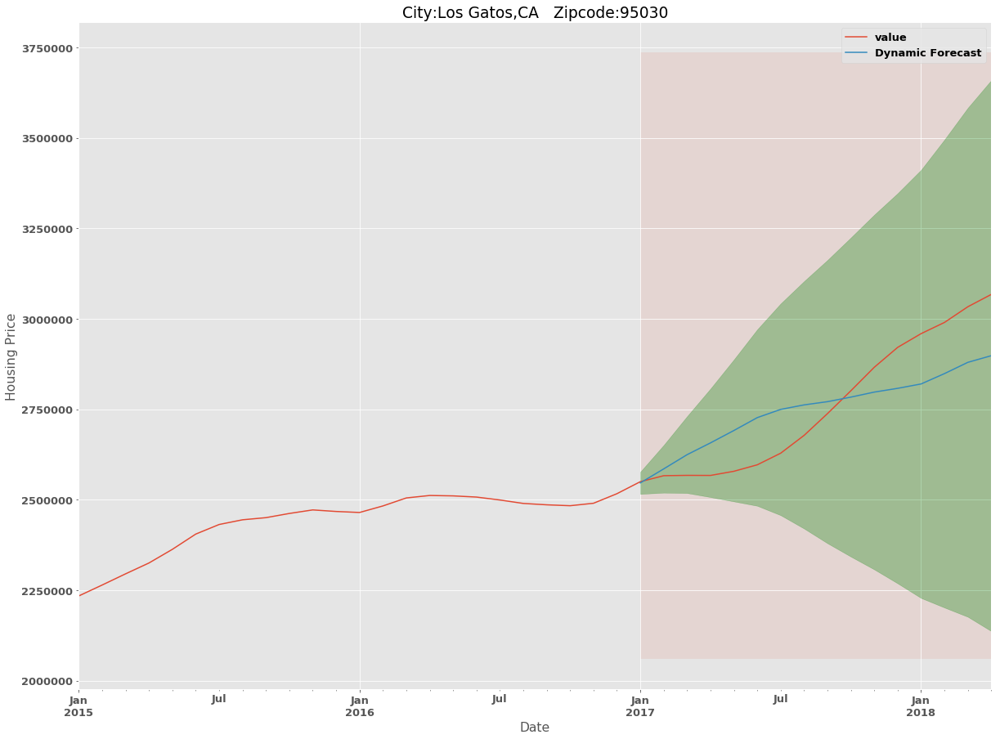

City:Aspen,CO   Zipcode:81611 

The Root Mean Squared Error of our forecasts is 334832.6
The Root Mean Squared Errorof our forcase is7.947% of mean housing price from 2017.


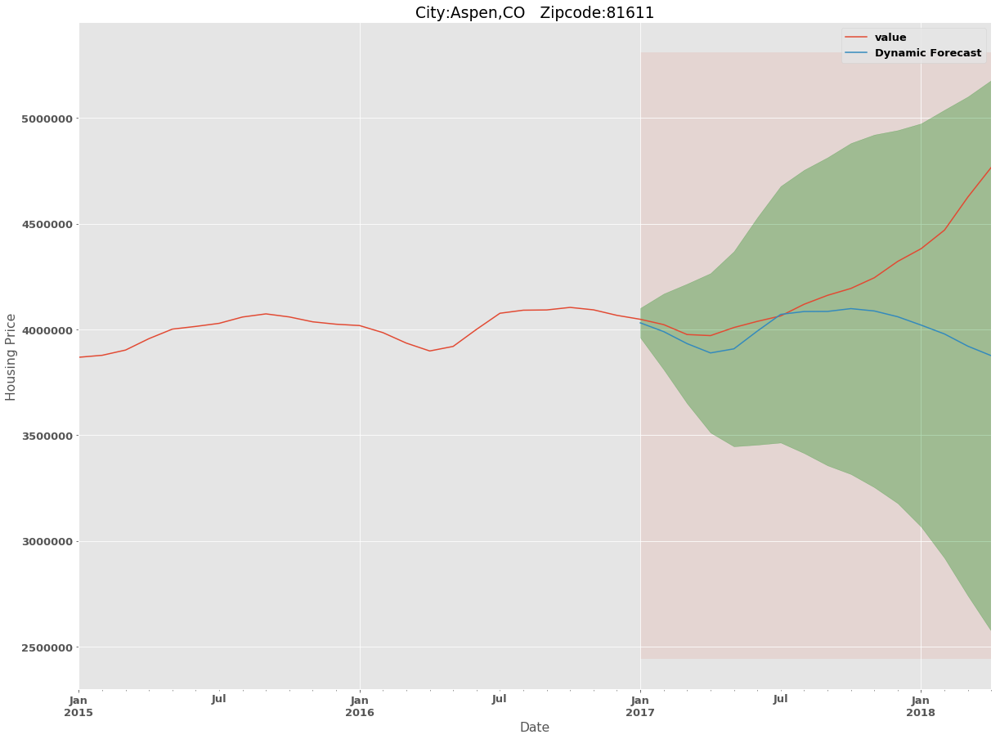

City:San Jose,CA   Zipcode:95130 

The Root Mean Squared Error of our forecasts is 94411.89
The Root Mean Squared Errorof our forcase is6.796% of mean housing price from 2017.


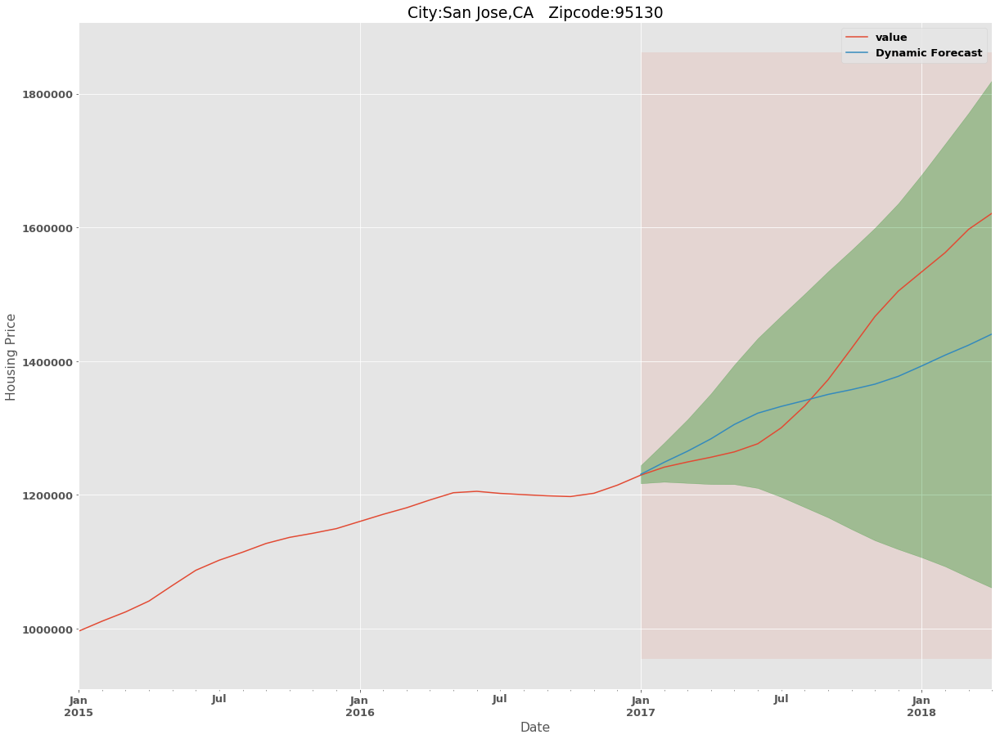

City:Avalon,NJ   Zipcode:8202 

The Root Mean Squared Error of our forecasts is 103910.21
The Root Mean Squared Errorof our forcase is6.88% of mean housing price from 2017.


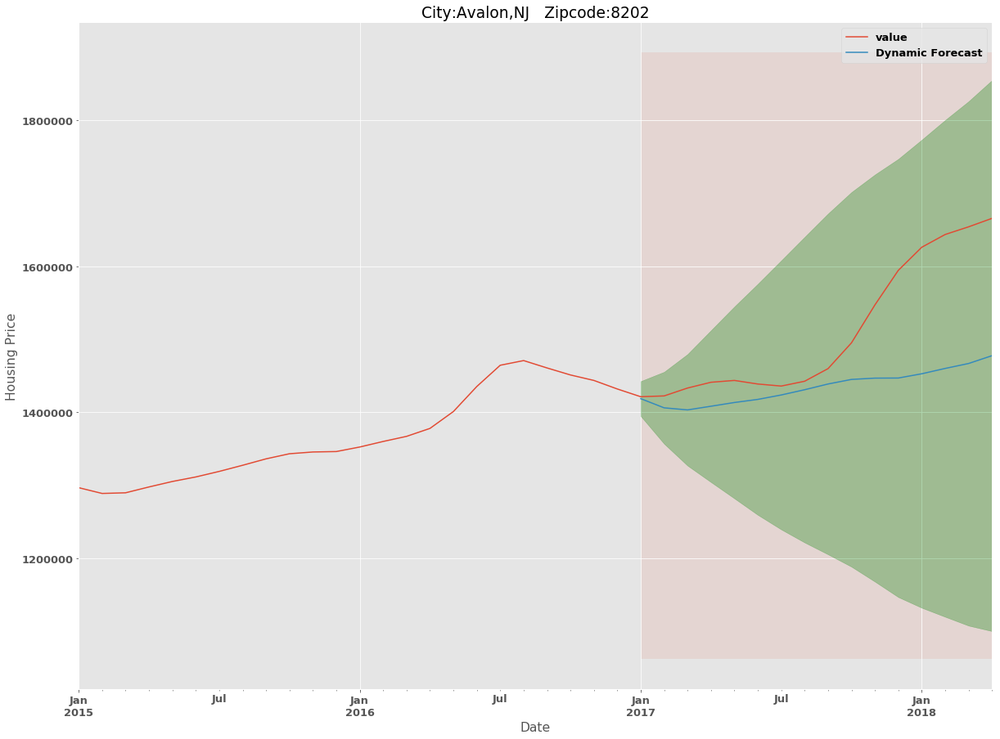

City:Bridgehampton,NY   Zipcode:11932 

The Root Mean Squared Error of our forecasts is 71223.55
The Root Mean Squared Errorof our forcase is3.11% of mean housing price from 2017.


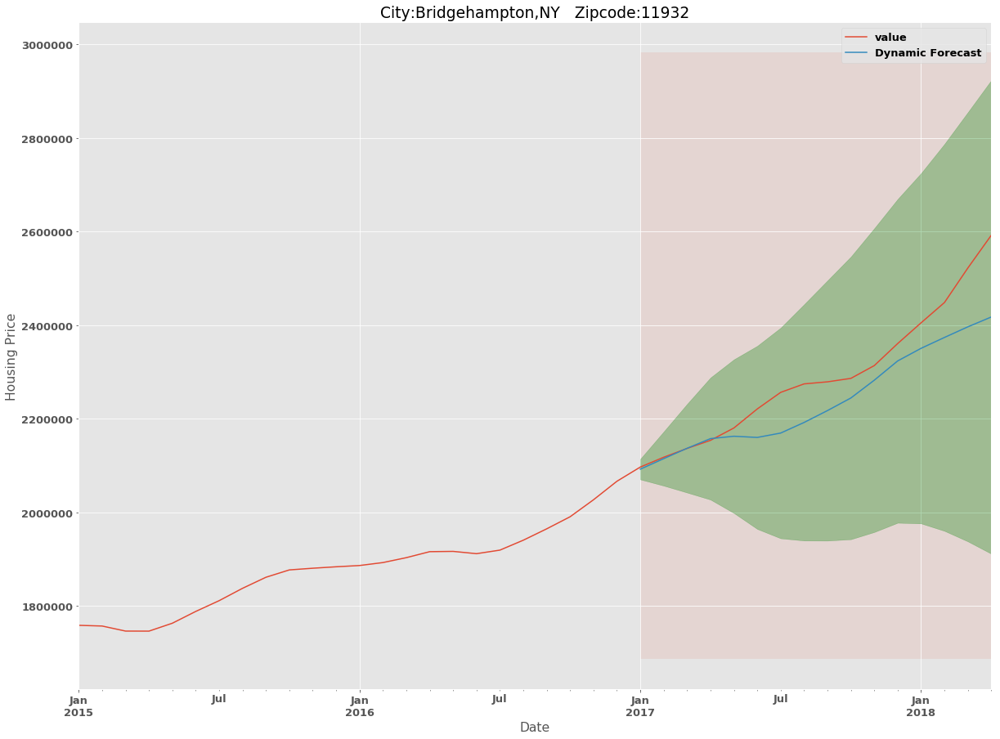

In [39]:
# Plot the dynamic forecast with confidence intervals as above
for i , pred_dynamic in enumerate(pred_dynamics):
    series = timeseries[i][1]
    
    
    
    # Get the Real and predicted values
    series_forecasted = pred_dynamic[0].predicted_mean
    series_truth = series['2017-01-01':].squeeze()

    # series_truth.squeeze()
    # Compute the mean square error
    rmse = np.sqrt(((series_forecasted-series_truth)**2).mean())

    print(titles[i],'\n')
    print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse, 2)))
    print('The root mean squared error'.title()
          + 'of our forcase is'
          +'{}% of mean housing price from 2017.'.format(round(rmse/series_truth.mean()*100,3)))
    # The Mean Squared Error of our forecasts is 0.07
    
    
    ax = series['2015':].plot(label='observed', figsize=(20, 15))
    pred_dynamic[0].predicted_mean.plot(label='Dynamic Forecast', ax=ax)

    ax.fill_between(pred_dynamic[1].index,
                    pred_dynamic[1].iloc[:, 0],
                    pred_dynamic[1].iloc[:, 1], color='g', alpha=.3)

    ax.fill_betweenx(ax.get_ylim(), pd.to_datetime('2017-01-01'), series_forecasted.index[-1], alpha=.1, zorder=-1)

    ax.set_xlabel('Date')
    ax.set_ylabel('Housing Price')
    ax.set_title(titles[i])
    plt.legend()
    plt.show()

With dynamic forecasting, the predictions has lower accuracy than the prediction with the one step forecasting. But the RMSE values are about 7% or less compare to the mean housing value between 2017 and 2018. 

# Producing and Visualizing Forecasts

In [40]:
forecasts=[]
for output in outputs:
    # Get forecast 500 steps ahead in future
    prediction = output.get_forecast(steps=60)
    # Get confidence intervals of forecasts
    pred_conf = prediction.conf_int()
    forecasts.append((prediction, pred_conf))

In [53]:
forecasts[0][0].predicted_mean['2021']

2021-01-01    3.934776e+06
2021-02-01    3.982621e+06
2021-03-01    4.033305e+06
2021-04-01    4.071255e+06
2021-05-01    4.112028e+06
2021-06-01    4.151494e+06
2021-07-01    4.192142e+06
2021-08-01    4.238002e+06
2021-09-01    4.292669e+06
2021-10-01    4.352465e+06
2021-11-01    4.414248e+06
2021-12-01    4.469482e+06
Freq: MS, dtype: float64

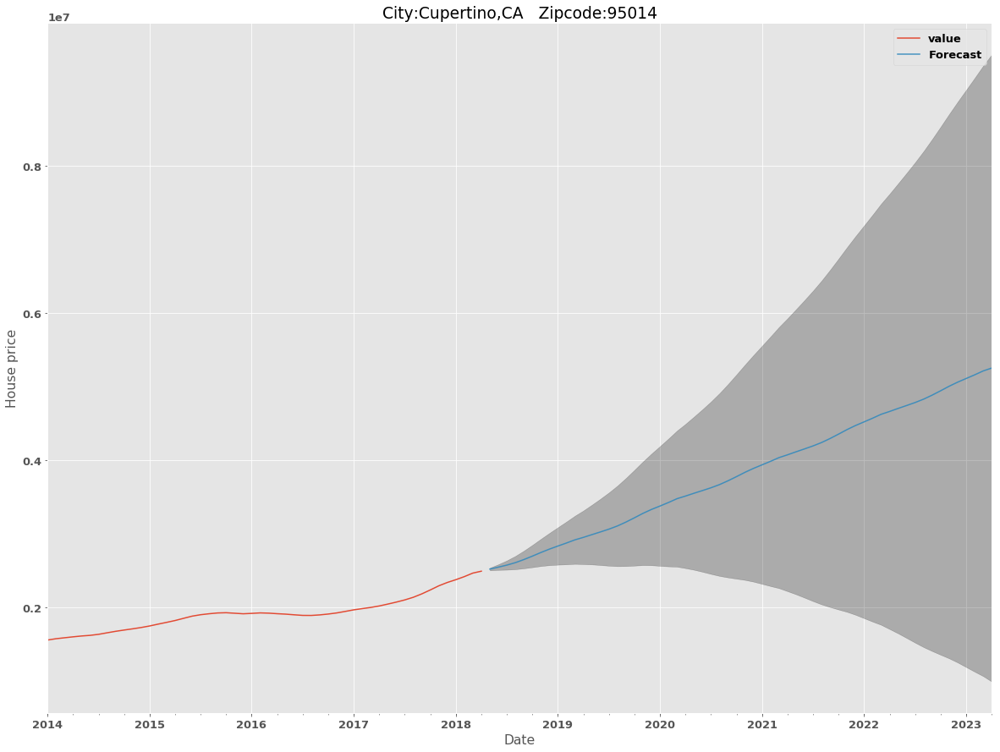

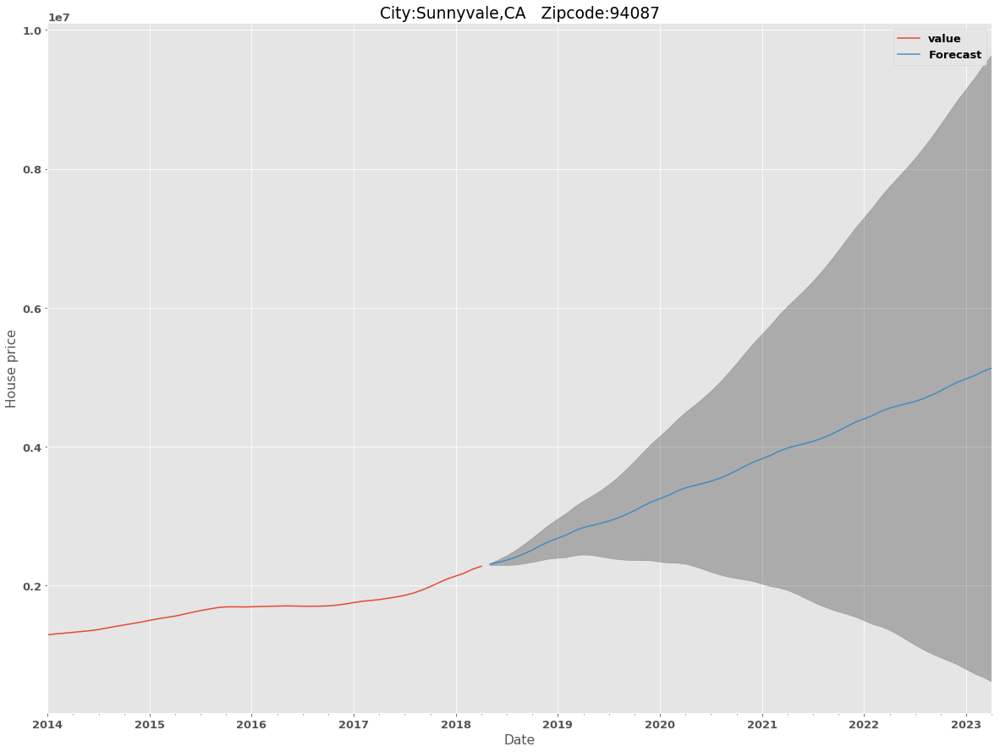

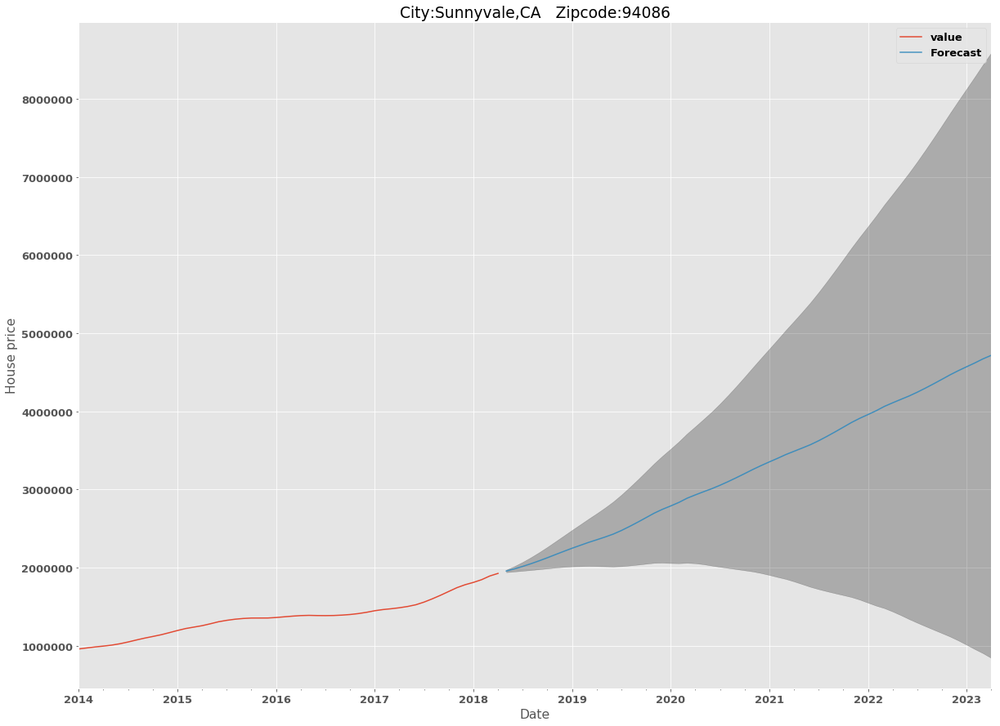

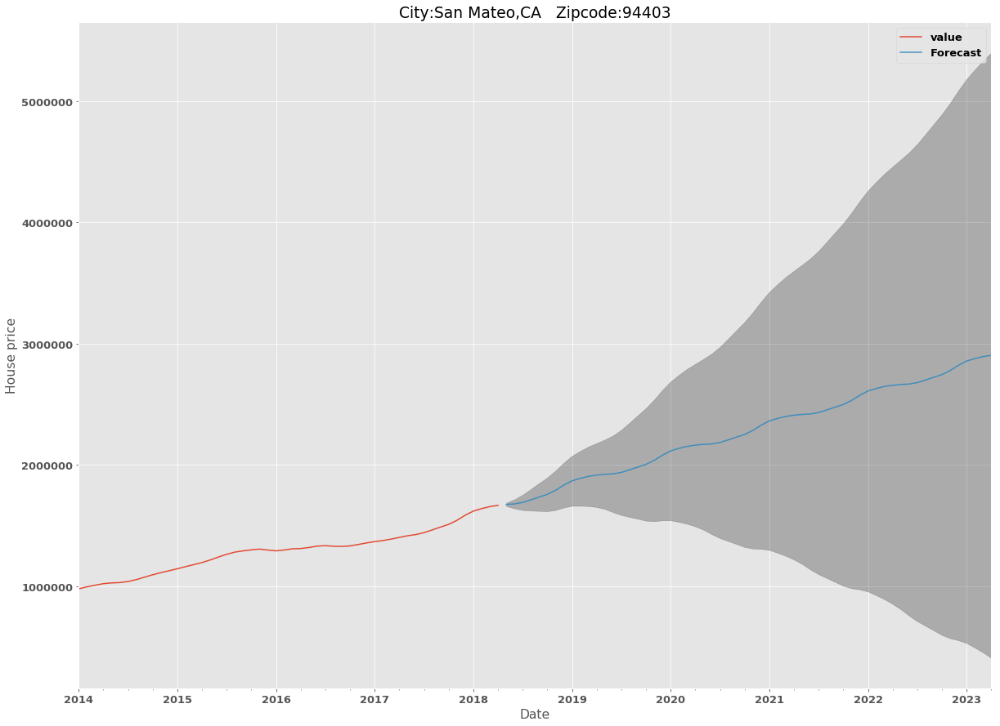

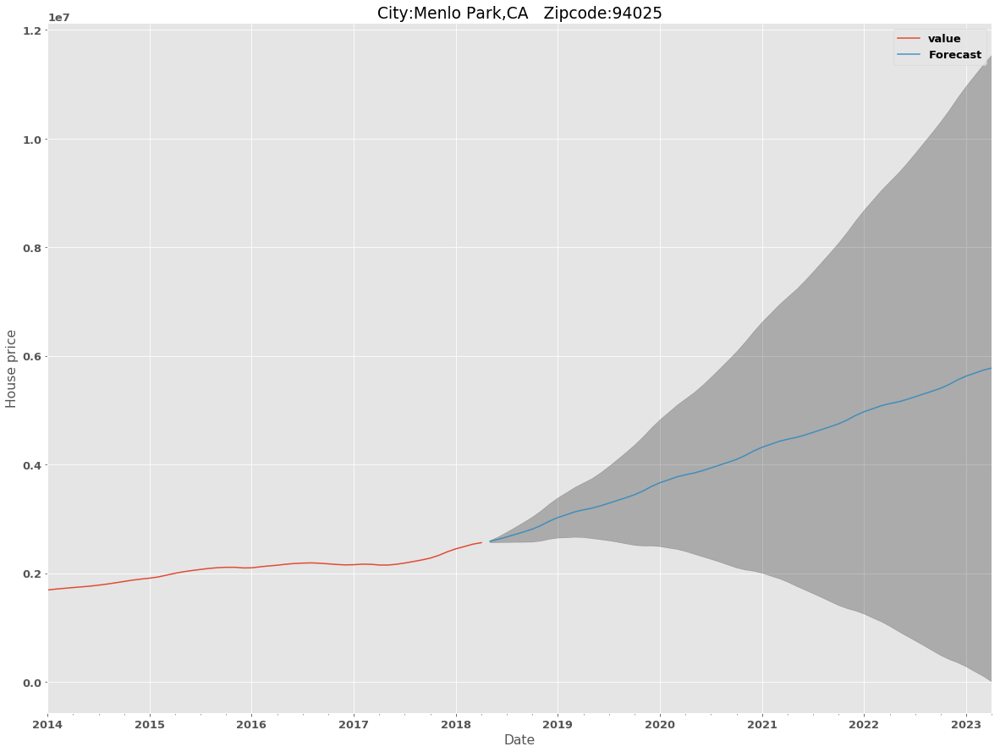

...

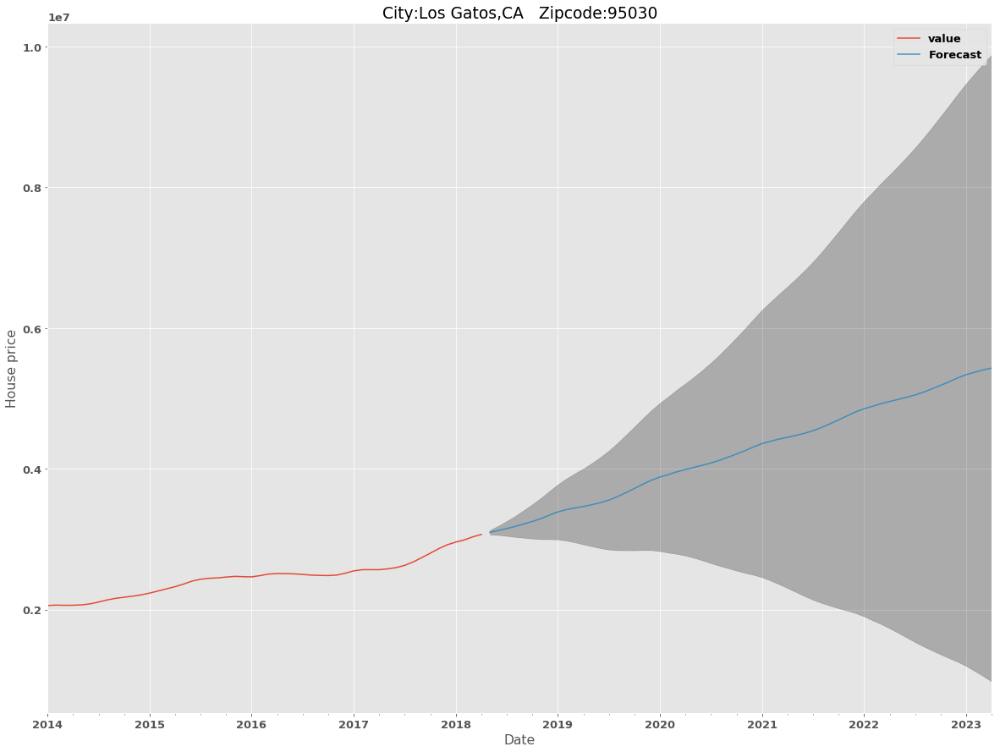

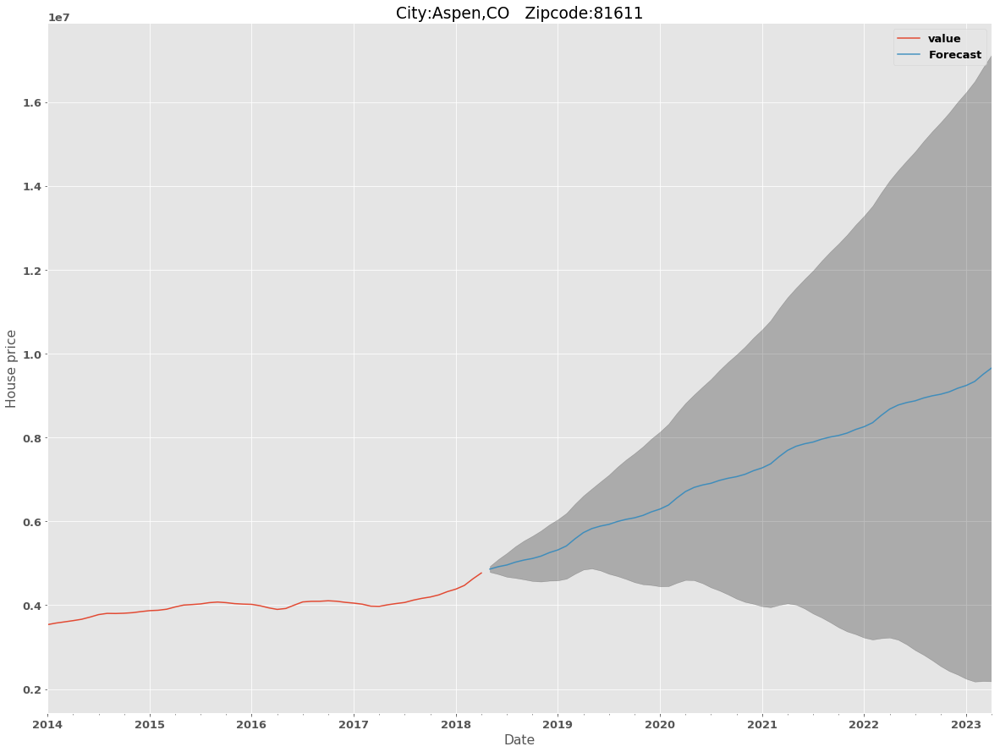

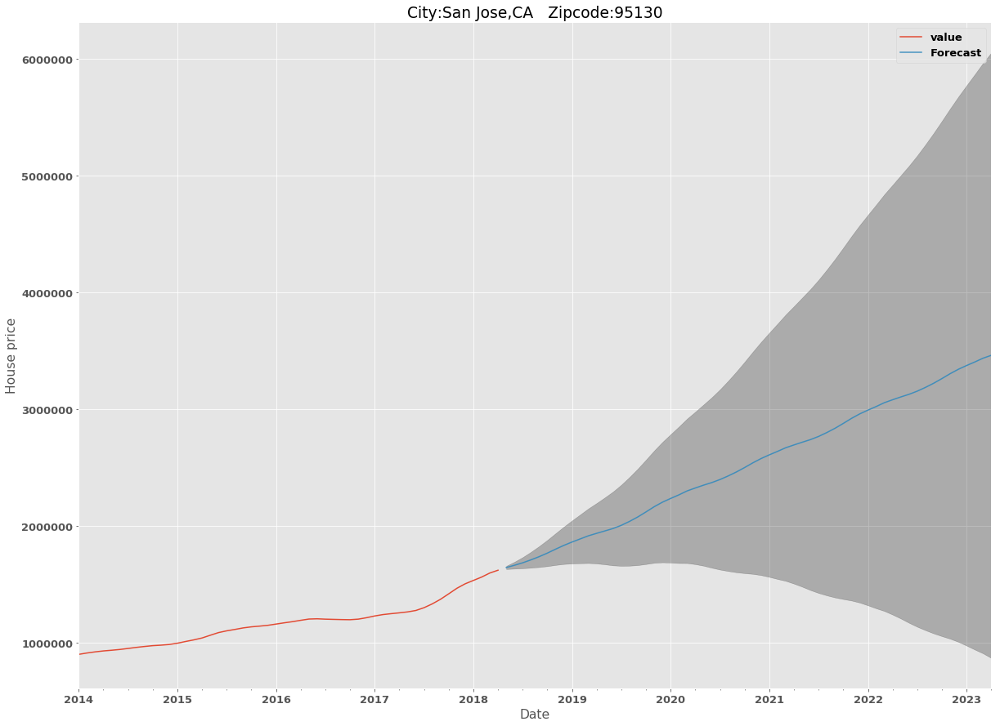

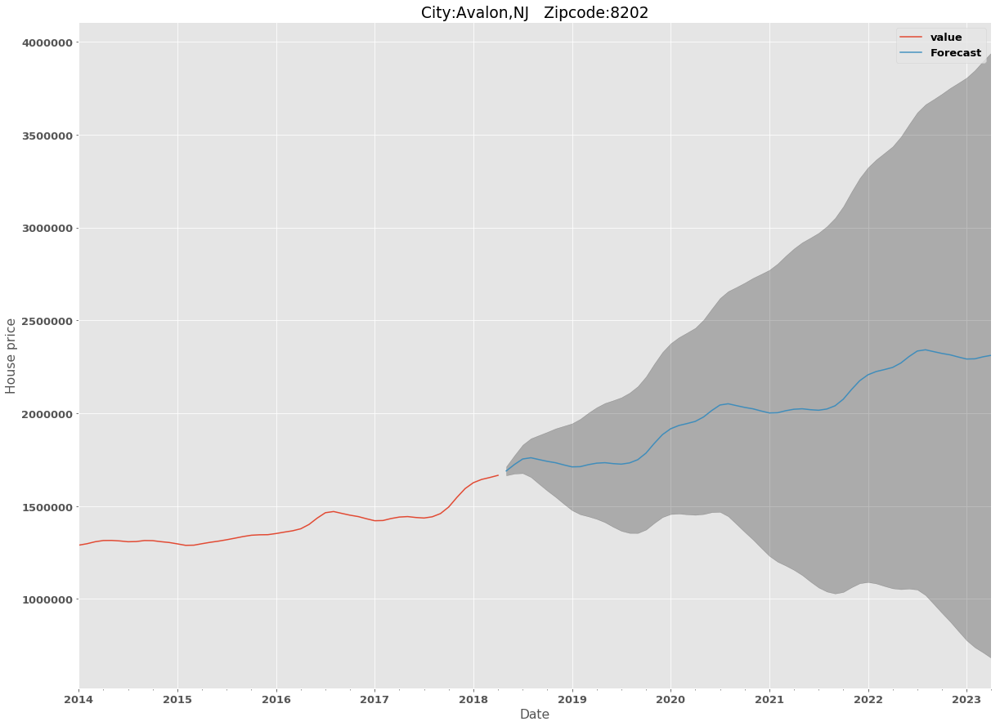

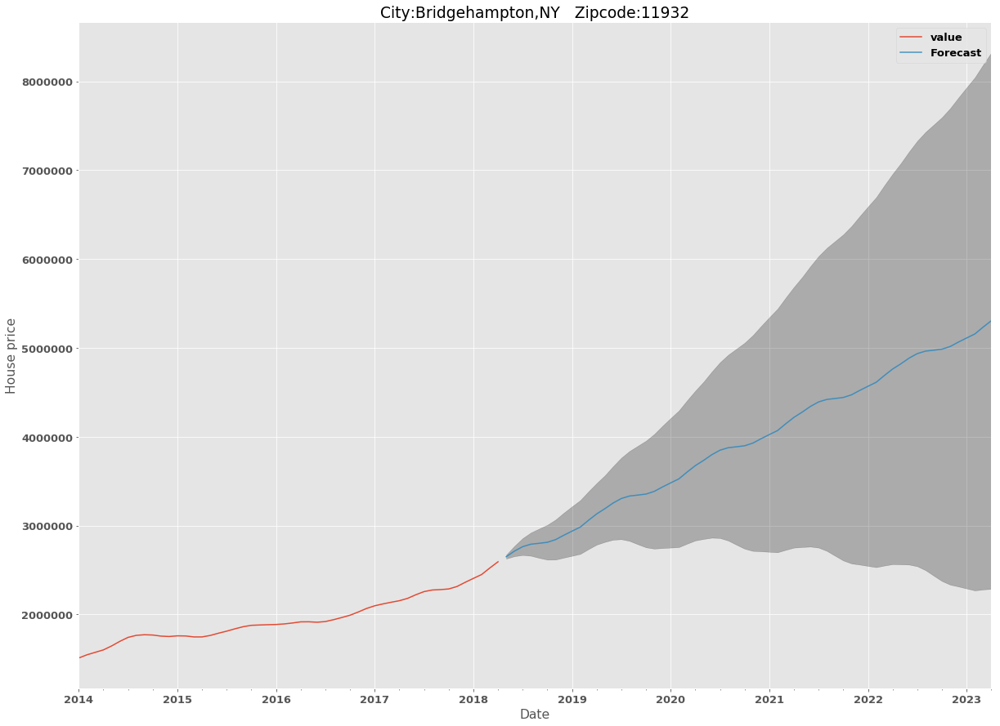

In [41]:
for i, prediction in enumerate(forecasts):
    series = timeseries[i][1]
    # Plot real vs predicted values along with confidence interval
    rcParams['figure.figsize']=20,15
    # Plot observed values
    ax = series.plot(label ='observed')
    # Plot predicted values
    prediction[0].predicted_mean.plot(ax= ax, label ='Forecast', alpha =0.9)
    # Plot the range for confidence intervals
    ax.fill_between(prediction[1].index,
                   prediction[1].iloc[:,0],
                   prediction[1].iloc[:,1], color='k', alpha=0.25)
    # Set axes labels
    ax.set_xlabel('Date')
    ax.set_ylabel('House price')
    ax.set_title(titles[i])
    plt.legend()

    plt.show()

# Interpreting Results

As the accuracy dynamic forecasting drops as the time of forecasting gets further from the given data, I picked the time for future house price value to calculate profit margin to be April 2021. 
Now, we calculate the profit margin as the difference between the house price in April 2018 and in April 2021. 

## Rank by the increasing rate (%)

In [318]:
profits =[]
compare = []
for i, prediction in enumerate(forecasts):
   
    actual =  timeseries[i][1]['2018-04'].values[0][0] 
    future = prediction[0].predicted_mean['2021-04'].values[0]
    limits = prediction[1]['2020-04'].values[0]
    
    profit = future-actual
    compare.append(((i,titles[i]),round(profit,0),round(profit/actual*100,0), actual, future, limits))
    
    #sorting the profit margins by the relative quantities (% increase)
    compare_sorted_rel = sorted(compare, key = lambda x:x[2], reverse = True)

In [319]:
topbar =[]
bottombar =[]
yerrs =[]
xs =[]
label =[]
for i in range(len(compare_sorted_rel)):
    topbar.append(round(compare_sorted_rel[i][4],0))
    bottombar.append(round(compare_sorted_rel[i][3],0))
    yerrs.append(round(compare_sorted_rel[i][-1][1]- compare_sorted_rel[i][-2],0))
    idx = compare_sorted_rel[i][0][0]
    label.append(str(compare_sorted_rel[i][2])[:-2]+'%')
    xs.append(str(timeseries[idx][0].RegionName.values[0]))

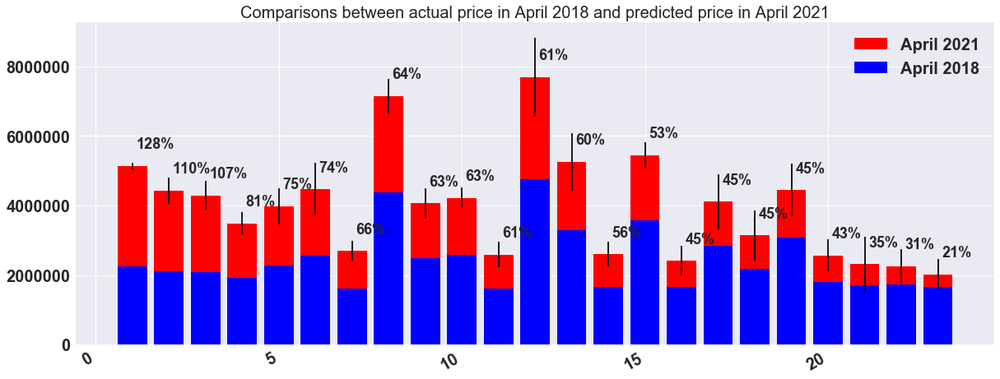

In [320]:
plt.style.use('seaborn')
fig = plt.figure(figsize =(20,8))
x = range(1,len(topbar)+1)
plt.bar(x,topbar,yerr=yerrs, color = "red", label ='April 2021')
plt.bar(x, bottombar, color = "blue", label ='April 2018')

for i in range(len(label)):
    plt.text(x=x[i]+0.1,y=topbar[i]+500000, s=label[i],fontsize = 18)

plt.gcf().autofmt_xdate()
plt.legend(fontsize = 20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ticklabel_format(style ='plain')
plt.title('Comparisons between actual price in April 2018 and predicted price in April 2021', fontsize=20)
plt.gcf().autofmt_xdate()

In [321]:
# compare.append(((i,titles[i]),round(profit,0),round(profit/actual*100,0), actual, future, limits))
for i in range(len(compare_sorted_rel)):
    print(compare_sorted_rel[i][0][1], '\t',label[i])

City:Mountain View,CA   Zipcode:94041 	 128%
City:San Jose,CA   Zipcode:95129 	 110%
City:Mountain View,CA   Zipcode:94043 	 107%
City:Sunnyvale,CA   Zipcode:94086 	 81%
City:Sunnyvale,CA   Zipcode:94087 	 75%
City:Menlo Park,CA   Zipcode:94025 	 74%
City:San Jose,CA   Zipcode:95130 	 66%
City:Los Altos,CA   Zipcode:94022 	 64%
City:Cupertino,CA   Zipcode:95014 	 63%
City:Bridgehampton,NY   Zipcode:11932 	 63%
City:San Jose,CA   Zipcode:95135 	 61%
City:Aspen,CO   Zipcode:81611 	 61%
City:Palo Alto,CA   Zipcode:94306 	 60%
City:San Jose,CA   Zipcode:95120 	 56%
City:Los Altos,CA   Zipcode:94024 	 53%
City:San Mateo,CA   Zipcode:94403 	 45%
City:Mountain View,CA   Zipcode:94040 	 45%
City:Redwood City,CA   Zipcode:94062 	 45%
City:Los Gatos,CA   Zipcode:95030 	 45%
City:Foster City,CA   Zipcode:94404 	 43%
City:Noyack,NY   Zipcode:11963 	 35%
City:Redwood City,CA   Zipcode:94061 	 31%
City:Avalon,NJ   Zipcode:8202 	 21%


We could pick the top 5 zip codes from the sorted list above. However, there are always uncertainty about future and to lower the risk of unpredictability of the real estate market, I decide to pick 5 zip codes with 5 different cities. That means, although there are two zip codes in Mountain View, CA in top 5 zip codes in  profit margins, I would pick one from the two, 94041 which has higher profit margin. 

Therefore the best 5 zip codes for real estate investment are :

| rank  |city  |zip code   | increasing rate  |
|---|---|---|---|
|1   |Mountain View,CA   | 94041  | 128%  |   
|2 |San Jose,CA |95129| 	 110%   | 
|3|Sunnyvale,CA |94086 |	 81%|
|4|Menlo Park,CA |94025| 	 74%|
|5|Los Altos,CA |94022| 	 64%|

In [322]:
for i in [0,1,3,5,7]:
    print(compare_sorted_rel[i],'\n')

((16, 'City:Mountain View,CA   Zipcode:94041'), 2882855.0, 128.0, 2254100.0, 5136954.903485765, array([2767432.32586444, 5238776.36107177])) 

((7, 'City:San Jose,CA   Zipcode:95129'), 2319348.0, 110.0, 2110700.0, 4430048.495259734, array([2271093.80765451, 4805852.94570989])) 

((2, 'City:Sunnyvale,CA   Zipcode:94086'), 1562656.0, 81.0, 1926800.0, 3489455.5817529857, array([2055838.34403485, 3807177.40936212])) 

((4, 'City:Menlo Park,CA   Zipcode:94025'), 1903446.0, 74.0, 2561200.0, 4464645.573494186, array([2404999.26100057, 5216635.36798719])) 

((14, 'City:Los Altos,CA   Zipcode:94022'), 2777221.0, 64.0, 4372600.0, 7149821.072507822, array([4722938.09746202, 7649461.98097827])) 



In [323]:
topbar =[]
bottombar =[]
yerrs =[]
xs =[]
label =[]
for i in  [0,1,3,5,7]:
    topbar.append(round(compare_sorted_rel[i][4],0))
    bottombar.append(round(compare_sorted_rel[i][3],0))
    yerrs.append(round(compare_sorted_rel[i][-1][1]- compare_sorted_rel[i][-2],0))
    idx = compare_sorted_rel[i][0][0]
    label.append(str(compare_sorted_rel[i][2])[:-2]+'%')
    xs.append(str(timeseries[idx][0].RegionName.values[0]))

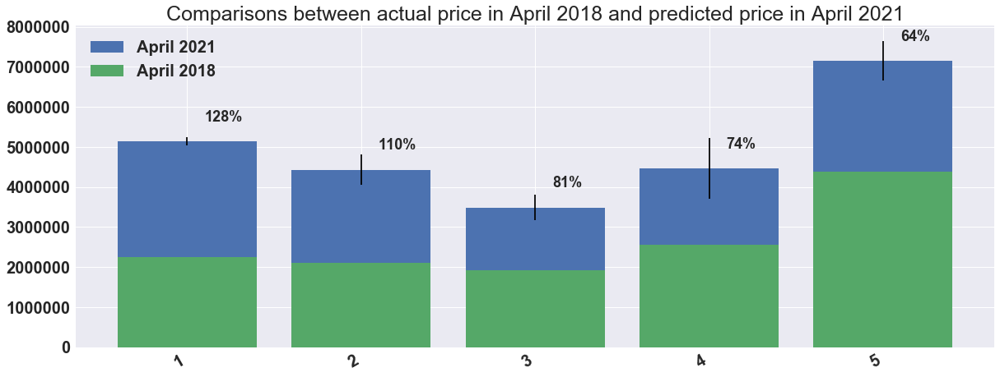

In [328]:
plt.style.use('seaborn')
fig = plt.figure(figsize =(20,8))
x = range(1,len(topbar)+1)
plt.bar(x,topbar,yerr=yerrs,  label ='April 2021')
plt.bar(x, bottombar, label ='April 2018')

for i in range(len(label)):
    plt.text(x=x[i]+0.1,y=topbar[i]+500000, s=label[i],fontsize = 18)

plt.gcf().autofmt_xdate()
plt.legend(fontsize = 20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ticklabel_format(style ='plain')
plt.title('Comparisons between actual price in April 2018 and predicted price in April 2021', fontsize=25)
plt.gcf().autofmt_xdate()
#To save figure as pnp format
fig.savefig('top5zip.png', dpi=400, bbox_inches="tight") #Saving fig